# Extract all fitted params from many dates in OGA butler

- Author : Sylvie Dagoret-Campagne
- creation date : 2024-01-17
- last update : 2024-01-22
- affiliation : IJCLab/IN2P3/CNRS


## Imports

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import matplotlib.gridspec as gridspec
from spectractor.tools import from_lambda_to_colormap, wavelength_to_rgb
#%matplotlib widget 
import h5py
from scipy import interpolate
from astropy.time import Time

In [2]:
import spectractor
from spectractor.simulation.throughput import load_transmission,plot_transmission_simple,TelescopeTransmission
from spectractor import parameters
from spectractor.extractor import dispersers
from spectractor.config import load_config,set_logger
import os,sys

In [3]:
plt.rcParams["figure.figsize"] = (8,8)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'
plt.rcParams['legend.fontsize']=  12
plt.rcParams['font.size'] = 12

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
machine_name = os.uname().nodename
print(machine_name)
if 'sdf' in machine_name:
    #machine_name_usdf = 'sdfrome001'
    #machine_name_notebook platform = 'dagoret-nb'
    print("Set environement for USDF")
    newpythonpath = os.path.join(os.getenv("HOME"),"repos/repos_w_2023_44/rubinsimphot/src")
    sys.path.append(newpythonpath)
    newpythonpath = os.path.join(os.getenv("HOME"),"rubin-user/RubinLSSTPhotometricCorrTuto/notebooks/lib")
    sys.path.append(newpythonpath)   
elif "dagoret-nb" in machine_name:
    print("Set environement for Rubin Platform at  USDF")
    newpythonpath = os.path.join(os.getenv("HOME"),"repos/repos_w_2023_44/rubinsimphot/src")
    sys.path.append(newpythonpath)
    newpythonpath = os.path.join(os.getenv("HOME"),"rubin-user/RubinLSSTPhotometricCorrTuto/notebooks/lib")
    sys.path.append(newpythonpath)
elif 'mac' in machine_name:
    print("Be sure to run this notebook in conda environnement named conda_py310")
else:
    print("Your current machine name is {machine_name}. Check your python environment")

dagoret-nb
Set environement for Rubin Platform at  USDF


In [6]:
sys.path.append("../lib")
from libanaspectra import *

In [7]:
from rubinsimphot.phot_utils import Bandpass, Sed
from rubinsimphot.data.data_sets import  get_data_dir

#README.md        darksky.dat      filter_r.dat     hardware_g.dat   hardware_y.dat   lens3.dat        total_g.dat      total_y.dat
#README_SOURCE.md detector.dat     filter_u.dat     hardware_i.dat   hardware_z.dat   m1.dat           total_i.dat      total_z.dat
#atmos_10.dat     filter_g.dat     filter_y.dat     hardware_r.dat   lens1.dat        m2.dat           total_r.dat      version_info
#atmos_std.dat    filter_i.dat     filter_z.dat     hardware_u.dat   lens2.dat        m3.dat           total_u.dat
hardware_filenames = ["hardware_u.dat","hardware_g.dat","hardware_r.dat","hardware_i.dat","hardware_z.dat","hardware_y.dat"] 
filter_filenames = ["filter_u.dat","filter_g.dat","filter_r.dat","filter_i.dat","filter_z.dat","filter_y.dat" ]
total_filenames = ["total_u.dat","total_g.dat","total_r.dat","total_i.dat","total_z.dat","total_y.dat" ]
filter_tagnames = ["u","g","r","i","z","y"]
Filter_tagnames = ["U","G","R","I","Z","Y"]
filtercolor_tagnames = ["u-g","g-r","r-i","i-z","z-y"]
Filtercolor_tagnames = ["U-G","G-R","R-I","I-Y","Z-Y"]
filter_color = ["b","g","r","orange","grey","k"]
NFILT=len(filter_filenames)

WLMIN=300.
WLMAX=1100.
WLBIN=1.
NWLBIN=int((WLMAX-WLMIN)/WLBIN)
WL=np.linspace(WLMIN,WLMAX,NWLBIN)

In [8]:
#FILTERWL: precalculated array containing center, boundaries and width of each filter.
#index 0 : minimum wavelength of filter border
#index 1 : minimum wavelength of filter border
#index 2 : center wavelength of filter
#index 3 : filter width


FILTERWL = np.array([[ 324.03003755,  402.12765957,  363.59690349,   78.09762203],
       [ 392.11514393,  561.32665832,  473.54069923,  169.21151439],
       [ 542.3028786 ,  700.50062578,  619.49926767,  158.19774718],
       [ 681.47684606,  827.65957447,  752.01084117,  146.18272841],
       [ 808.63579474,  932.79098874,  868.488419  ,  124.15519399],
       [ 914.76846058, 1044.93116395,  969.10570859,  130.16270338]])

FILTERWL_auxtel = np.array([[ 352.7 ,  395.9 ,  374.3 ,   43.2 ],
                     [ 387.6 ,  566.2 ,  476.9 ,  178.6 ],
                     [ 541.4 ,  715.5 ,  628.45,  174.1 ],
                     [ 673.3 ,  870.9 ,  772.1 ,  197.6 ],
                     [ 805.6 , 1090.7 ,  948.15,  285.1 ]])


F0 = 3631.0 # Jy 1, Jy = 10^{-23} erg.cm^{-2}.s^{-1}.Hz^{-1}
Jy_to_ergcmm2sm1hzm1 = 1e-23
DT = 30.0 # seconds
gel = 1.1
#hP = 6.62607015E-34 # J⋅Hz−1
hP = 6.626196E-27
A  = np.pi*642.3**2 # cm2  Reff=6.423 m
A_auxtel  = 9636.0 # cm2

#ZPT_cont =  2.5 \log_{10} \left(\frac{F_0 A \Delta T}{g_{el} h} \right)
ZPTconst = 2.5*np.log10(F0*Jy_to_ergcmm2sm1hzm1*A*DT/gel/hP)

In [9]:
fdir = get_data_dir()
bandpass_inst = {}
path_rubin_sim_throughput = os.path.join(fdir, 'throughputs', 'baseline')
for index,filename in enumerate(hardware_filenames):
    fullfilename=os.path.join(path_rubin_sim_throughput,filename)
    arr= np.loadtxt(fullfilename)
    # interpolate  filter transmission
    ff = interpolate.interp1d(x=arr[:,0], y=arr[:,1],fill_value="extrapolate")
    fname = filter_tagnames[index]
    bandpass_inst[fname] = Bandpass(wavelen=WL,sb=ff(WL))

In [10]:
fig, axs = plt.subplots(1,1,figsize=(6,4))
# loop on filter
for index,f in enumerate(filter_tagnames):
    
    axs.plot(WL,bandpass_inst[f].sb,color=filter_color[index]) 
    axs.fill_between(WL,bandpass_inst[f].sb,color=filter_color[index],alpha=0.2) 
    axs.axvline(FILTERWL[index,2],color=filter_color[index],linestyle="-.")
    
axs.set_xlabel("$\\lambda$ (nm)")
axs.set_title("Total Rubin-LSST filter throughput")

Text(0.5, 1.0, 'Total Rubin-LSST filter throughput')

In [11]:
#from lsst.summit.utils.utils import checkStackSetup
#checkStackSetup()

In [12]:
import lsst.daf.butler as dafButler

repo = "/repo/main"
repo = "/repo/embargo"
# repo = "LATISS"
butler = dafButler.Butler(repo)
registry = butler.registry

for c in sorted(registry.queryCollections()):
    #if "u/jneveu" in c and "auxtel_atmo" in c:
    #if "u/dagoret" in c:
    if "u/dagoret" in c and "auxtel_atmo" in c:
        print(c)

u/dagoret/auxtel_atmo_202101_v3.0.3_doGainsPTC_rebin2_231208
u/dagoret/auxtel_atmo_202101_v3.0.3_doGainsPTC_rebin2_231208/20231220T142452Z
u/dagoret/auxtel_atmo_202209_v3.0.3_doGainsPTC_rebin2_231221
u/dagoret/auxtel_atmo_202209_v3.0.3_doGainsPTC_rebin2_231221/20231221T125249Z
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208/20231208T215202Z
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsPTC_rebin2_231208
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsPTC_rebin2_231208/20231208T211104Z
u/dagoret/auxtel_atmosphere_202301_v3.0.3_doGainsPTC_rebin2
u/dagoret/auxtel_atmosphere_202301_v3.0.3_doGainsPTC_rebin2/20231208T100936Z
u/dagoret/auxtel_atmosphere_202301_v3.0.3_doGainsPTC_rebin2/20231208T130352Z


## Config

### Config collection

In [13]:
#my_collection = "u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsPTC_rebin2_231208"
#my_collection = "u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208"

# all spectra from September 2022 to december 2023
#the reconstruction done by  LambdaMin = 350.0 and spectractor v3.0.3 in 2023/12/21

my_collection = "u/dagoret/auxtel_atmo_202209_v3.0.3_doGainsPTC_rebin2_231221"
#my_collection = "u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208"

### Config Auxtel

In [14]:
#config_path = "~/repos/repos_w_2023_44/Spectractor/config/auxtel.ini"
#config_path = "/home/d/dagoret/repos/repos_w_2023_44/Spectractor/config/auxtel.ini"
config_fullpath = os.path.join(spectractor.__path__[0],"../config/auxtel.ini")
throughput_filename="multispectra_holo4_003_HD142331_20230802_AuxTel_doGainsPTC_v3.0.3_throughput.txt"

In [15]:
load_config(config_fullpath)

### Config Telescope Throughtput

In [16]:
throughput_fullpath = os.path.join(spectractor.__path__[0],parameters.THROUGHPUT_DIR)
throughput_fullfilename = os.path.join(throughput_fullpath,throughput_filename)

In [17]:
tel_lambdas, tel_thr, tel_errthr = load_transmission(throughput_fullfilename) 

In [18]:
parameters.THROUGHPUT_DIR = throughput_fullpath 
parameters.OBS_FULL_INSTRUMENT_TRANSMISSON = throughput_filename
print(parameters.THROUGHPUT_DIR )
print(parameters.OBS_FULL_INSTRUMENT_TRANSMISSON)

/home/d/dagoret/repos/repos_w_2023_44/Spectractor/lib/python/spectractor/simulation/AuxTelThroughput/
multispectra_holo4_003_HD142331_20230802_AuxTel_doGainsPTC_v3.0.3_throughput.txt


In [19]:
%matplotlib inline
tel = TelescopeTransmission()
tel.plot_transmission()

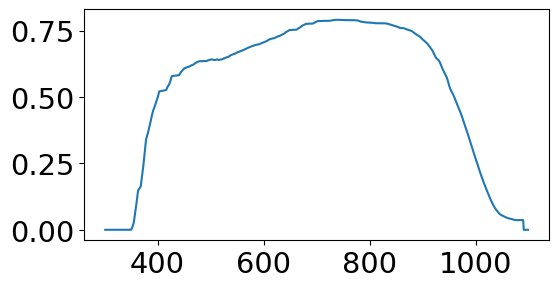

In [20]:
%matplotlib inline
fig = plt.figure(figsize=(6,3))
ax = fig.add_subplot()
ax.plot(tel_lambdas,tel.transmission(tel_lambdas))

### Config disperser

In [21]:
disp = dispersers.Hologram("holo4_003")

## Load config filename for Auxtel

In [22]:
load_config(config_fullpath)

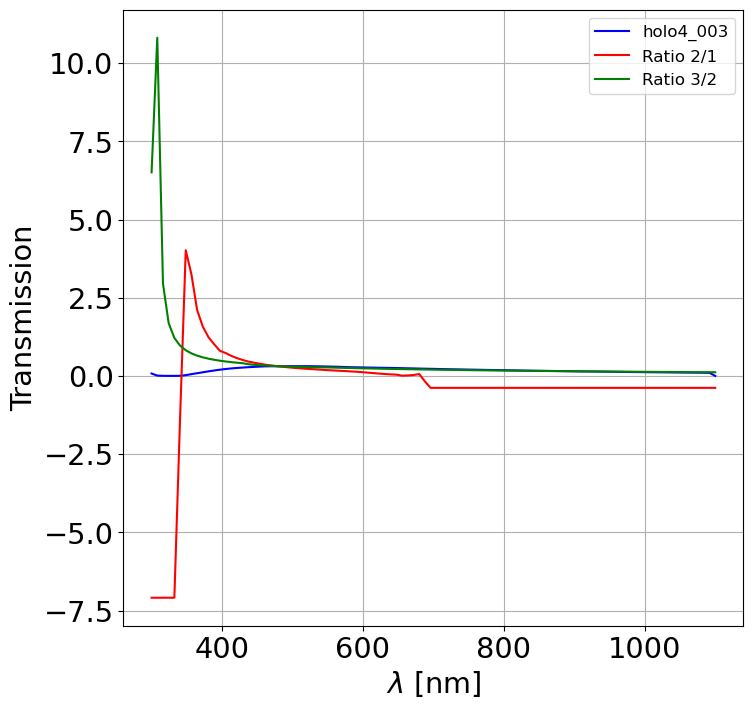

In [23]:
disp.plot_transmission()

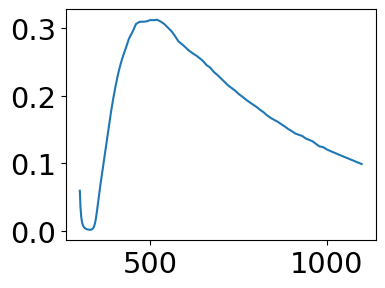

In [24]:
fig = plt.figure(figsize=(4,3))
ax = fig.add_subplot()
ax.plot(tel_lambdas,disp.transmission(tel_lambdas))

## Check the presence of the spectra

### select the date of observation in 2022 and 2023

In [25]:
ALL_DATEOBS = np.array([20230117, 20230118, 20230119, 20230131, 20230201, 20230202,
       20230214, 20230215, 20230216, 20230228, 20230301, 20230302,
       20230314, 20230315, 20230316, 20230509, 20230510, 20230511,
       20230523, 20230524, 20230525, 20230718, 20230720, 20230801,
       20230802, 20230815, 20230817, 20230829, 20230912, 20230913,
       20230914, 20230926, 20230927, 20230928, 20231010, 20231107,
       20231108, 20231113, 20231114, 20231115, 20231116, 20231120,
       20231127, 20231128, 20231129, 20231130, 20231204, 20231205,
       20231206, 20231207, 20231211, 20231212, 20231214, 20231215,
       20231219, 20231220])

file_out_allfittedparams = "out_allfittedparams.csv"

- Split in 4 parts because too many files open

In [26]:

#ALL_DATEOBS = np.array([20220913, 20220914, 20220927, 20220928, 20220929, 20221011,
#       20221012, 20221025, 20221026, 20221027, 20221109, 20221110,
#       20221123, 20221207, 20221208, 20221209, 20221210, 20221212])
#file_out_allfittedparams = "out_allfittedparams_2022_3_3.csv"


#ALL_DATEOBS = np.array([20230117, 20230118, 20230119, 20230131, 20230201, 20230202,
#       20230214, 20230215, 20230216, 20230228, 20230301, 20230302,
#       20230314, 20230315, 20230316]) 
#file_out_allfittedparams = "out_allfittedparams_2023_1_4.csv"
                        
#ALL_DATEOBS = np.array([20230509, 20230510, 20230511,
#       20230523, 20230524, 20230525, 20230718, 20230720, 20230801,
#       20230802, 20230815, 20230817, 20230829]) 
#file_out_allfittedparams = "out_allfittedparams_2023_2_4.csv"                        
                        
#ALL_DATEOBS = np.array([20230912, 20230913,
#       20230914, 20230926, 20230927, 20230928, 20231010, 20231107,
#       20231108, 20231113, 20231114, 20231115, 20231116]) 
#file_out_allfittedparams = "out_allfittedparams_2023_3_4.csv"


#ALL_DATEOBS = np.array([20231120,
#       20231127, 20231128, 20231129, 20231130, 20231204, 20231205,
#       20231206, 20231207, 20231211, 20231212, 20231214, 20231215,
#       20231219, 20231220])
#file_out_allfittedparams = "out_allfittedparams_2023_4_4.csv"

In [27]:
#DATEOBS = 20231207 # studied 2023/12/12
#DATEOBS = 20231206 # studied 2023/12/18
#DATEOBS = 20231205 # studied 2023/12/18
#DATEOBS = 20231204 # studied 2023/12/18
#DATEOBS = 20231130 # studied 2023/12/18
#DATEOBS = 20231129 # studied 2023/12/18
#DATEOBS = 20231128 # studied 2023/12/18
#DATEOBS = 20231127 # studied 2023/12/18

#DATEOBS = 20231120 # studied 2024/01/11 , not too bad
#DATEOBS = 20231116 # studied 2024/01/11 , not too bad
#DATEOBS = 20231115 # studied 2024/01/11 , not too bad, too short
#DATEOBS = 20231114 # studied 2024/01/11 , not too bad, too short
#DATEOBS = 20231113 # studied 2024/01/11 , not too bad, too short


# Middle of the year

ALL_DATEOBS = np.array([20230301, 20230302,
       20230314, 20230315, 20230316,20230509, 20230510, 20230511,
       20230523, 20230524, 
       #20230525, # produce a crash
       20230718, 20230720, 
       #20230801, # only one bad file
       20230802, 20230815, 20230817, 20230829, 20230912, 20230913,
       20230914])
file_out_allfittedparams = "out_allfittedparams_selected_1jan-14sept2023.csv"
#file_out_allfittedparams = "out_allfittedparams_selected_9may-14sept2023.csv"

# End of year##
#ALL_DATEOBS = np.array([#20230926, 
#                        20230927, 20230928, 
#                        20231010, 
#                        20231107,20231108,
#                        20231113,20231114,20231115,20231116,20231120,20231127,20231128,20231129,
#                        20231130,20231204,20231205,20231206,20231207]) 

#file_out_allfittedparams = "out_allfittedparams_selected_27sept-07dec2023.csv"

In [28]:
len(ALL_DATEOBS)

19

## Access to spectra using the butler

In [29]:
all_records = []
count = 0
for DATEOBS in ALL_DATEOBS:
    where = f"instrument='LATISS' and visit.day_obs={DATEOBS}" 
    records = list(butler.registry.queryDimensionRecords('visit', datasets='spectractorSpectrum', where=where,  collections=my_collection))
    all_records.append(records)
    count += len(records)
    print(f">>> {DATEOBS} :  Number of records : ",len(records)," / ", count)
    

>>> 20230301 :  Number of records :  73  /  73
>>> 20230302 :  Number of records :  42  /  115
>>> 20230314 :  Number of records :  55  /  170
>>> 20230315 :  Number of records :  69  /  239
>>> 20230316 :  Number of records :  52  /  291
>>> 20230509 :  Number of records :  63  /  354
>>> 20230510 :  Number of records :  75  /  429
>>> 20230511 :  Number of records :  24  /  453
>>> 20230523 :  Number of records :  112  /  565
>>> 20230524 :  Number of records :  105  /  670
>>> 20230718 :  Number of records :  2  /  672
>>> 20230720 :  Number of records :  21  /  693
>>> 20230802 :  Number of records :  43  /  736
>>> 20230815 :  Number of records :  4  /  740
>>> 20230817 :  Number of records :  66  /  806
>>> 20230829 :  Number of records :  43  /  849
>>> 20230912 :  Number of records :  23  /  872
>>> 20230913 :  Number of records :  20  /  892
>>> 20230914 :  Number of records :  24  /  916


In [30]:
len(all_records)

19

## Get params, times, headers and Spectra

In [31]:
all_params_spectrum = []
all_params_spectrogram = []
all_times = []
all_headers = []
all_spectra = []

for idx,DATEOBS in enumerate(ALL_DATEOBS):

    records = all_records[idx]
    print(idx,DATEOBS,len(records))
    params_spectrum = []
    params_spectrogram = []
    times = []
    headers = []
    spectra = []

    for i, r in enumerate(records):
        try:
            times.append(r.day_obs)
            spec =  butler.get('spectractorSpectrum', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
            headers.append(spec.header)
            spectra.append(spec)
            p = butler.get('spectrumLibradtranFitParameters', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
            params_spectrum.append(p)
            p = butler.get('spectrogramLibradtranFitParameters', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
            params_spectrogram.append(p)
    #except ValueError:
        except Exception as inst:
            except_type = type(inst)
            except_args = inst.args
            print("catch exception ", inst, "type =",except_type, "args = ",except_args) 
            print("\t >>>>> Skip record ", r.id)
            continue

    all_params_spectrum.append(params_spectrum)
    all_params_spectrogram.append(params_spectrogram)
    all_times.append(times)
    all_headers.append(headers)
    all_spectra.append(spectra)

0 20230301 73
************ getObsAtmo imported ************* 
/home/d/dagoret/.local/lib/python3.11/site-packages/getObsAtmo
>>>> _getPackageDir /home/d/dagoret/.local/lib/python3.11/site-packages/getObsAtmo
>>>> getObsSiteDataFrame      altitude   pressure
LSST    2.663  731.50433
CTIO    2.207   774.6052
OHP      0.65  937.22595
PDM    2.8905  710.90637
OMK     4.205  600.17224
OSL       0.0     1013.0


2024-01-26 15:50:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


1 20230302 42


2024-01-26 15:51:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2 20230314 55


2024-01-26 15:51:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


3 20230315 69


2024-01-26 15:51:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:51:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


4 20230316 52


2024-01-26 15:52:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:52:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


5 20230509 63
6 20230510 75
7 20230511 24
8 20230523 112
9 20230524 105
10 20230718 2
11 20230720 21
12 20230802 43
13 20230815 4
14 20230817 66
15 20230829 43
16 20230912 23
17 20230913 20
18 20230914 24


## Filtering data

In [32]:
all_filtered_spectra = []

count = 0
for idx,DATEOBS in enumerate(ALL_DATEOBS):
    records = all_records[idx]
    spectra_filtered = filter_data(butler,my_collection,DATEOBS,records)
    count += len(spectra_filtered)
    all_filtered_spectra.append(spectra_filtered)
    print(idx,DATEOBS,len(records),len(spectra_filtered),count)
    

2024-01-26 15:55:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


0 20230301 73 31 31


2024-01-26 15:55:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:55:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


1 20230302 42 17 48


2024-01-26 15:56:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2 20230314 55 26 74


2024-01-26 15:56:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


3 20230315 69 38 112


2024-01-26 15:56:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-26 15:56:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


4 20230316 52 26 138
5 20230509 63 29 167
6 20230510 75 23 190
7 20230511 24 7 197
8 20230523 112 47 244
9 20230524 105 48 292
10 20230718 2 2 294
11 20230720 21 6 300
12 20230802 43 26 326
13 20230815 4 3 329
14 20230817 66 25 354
15 20230829 43 24 378
16 20230912 23 9 387
17 20230913 20 11 398
18 20230914 24 10 408


## Information from atmospheric fits

In [33]:
headers = all_headers[0]

In [34]:
columns_spectrum = ["id"]

for h in headers[0]:
    if "COMMENT" in h or "EXTNAME" in h: continue
    if "LBDAS_T" in h or "PSF_P_T" in h or "AMPLIS_T" in h: continue
    if "UNIT" in h: continue
    if "SIMPLE" in h: continue
    columns_spectrum.append(h)
 
columns_spectrogram_bestfit = []
for key in params_spectrogram[0].labels:
    columns_spectrogram_bestfit.append(key)
    columns_spectrogram_bestfit.append(key+"_err")

columns_spectrum_bestfit = []
for key in params_spectrum[0].labels:
    columns_spectrum_bestfit.append(key)
    columns_spectrum_bestfit.append(key+"_err")

In [35]:
print(columns_spectrum)

['id', 'BITPIX', 'NAXIS', 'NAXIS1', 'NAXIS2', 'EXTEND', 'TARGET', 'REDSHIFT', 'GRATING', 'ROTANGLE', 'D2CCD', 'LSHIFT', 'PARANGLE', 'TARGETX', 'TARGETY', 'LBDA_REF', 'PSF_REG', 'TRACE_R', 'MEANFWHM', 'PIXSHIFT', 'CHI2_FIT', 'A2_FIT', 'AM_FIT', 'VERSION', 'REBIN', 'CONFIG', 'DATE-OBS', 'EXPTIME', 'AIRMASS', 'DEC', 'HA', 'OUTTEMP', 'OUTPRESS', 'OUTHUM', 'FILTER', 'CAM_ROT', 'S_X0', 'S_Y0', 'S_XMIN', 'S_XMAX', 'S_YMIN', 'S_YMAX', 'S_NX', 'S_NY', 'S_DEG', 'S_SAT', 'S_ORDER']


In [36]:
print(columns_spectrogram_bestfit)

['A1', 'A1_err', 'A2', 'A2_err', 'A3', 'A3_err', 'VAOD', 'VAOD_err', 'angstrom_exp', 'angstrom_exp_err', 'ozone [db]', 'ozone [db]_err', 'PWV [mm]', 'PWV [mm]_err', 'D_CCD [mm]', 'D_CCD [mm]_err', 'shift_x [pix]', 'shift_x [pix]_err', 'shift_y [pix]', 'shift_y [pix]_err', 'angle [deg]', 'angle [deg]_err', 'B', 'B_err', 'x_c_0_1', 'x_c_0_1_err', 'x_c_1_1', 'x_c_1_1_err', 'x_c_2_1', 'x_c_2_1_err', 'y_c_0_1', 'y_c_0_1_err', 'y_c_1_1', 'y_c_1_1_err', 'y_c_2_1', 'y_c_2_1_err', 'gamma_0_1', 'gamma_0_1_err', 'gamma_1_1', 'gamma_1_1_err', 'gamma_2_1', 'gamma_2_1_err', 'alpha_0_1', 'alpha_0_1_err', 'alpha_1_1', 'alpha_1_1_err', 'alpha_2_1', 'alpha_2_1_err', 'saturation_0_1', 'saturation_0_1_err', 'x_c_0_2', 'x_c_0_2_err', 'x_c_1_2', 'x_c_1_2_err', 'x_c_2_2', 'x_c_2_2_err', 'y_c_0_2', 'y_c_0_2_err', 'y_c_1_2', 'y_c_1_2_err', 'y_c_2_2', 'y_c_2_2_err', 'gamma_0_2', 'gamma_0_2_err', 'gamma_1_2', 'gamma_1_2_err', 'gamma_2_2', 'gamma_2_2_err', 'alpha_0_2', 'alpha_0_2_err', 'alpha_1_2', 'alpha_1_2_err

In [37]:
print(columns_spectrum_bestfit)

['A1', 'A1_err', 'A2', 'A2_err', 'VAOD', 'VAOD_err', 'angstrom_exp', 'angstrom_exp_err', 'ozone [db]', 'ozone [db]_err', 'PWV [mm]', 'PWV [mm]_err', 'reso [pix]', 'reso [pix]_err', 'D_CCD [mm]', 'D_CCD [mm]_err', 'alpha_pix [pix]', 'alpha_pix [pix]_err', 'B', 'B_err']


## Merge dataframes of general paramters and fitted params

In [38]:
all_df = []

for idx,DATEOBS in enumerate(ALL_DATEOBS):
  
    records = all_records[idx]
    headers = all_headers[idx]
    params_spectrogram = all_params_spectrogram[idx]
    params_spectrum = all_params_spectrum[idx]
   
    min_index = 0
    max_index = np.inf

    # General parameters
    df1 = pd.DataFrame(columns=columns_spectrum)
    for k, header in enumerate(headers):
        # if k > 40: break
        n = records[k].id
        if n < min_index or n > max_index: continue
        row = {"id": n}
        for h in header:
            if h in columns_spectrum:
                row[h] = header[h]
        df1.loc[len(df1)] = row


    # fitted parameters in Spectrogram
    df2 = pd.DataFrame(columns=columns_spectrogram_bestfit)
    for k, p in enumerate(params_spectrogram):
        n = records[k].id
        if n < min_index or n > max_index: continue
        row = {"id": n}
        for i, key in enumerate(p.labels):
            row[key] = p.values[i]
            row[key+"_err"] = p.err[i]
        df2.loc[len(df2)] = row

    # fitted parameters in Spectrum
    df3 = pd.DataFrame(columns=columns_spectrum_bestfit)
    for k, p in enumerate(params_spectrum):
        n = records[k].id
        if n < min_index or n > max_index: continue
        row = {"id": n}
        for i, key in enumerate(p.labels):
            row[key] = p.values[i]
            row[key+"_err"] = p.err[i]
        df3.loc[len(df3)] = row

    df = pd.merge(df1, df2, left_index=True, right_index=True)
    df = pd.merge(df, df3, left_index=True, right_index=True)
    df.set_index('DATE-OBS', inplace=True)
    #df.index = pd.to_datetime(df.index, format="ISO8601") #['DATE-OBS'])
    df.index = pd.to_datetime(df.index) #['DATE-OBS'])
    df.sort_index(inplace=True)

    all_df.append(df)
            

In [39]:
all_df[0].head()

,id,BITPIX,NAXIS,NAXIS1,NAXIS2,EXTEND,TARGET,REDSHIFT,GRATING,ROTANGLE,...,PWV [mm]_y,PWV [mm]_err_y,reso [pix],reso [pix]_err,D_CCD [mm]_y,D_CCD [mm]_err_y,alpha_pix [pix],alpha_pix [pix]_err,B_y,B_err_y
DATE-OBS,,,,,,,,,,,,,,,,,,,,,
2023-03-02 00:22:59.764997027+00:00,2023030100186,-64,2,1067,3,True,HD185975,-0.000065,holo4_003,0.144286,...,3.245668,0.030477,2.107527,0.032591,186.905996,0.006421,1.057257,0.0,0.0,0.0
2023-03-02 00:23:42.674503263+00:00,2023030100187,-64,2,1066,3,True,HD185975,-0.000065,holo4_003,0.146260,...,4.841349,0.095417,1.037454,0.029138,187.059338,0.005172,1.070992,0.0,0.0,0.0
2023-03-02 00:28:16.180504525+00:00,2023030100195,-64,2,1067,3,True,HD42525,0.000059,holo4_003,0.195037,...,4.971336,0.217571,1.001817,0.025453,187.070769,0.006010,0.975896,0.0,0.0,0.0
2023-03-02 00:32:12.762491457+00:00,2023030100202,-64,2,1066,3,True,HD185975,-0.000065,holo4_003,0.135586,...,2.281342,0.029069,2.111174,0.042348,186.904207,0.007795,0.956389,0.0,0.0,0.0
2023-03-02 00:32:55.673997692+00:00,2023030100203,-64,2,1066,3,True,HD185975,-0.000065,holo4_003,0.140233,...,2.662089,0.028016,2.141743,0.031566,186.778546,0.005386,1.156211,0.0,0.0,0.0


In [40]:
all_df[1].head()

,id,BITPIX,NAXIS,NAXIS1,NAXIS2,EXTEND,TARGET,REDSHIFT,GRATING,ROTANGLE,...,PWV [mm]_y,PWV [mm]_err_y,reso [pix],reso [pix]_err,D_CCD [mm]_y,D_CCD [mm]_err_y,alpha_pix [pix],alpha_pix [pix]_err,B_y,B_err_y
DATE-OBS,,,,,,,,,,,,,,,,,,,,,
2023-03-03 00:37:43.813992546+00:00,2023030200035,-64,2,1066,3,True,HD185975,-0.000065,holo4_003,0.133290,...,7.803043,0.054575,1.849317,0.024881,186.905460,0.004052,1.136498,0.0,0.0,0.0
2023-03-03 00:38:26.836491366+00:00,2023030200036,-64,2,1067,3,True,HD185975,-0.000065,holo4_003,0.134453,...,5.193328,0.056789,1.047624,0.026328,187.065329,0.004030,1.038923,0.0,0.0,0.0
2023-03-03 00:50:31.013998468+00:00,2023030200051,-64,2,1067,3,True,HD38666,0.000364,holo4_003,0.206902,...,6.058454,0.070576,1.338808,0.045805,187.235082,0.005386,0.501239,0.0,0.0,0.0
2023-03-03 01:01:55.578490853+00:00,2023030200067,-64,2,1066,3,True,HD38666,0.000364,holo4_003,0.198105,...,4.995541,0.108497,1.023802,0.065061,187.509578,0.010195,1.112730,0.0,0.0,0.0
2023-03-03 01:08:35.487508784+00:00,2023030200074,-64,2,1066,3,True,HD031128,0.000373,holo4_003,0.171200,...,7.973389,0.083382,5.509692,0.084288,186.866870,0.012144,1.054314,0.0,0.0,0.0


In [41]:
df =  pd.concat(all_df)

## Write csv file

In [42]:
# convert pandas to numpy rec array
rec = df.to_records()

In [43]:
filtered = (rec["CHI2_FIT"] < 100) & (rec["PSF_REG"] > 1e-2) & (rec["D2CCD"] > 186)  & (rec["D2CCD"] < 188)  # & (np.abs(rec["PIXSHIFT"]) < 0.5) 
print(np.sum(filtered))
filtered = filtered & (rec["PWV [mm]_err_x"] > 0) & (rec["PWV [mm]_err_x"] < 5) & (rec["A1_err_y"] > 0) & (rec["A1_err_y"] < 5) & (rec["PWV [mm]_err_y"] > 0) & (rec["PWV [mm]_err_y"] < 5)
print(np.sum(filtered))
filtered = filtered & (rec["reso [pix]"] < 3)
print(np.sum(filtered))
filtered = filtered & (rec["ozone [db]_err_y"] > 0) & (rec["ozone [db]_err_y"] < 100)
print(np.sum(filtered))
filtered = filtered & (rec["A1_x"] > 0.1) & (rec["A1_x"] < 1.5)
print(np.sum(filtered))
filtered = filtered & (np.abs(rec["gamma_0_2"]) < 30) & (np.abs(rec["alpha_0_2"]) < 10)
print(np.sum(filtered))

722
657
630
580
542
388


## Save filtering

In [44]:
df["filtered"] =filtered

## Save atmospheric parameters and filters

In [45]:
df.to_csv(file_out_allfittedparams) 

## Plot fitted parameters

In [46]:
stars = np.unique(rec["TARGET"])
stars

array(['Feige110', 'HD009051', 'HD031128', 'HD111980', 'HD115169',
       'HD142331', 'HD146233', 'HD14943', 'HD160617', 'HD167060',
       'HD185975', 'HD200654', 'HD205905', 'HD2811', 'HD38666', 'HD38949',
       'HD42525', 'HD60753'], dtype=object)

In [47]:
filters = np.unique(rec["FILTER"])
filters

array(['empty'], dtype=object)

In [48]:
ATMMINMAX = {}
ATMMINMAX["A1_y"] = [0.1,1.9]
ATMMINMAX["chi2_y"] = [0.,500.]
ATMMINMAX["ozone [db]_y"] = [0.,600.]
ATMMINMAX["PWV [mm]_y"] = [0.,12.]
ATMMINMAX["VAOD_y"] = [0.,0.5]
ATMMINMAX["A2_y"] = [0.7,1.3]

ATMMINMAX["A1_x"] = [0.1,1.9]
ATMMINMAX["chi2_x"] = [0.,500.]
ATMMINMAX["ozone [db]_x"] = [0.,600.]
ATMMINMAX["PWV [mm]_x"] = [0.,12.]
ATMMINMAX["VAOD_x"] = [0.,0.5]
ATMMINMAX["A2_x"] = [0.7,1.3]

## Plot fitted parameters

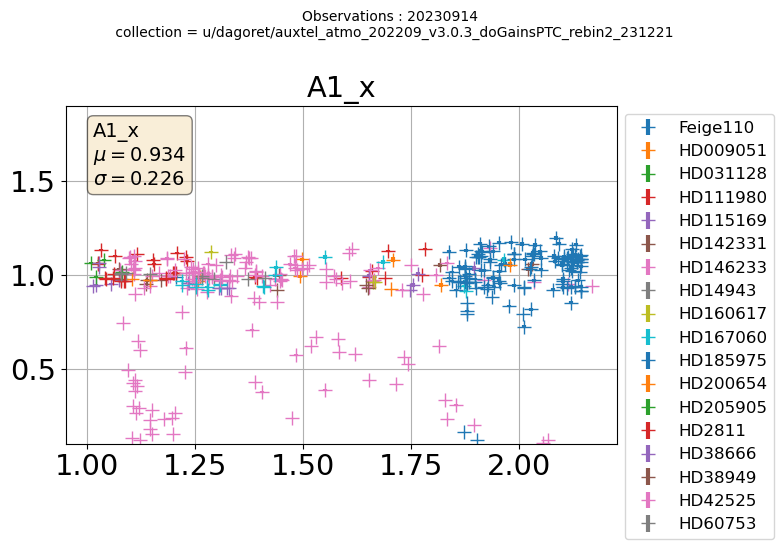

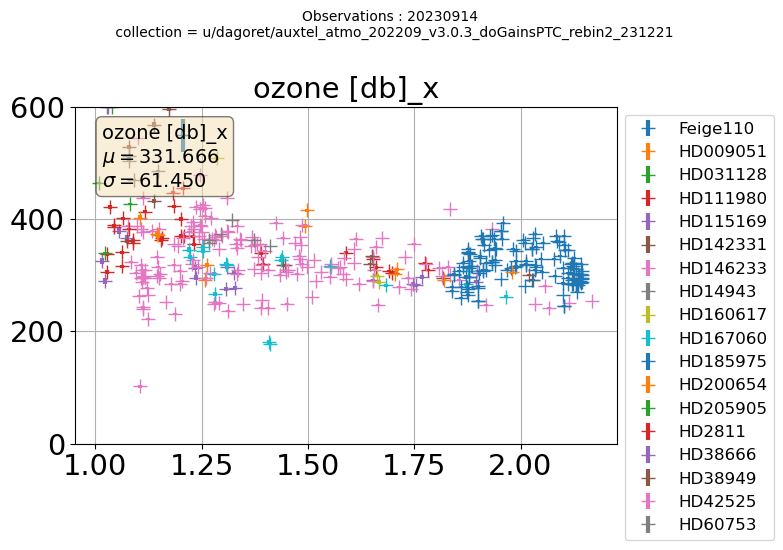

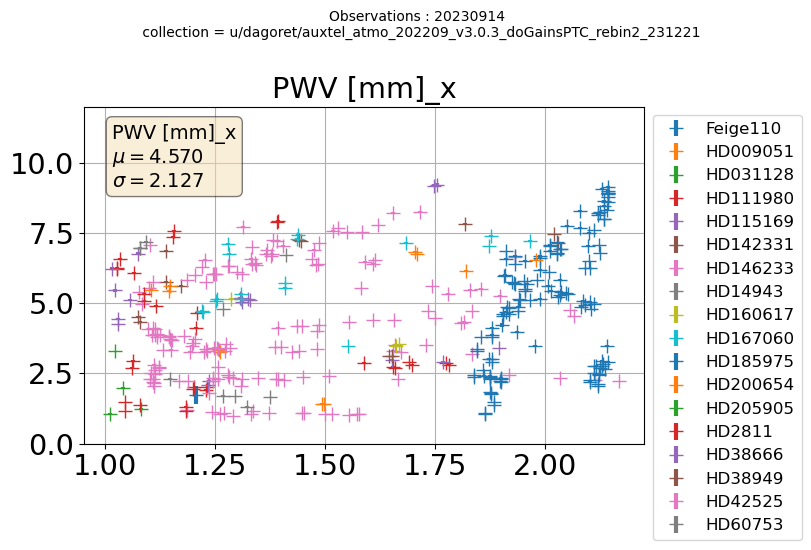

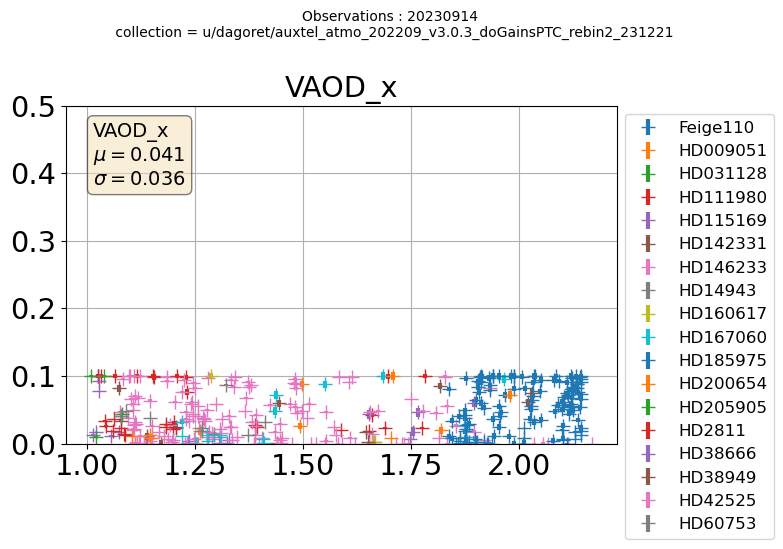

In [49]:
#for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x", "D_CCD [mm]_x", "gamma_0_1", "gamma_0_2", "alpha_0_1", "alpha_0_2", "y_c_0_1", "y_c_0_2" ]:
for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x"]:
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))

    index = filtered  & (rec["FILTER"]=="empty")
    all_values = rec[col][index]
    
    mu = all_values.mean()
    sig =all_values.std()
    textstr = '\n'.join((col,
    r'$\mu=%.3f$' % (mu, ),
    r'$\sigma=%.3f$' % (sig, )))



    for star in stars:
        index = filtered & (rec["TARGET"] == star) & (rec["FILTER"]=="empty")
        if col_err in df.columns:
            plt.errorbar(rec["AIRMASS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=10,lw=3 ,label=star)
        else:
            plt.plot(rec["AIRMASS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3 )
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax = plt.gca()
    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=props)
    
    plt.grid()
    plt.title(col)
    plt.legend(bbox_to_anchor=(1,1), loc="upper left")
    #plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.tight_layout()
    plt.show()


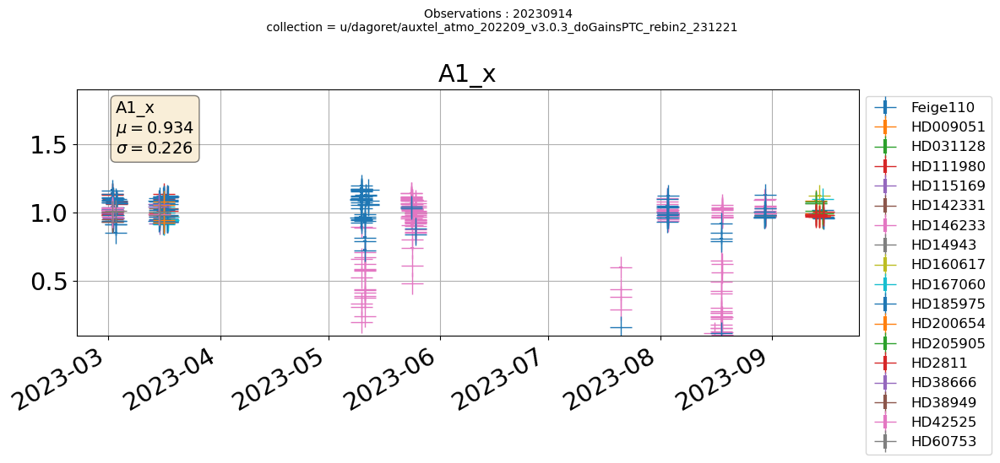

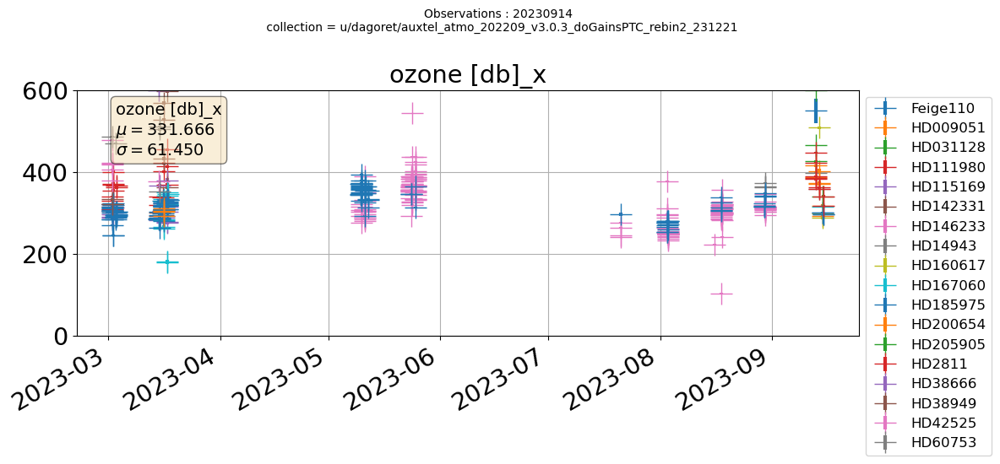

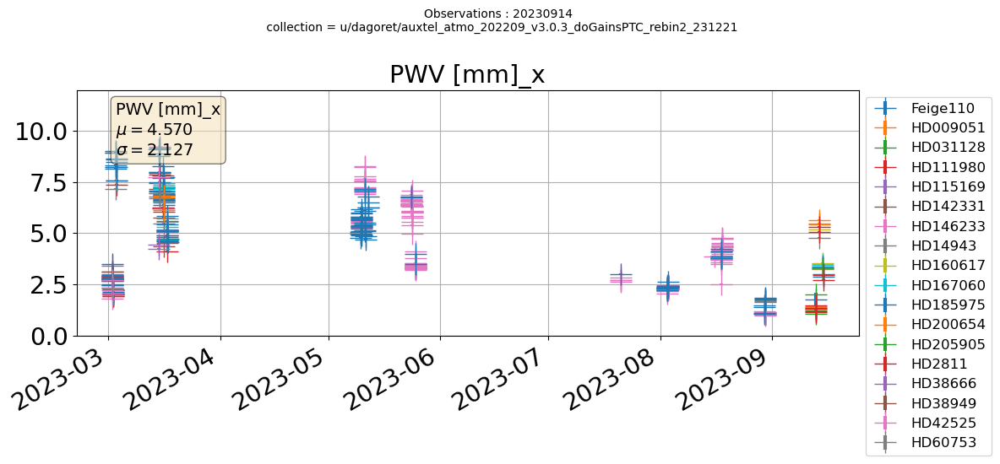

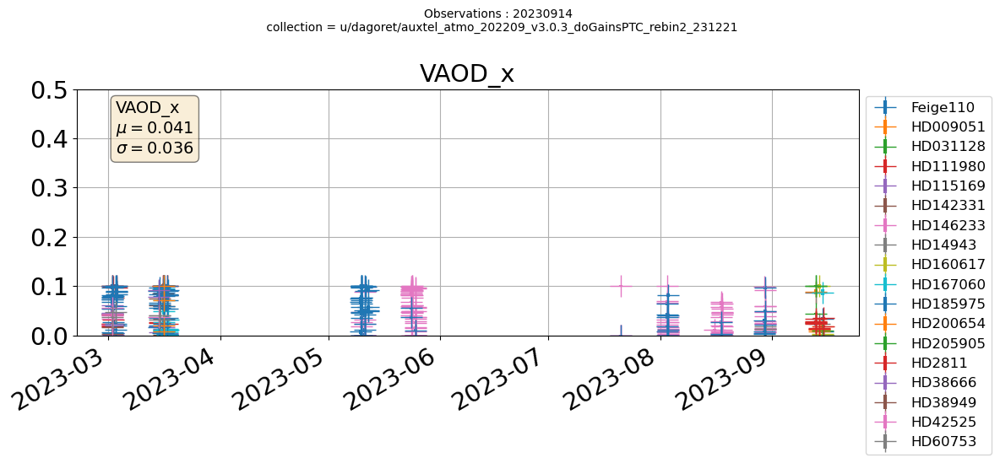

In [50]:
for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x"]:
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"

    index = filtered  & (rec["FILTER"]=="empty")
    all_values = rec[col][index]
    mu = all_values.mean()
    sig =all_values.std()
    textstr = '\n'.join((col,
    r'$\mu=%.3f$' % (mu, ),
    r'$\sigma=%.3f$' % (sig, )))

    fig = plt.figure(figsize=(12,5))
    for star in stars:
        index = filtered & (rec["TARGET"] == star)
        if col_err in df.columns:
            plt.errorbar(rec["DATE-OBS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=19,lw=3 ,label=star)
        else:
            plt.plot(rec["DATE-OBS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3)
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax = plt.gca()
    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=props)


    plt.grid()
    plt.title(col)
    plt.legend(bbox_to_anchor=(1,1), loc="upper left")
    plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.tight_layout()
    plt.show()

In [51]:
len(filtered)

916

In [52]:
print(filtered)

[ True  True False  True False False False  True False  True  True  True
 False  True  True False False  True False False  True  True  True  True
 False False False False False  True False False  True False False  True
 False  True  True False  True  True  True  True  True False  True  True
 False False  True False False  True False  True  True  True False False
 False  True  True  True  True  True  True  True  True False False  True
  True  True  True False False False False False False False False  True
 False False False  True  True False  True False False  True  True False
 False False False False False  True  True False False  True False False
 False False False  True  True False  True  True  True False  True False
 False False False False False False False False False False  True  True
 False False  True  True False False False False False False False False
 False  True  True  True  True False  True  True  True  True False  True
 False False False False False  True False False  T

In [53]:
df.head()

,id,BITPIX,NAXIS,NAXIS1,NAXIS2,EXTEND,TARGET,REDSHIFT,GRATING,ROTANGLE,...,PWV [mm]_err_y,reso [pix],reso [pix]_err,D_CCD [mm]_y,D_CCD [mm]_err_y,alpha_pix [pix],alpha_pix [pix]_err,B_y,B_err_y,filtered
DATE-OBS,,,,,,,,,,,,,,,,,,,,,
2023-03-02 00:22:59.764997027+00:00,2023030100186,-64,2,1067,3,True,HD185975,-0.000065,holo4_003,0.144286,...,0.030477,2.107527,0.032591,186.905996,0.006421,1.057257,0.0,0.0,0.0,True
2023-03-02 00:23:42.674503263+00:00,2023030100187,-64,2,1066,3,True,HD185975,-0.000065,holo4_003,0.146260,...,0.095417,1.037454,0.029138,187.059338,0.005172,1.070992,0.0,0.0,0.0,True
2023-03-02 00:28:16.180504525+00:00,2023030100195,-64,2,1067,3,True,HD42525,0.000059,holo4_003,0.195037,...,0.217571,1.001817,0.025453,187.070769,0.006010,0.975896,0.0,0.0,0.0,False
2023-03-02 00:32:12.762491457+00:00,2023030100202,-64,2,1066,3,True,HD185975,-0.000065,holo4_003,0.135586,...,0.029069,2.111174,0.042348,186.904207,0.007795,0.956389,0.0,0.0,0.0,True
2023-03-02 00:32:55.673997692+00:00,2023030100203,-64,2,1066,3,True,HD185975,-0.000065,holo4_003,0.140233,...,0.028016,2.141743,0.031566,186.778546,0.005386,1.156211,0.0,0.0,0.0,False


0 20230301 31 31
>>> List of targets  ['HD111980' 'HD115169' 'HD185975' 'HD38949' 'HD42525' 'HD60753']
>>> ID.     :  20230301 [2023030100202, 2023030100203, 2023030100226, 2023030100234, 2023030100245, 2023030100334, 2023030100372, 2023030100387, 2023030100395, 2023030100396, 2023030100411, 2023030100419, 2023030100420, 2023030100428, 2023030100436, 2023030100459, 2023030100480, 2023030100481, 2023030100510, 2023030100511, 2023030100518, 2023030100519, 2023030100526, 2023030100527, 2023030100534, 2023030100535, 2023030100542, 2023030100543, 2023030100558, 2023030100590, 2023030100591]
>>> AIRMASS :  20230301 [2.11606233070534, 2.11634868218645, 1.23756367766552, 2.12304135551742, 2.12598769849146, 2.14056338640106, 2.14398106650482, 1.89511058706701, 1.78175002163602, 1.77469915464334, 1.69716482526135, 1.6598482147741, 1.65396389386553, 1.65235742647028, 1.58317026749421, 1.14706213174787, 1.64542046882683, 1.65118043303605, 2.12947709215028, 2.1292459537962, 1.27868362831032, 1.2759

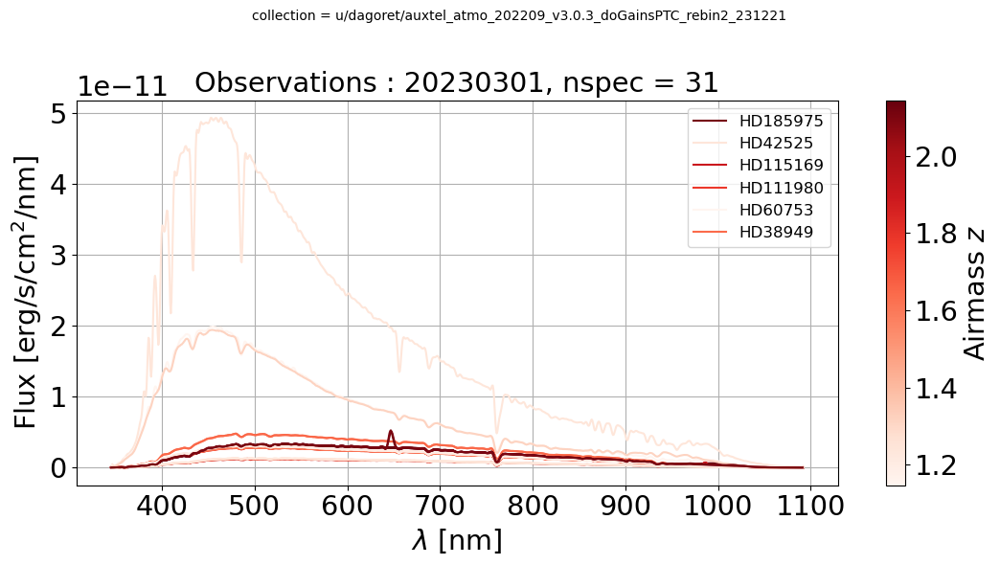

1 20230302 17 48
>>> List of targets  ['HD031128' 'HD111980' 'HD115169' 'HD185975' 'HD38949']
>>> ID.     :  20230302 [2023030200035, 2023030200036, 2023030200074, 2023030200075, 2023030200112, 2023030200113, 2023030200155, 2023030200156, 2023030200194, 2023030200195, 2023030200232, 2023030200268, 2023030200304, 2023030200305, 2023030200329, 2023030200336, 2023030200337]
>>> AIRMASS :  20230302 [2.12001744298021, 2.12028670433759, 1.14864480902725, 1.15040646659113, 1.10351905789798, 1.10490937908041, 2.14363602554733, 2.14367859479511, 2.14386085621785, 2.1438293913104, 2.14212145750023, 2.13478914922226, 2.12580612251266, 2.12555022519417, 1.18156996496099, 1.15580623940899, 1.15406702740023]


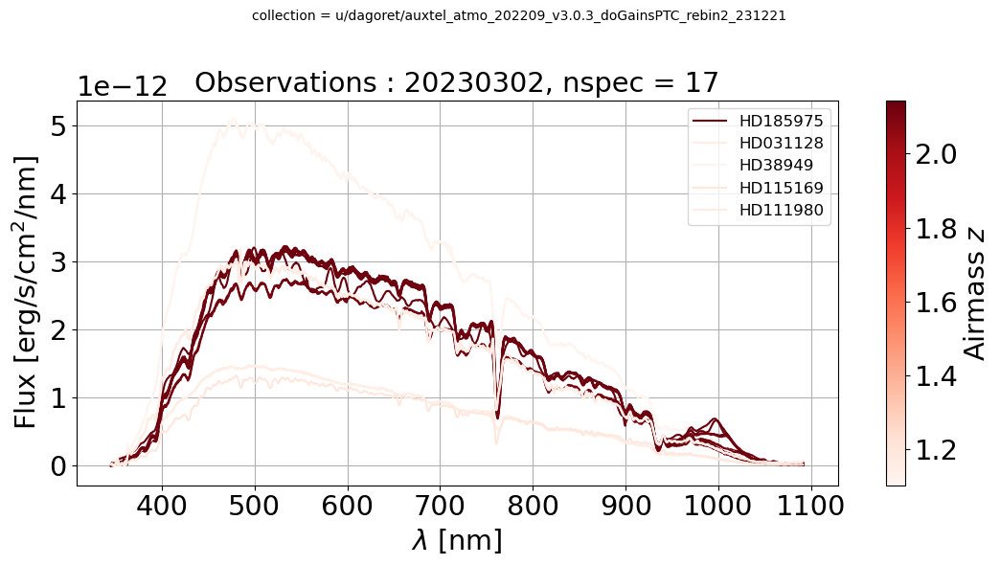

2 20230314 26 74
>>> List of targets  ['HD031128' 'HD111980' 'HD115169' 'HD142331' 'HD185975' 'HD38666'
 'HD42525' 'HD60753']
>>> ID.     :  20230314 [2023031400420, 2023031400434, 2023031400435, 2023031400442, 2023031400443, 2023031400484, 2023031400495, 2023031400502, 2023031400503, 2023031400518, 2023031400519, 2023031400543, 2023031400550, 2023031400558, 2023031400559, 2023031400567, 2023031400585, 2023031400586, 2023031400625, 2023031400626, 2023031400702, 2023031400721, 2023031400745, 2023031400756, 2023031400757, 2023031400773]
>>> AIRMASS :  20230314 [2.12994374205826, 1.06081704454551, 1.06181540286087, 1.06674059958947, 1.06779366917243, 1.12759324843365, 2.14254589971645, 1.31196111915822, 1.31293494616134, 1.07889135680549, 1.07928674691495, 2.14444996602254, 1.36318909397648, 1.27365632298425, 1.2762883395051, 1.62143487338154, 2.14257278084106, 2.14248204084494, 1.39305163441858, 1.38942249260787, 2.11271330771437, 1.41172657524325, 2.09920808341142, 1.07395502859235, 1.0

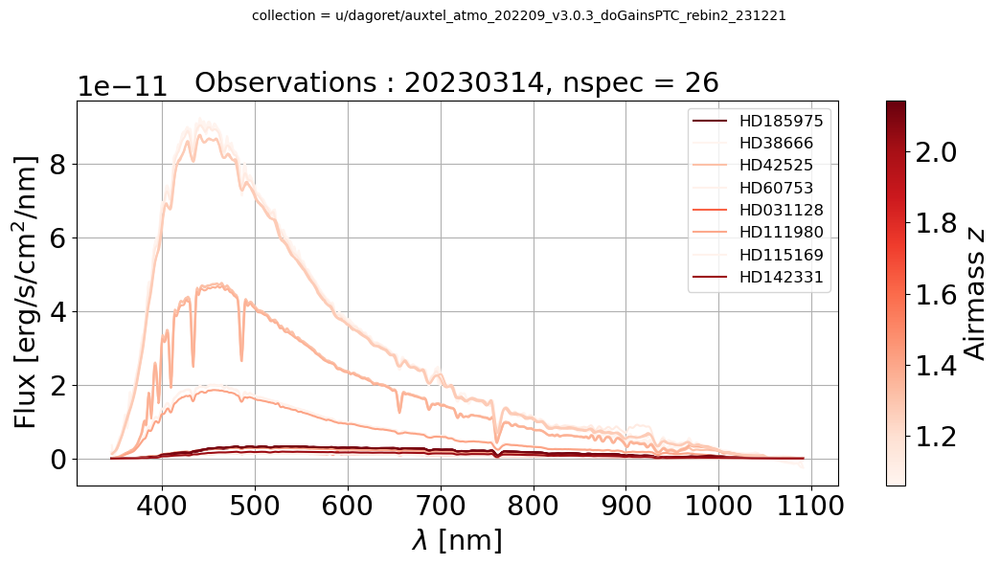

3 20230315 38 112
>>> List of targets  ['HD111980' 'HD115169' 'HD142331' 'HD146233' 'HD167060' 'HD185975'
 'HD200654']
>>> ID.     :  20230315 [2023031500617, 2023031500618, 2023031500625, 2023031500648, 2023031500649, 2023031500671, 2023031500679, 2023031500686, 2023031500687, 2023031500710, 2023031500711, 2023031500734, 2023031500750, 2023031500757, 2023031500773, 2023031500780, 2023031500788, 2023031500789, 2023031500804, 2023031500805, 2023031500816, 2023031500826, 2023031500827, 2023031500851, 2023031500852, 2023031500868, 2023031500869, 2023031500876, 2023031500877, 2023031500909, 2023031500916, 2023031500917, 2023031500936, 2023031500944, 2023031500945, 2023031500952, 2023031500960, 2023031500961]
>>> AIRMASS :  20230315 [2.08009019139918, 2.07966874677314, 1.81745365148966, 1.02682669371887, 1.02650555788769, 2.05129160288991, 1.96523775078416, 1.44488807722145, 1.44104094121499, 2.03552070431424, 2.03504070921181, 1.0334490972539, 1.68458172279762, 2.01192466599686, 1.01480578

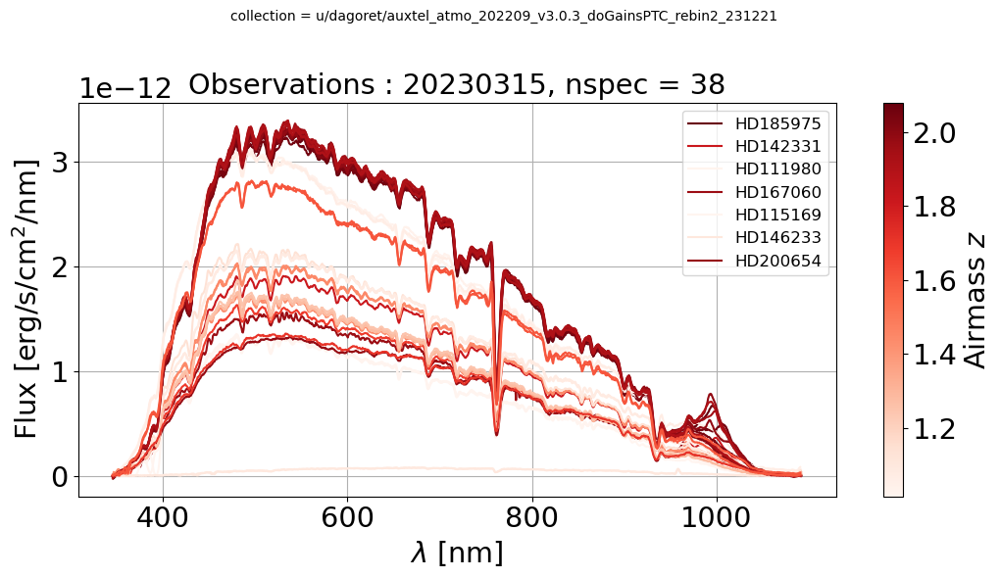

4 20230316 26 138
>>> List of targets  ['HD111980' 'HD115169' 'HD142331' 'HD167060' 'HD185975']
>>> ID.     :  20230316 [2023031600465, 2023031600466, 2023031600505, 2023031600528, 2023031600536, 2023031600537, 2023031600544, 2023031600577, 2023031600578, 2023031600597, 2023031600598, 2023031600609, 2023031600645, 2023031600646, 2023031600653, 2023031600654, 2023031600670, 2023031600697, 2023031600698, 2023031600705, 2023031600706, 2023031600713, 2023031600722, 2023031600723, 2023031600730, 2023031600731]
>>> AIRMASS :  20230316 [2.03400592655944, 2.03352279493008, 2.01302511013865, 1.0636647283467, 1.1736308517053, 1.17209952540389, 1.98942826697258, 1.05507541933052, 1.05603872496483, 1.4094662483749, 1.40752856329125, 1.09316481719458, 1.93932012218486, 1.93886521316258, 1.30886321980073, 1.30749286208415, 1.07486676590063, 1.30723598944496, 1.31016456934463, 1.32526147746481, 1.32832421967727, 1.56932590843368, 1.9049146038722, 1.90452262217935, 1.2213769529501, 1.22060381157914]


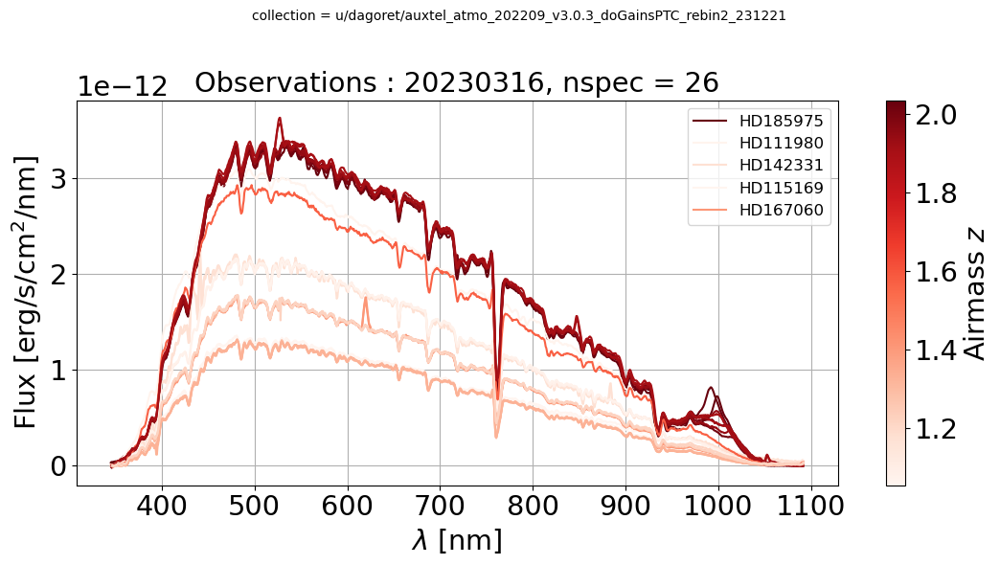

5 20230509 29 167
>>> List of targets  ['HD146233' 'HD185975']
>>> ID.     :  20230509 [2023050900219, 2023050900246, 2023050900261, 2023050900266, 2023050900273, 2023050900277, 2023050900282, 2023050900303, 2023050900307, 2023050900318, 2023050900322, 2023050900333, 2023050900348, 2023050900357, 2023050900370, 2023050900375, 2023050900396, 2023050900401, 2023050900404, 2023050900433, 2023050900455, 2023050900463, 2023050900487, 2023050900495, 2023050900533, 2023050900536, 2023050900563, 2023050900568, 2023050900571]
>>> AIRMASS :  20230509 [2.11343157433828, 2.10765475120457, 2.10424037978258, 2.1029866811808, 2.10200453061821, 2.10044075779482, 2.09916078948801, 2.09020929190358, 2.08716113746942, 2.0827746701475, 2.07959946261938, 2.07502804714499, 1.89690144916061, 1.82885188941274, 2.05507716148904, 2.05206106246471, 2.03642870266502, 2.03321102539422, 2.02995061947697, 2.00659211747942, 1.98882459151926, 1.98225593169243, 1.95921032049555, 1.95292369339313, 1.92876128667423, 1.92

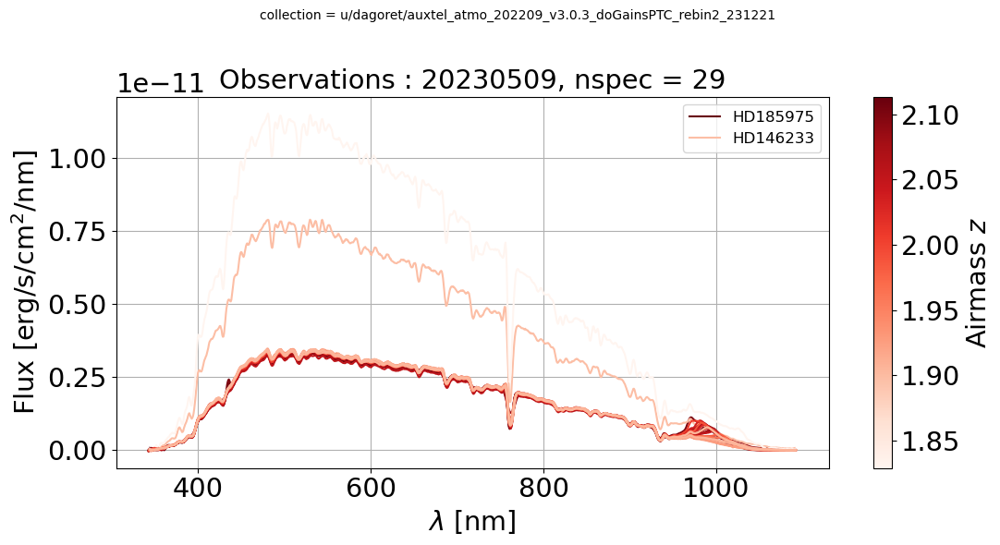

6 20230510 23 190
>>> List of targets  ['HD146233' 'HD185975' 'HD38666']
>>> ID.     :  20230510 [2023051000074, 2023051000092, 2023051000217, 2023051000246, 2023051000258, 2023051000273, 2023051000278, 2023051000283, 2023051000286, 2023051000298, 2023051000307, 2023051000310, 2023051000314, 2023051000319, 2023051000322, 2023051000340, 2023051000349, 2023051000352, 2023051000391, 2023051000448, 2023051000514, 2023051000539, 2023051000544]
>>> AIRMASS :  20230510 [1.5785475769034, 1.92247323875567, 1.92928081518651, 1.71473192381336, 1.65343998894951, 1.58439629555213, 1.55059677363194, 1.53023956585983, 1.51844628346825, 1.47423910015565, 2.0293637021588, 2.02738759783776, 1.40494085881122, 1.39000943638941, 1.38151199788185, 1.33321379055218, 2.00973410170732, 2.00776364371274, 1.98494206127801, 1.95738486570833, 1.07841342461423, 1.91400894095347, 1.91228294181441]


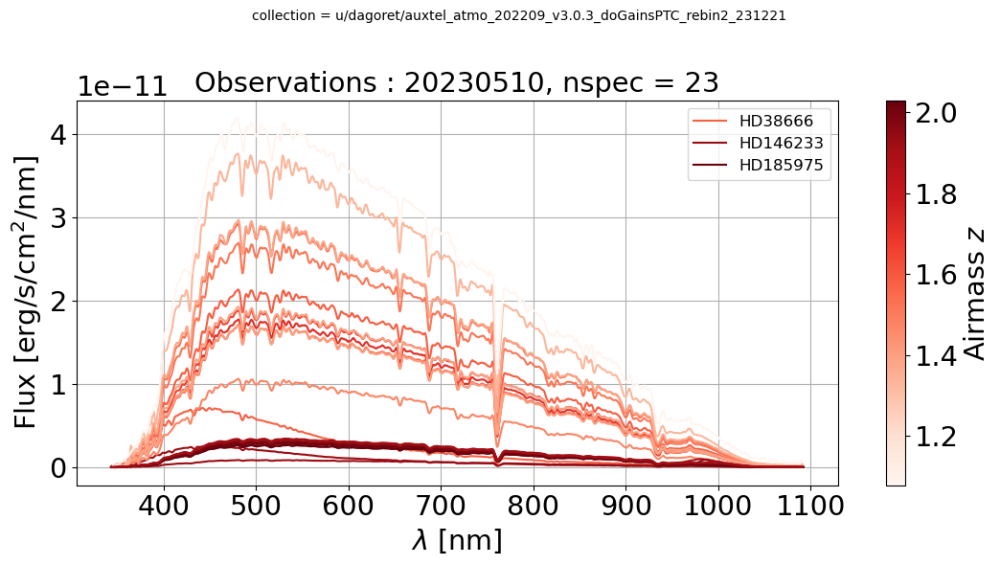

7 20230511 7 197
>>> List of targets  ['HD185975']
>>> ID.     :  20230511 [2023051100155, 2023051100203, 2023051100208, 2023051100233, 2023051100236, 2023051100252, 2023051100260]
>>> AIRMASS :  20230511 [2.12609636466074, 2.11347828604249, 2.11238762221875, 2.10333154555355, 2.10150949040569, 2.09519440372642, 2.09174818838066]


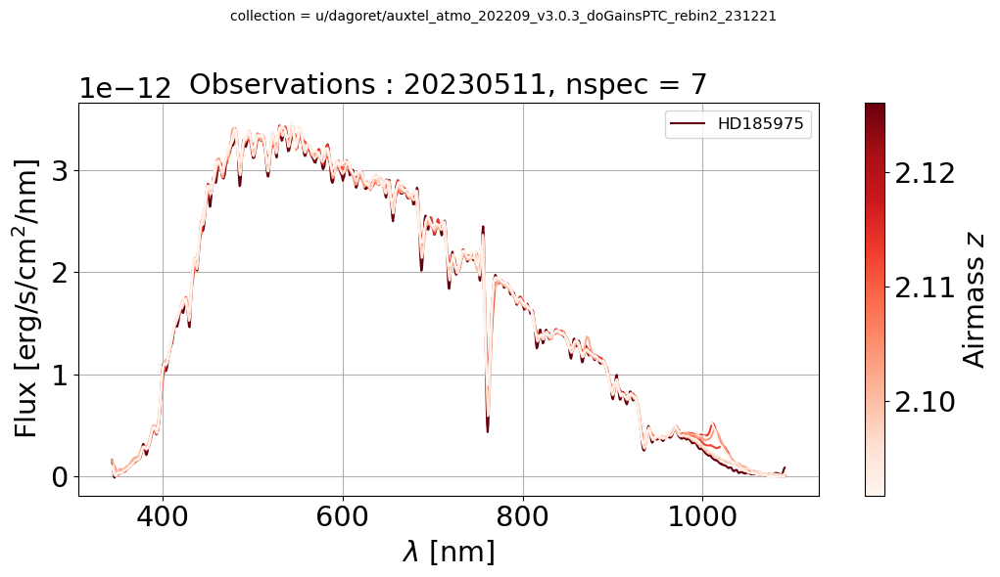

8 20230523 47 244
>>> List of targets  ['HD146233' 'HD185975' 'HD38666' 'HD60753']
>>> ID.     :  20230523 [2023052300136, 2023052300163, 2023052300173, 2023052300178, 2023052300187, 2023052300192, 2023052300201, 2023052300243, 2023052300244, 2023052300261, 2023052300271, 2023052300285, 2023052300286, 2023052300290, 2023052300308, 2023052300309, 2023052300312, 2023052300327, 2023052300336, 2023052300337, 2023052300340, 2023052300364, 2023052300365, 2023052300368, 2023052300369, 2023052300378, 2023052300379, 2023052300382, 2023052300397, 2023052300406, 2023052300407, 2023052300410, 2023052300421, 2023052300424, 2023052300425, 2023052300435, 2023052300449, 2023052300463, 2023052300476, 2023052300525, 2023052300526, 2023052300536, 2023052300539, 2023052300540, 2023052300568, 2023052300605, 2023052300606]
>>> AIRMASS :  20230523 [2.34209652295272, 1.42485004666331, 2.10253732456904, 2.10040995721411, 1.4986015533225, 1.51391805003652, 1.53993210880586, 2.07730423077466, 2.07687694367977, 1

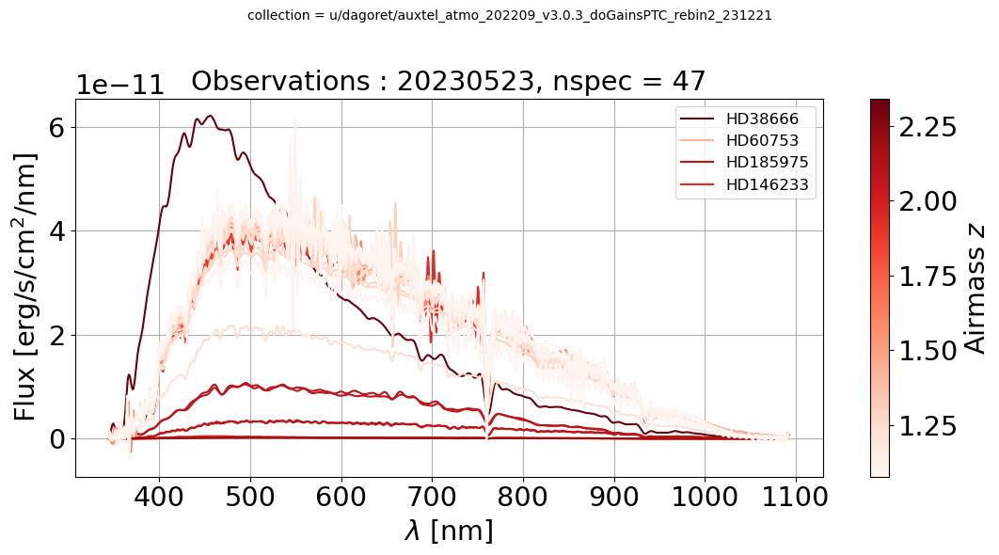

9 20230524 48 292
>>> List of targets  ['HD146233' 'HD185975' 'HD38666' 'HD60753']
>>> ID.     :  20230524 [2023052400108, 2023052400122, 2023052400126, 2023052400140, 2023052400164, 2023052400165, 2023052400183, 2023052400220, 2023052400262, 2023052400313, 2023052400323, 2023052400324, 2023052400327, 2023052400328, 2023052400356, 2023052400366, 2023052400379, 2023052400384, 2023052400393, 2023052400397, 2023052400398, 2023052400411, 2023052400422, 2023052400425, 2023052400435, 2023052400439, 2023052400440, 2023052400449, 2023052400450, 2023052400453, 2023052400454, 2023052400463, 2023052400464, 2023052400467, 2023052400482, 2023052400483, 2023052400516, 2023052400529, 2023052400539, 2023052400544, 2023052400553, 2023052400554, 2023052400558, 2023052400568, 2023052400592, 2023052400614, 2023052400615, 2023052400632]
>>> AIRMASS :  20230524 [2.12465212286755, 2.0618336637087, 2.09396226073964, 2.21095463938341, 2.11000128927129, 2.10966898658168, 1.43985789481421, 1.53862194787178, 2.07

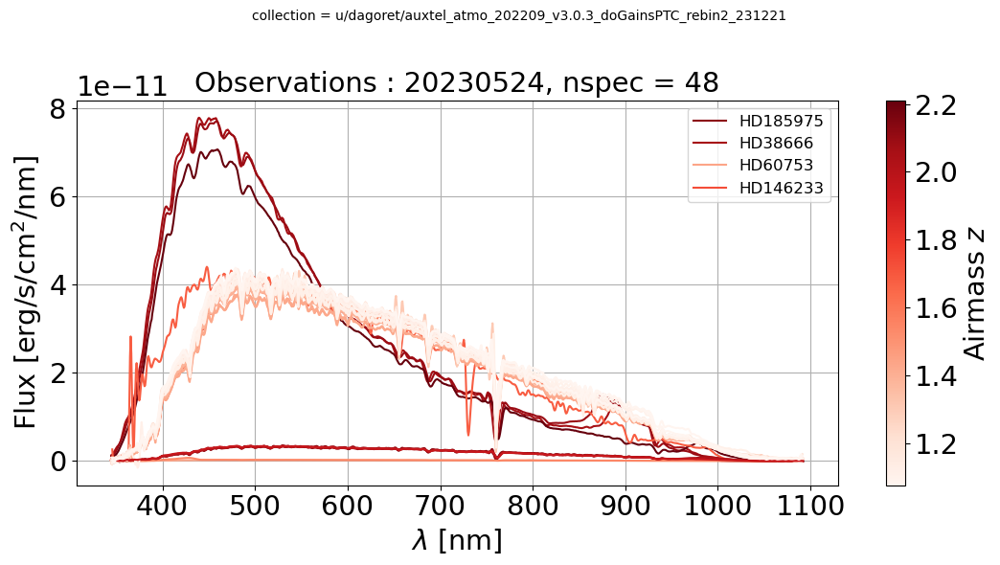

10 20230718 2 294
>>> List of targets  ['HD146233']
>>> ID.     :  20230718 [2023071800373, 2023071800374]
>>> AIRMASS :  20230718 [1.23317103363995, 1.23523476918121]


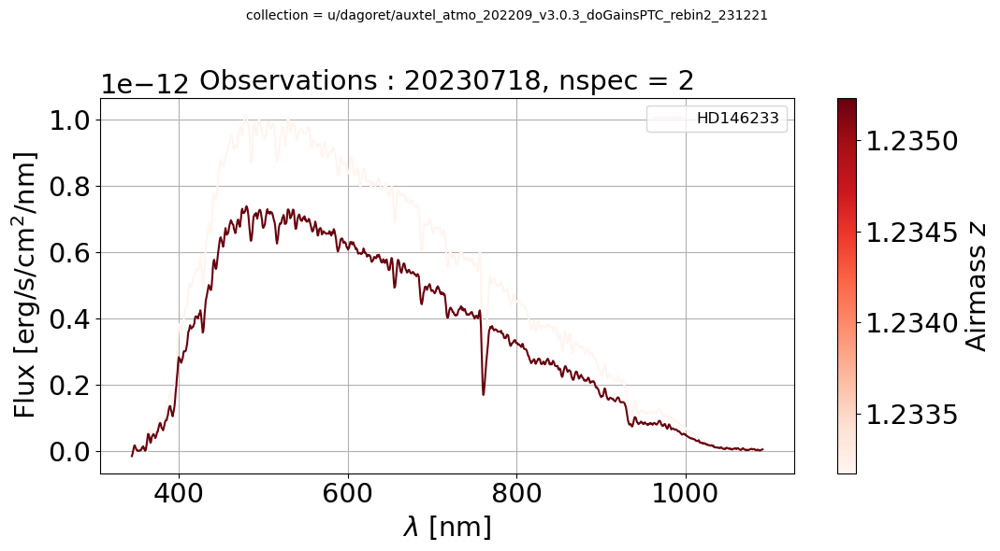

11 20230720 6 300
>>> List of targets  ['HD146233']
>>> ID.     :  20230720 [2023072000270, 2023072000271, 2023072000273, 2023072000284, 2023072000311, 2023072000312]
>>> AIRMASS :  20230720 [1.2895608249951, 1.29211629254986, 1.29701282292402, 1.32212190501342, 1.49794308598069, 1.50228082956296]


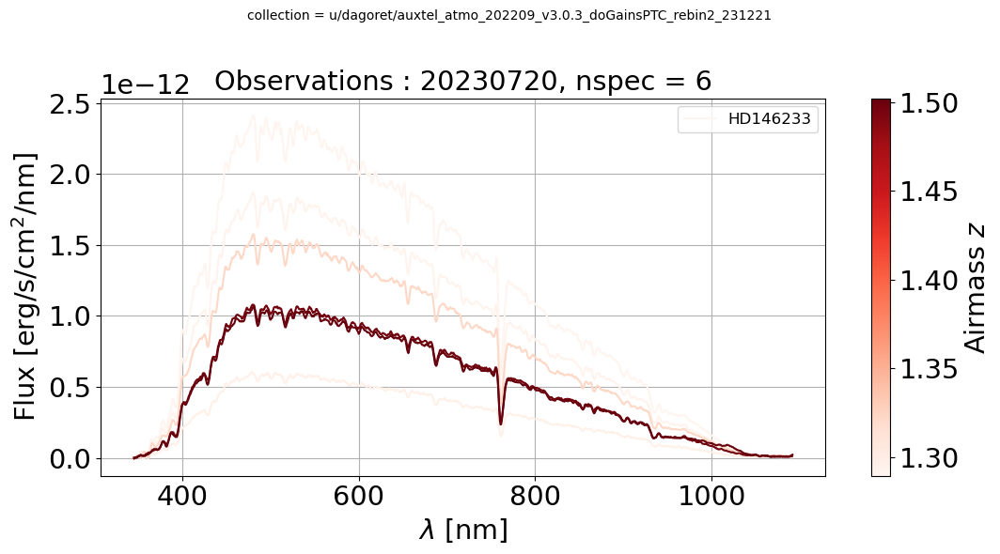

12 20230802 26 326
>>> List of targets  ['HD146233' 'HD185975']
>>> ID.     :  20230802 [2023080200279, 2023080200283, 2023080200322, 2023080200326, 2023080200327, 2023080200347, 2023080200357, 2023080200374, 2023080200383, 2023080200397, 2023080200427, 2023080200441, 2023080200445, 2023080200468, 2023080200482, 2023080200483, 2023080200487, 2023080200500, 2023080200511, 2023080200515, 2023080200533, 2023080200538, 2023080200548, 2023080200552, 2023080200590, 2023080200595]
>>> AIRMASS :  20230802 [1.11214942813158, 1.10918319071681, 1.90072922202072, 1.89915281810168, 1.89877380391195, 1.10211845656388, 1.10899530703049, 1.87438284186746, 1.16677803581331, 1.1870446645985, 1.86003414523185, 1.28044016605367, 1.29050495250995, 1.34822772955582, 1.38881459808005, 1.39221233659104, 1.40556413571959, 1.44978824272949, 1.49142862157904, 1.50867609502175, 1.6649307990592, 1.69444687071782, 1.83902950675908, 1.83853737276687, 2.11392506836435, 2.16788380568966]


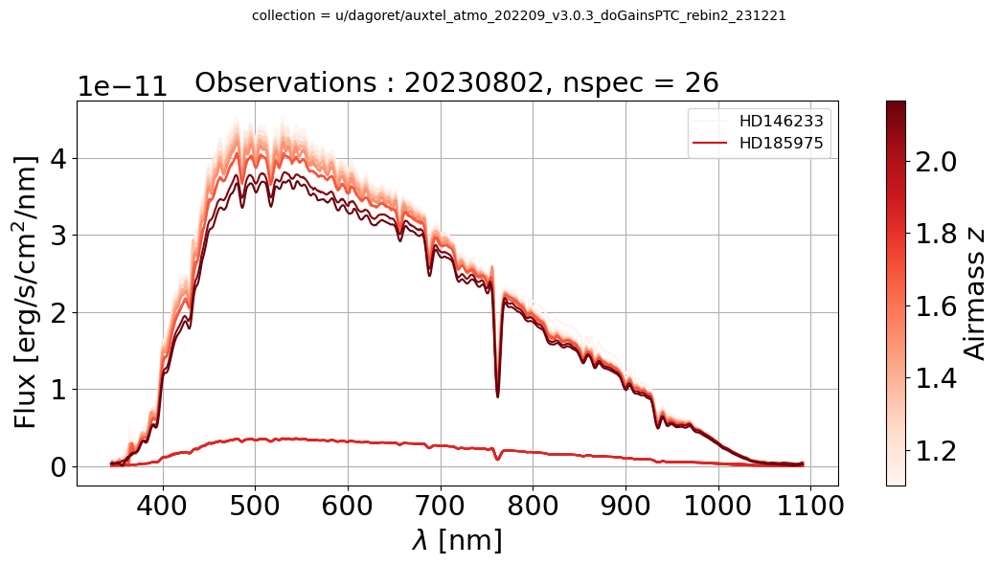

13 20230815 3 329
>>> List of targets  ['HD146233']
>>> ID.     :  20230815 [2023081500089, 2023081500092, 2023081500093]
>>> AIRMASS :  20230815 [1.12349113356613, 1.12636534097281, 1.12741358372055]


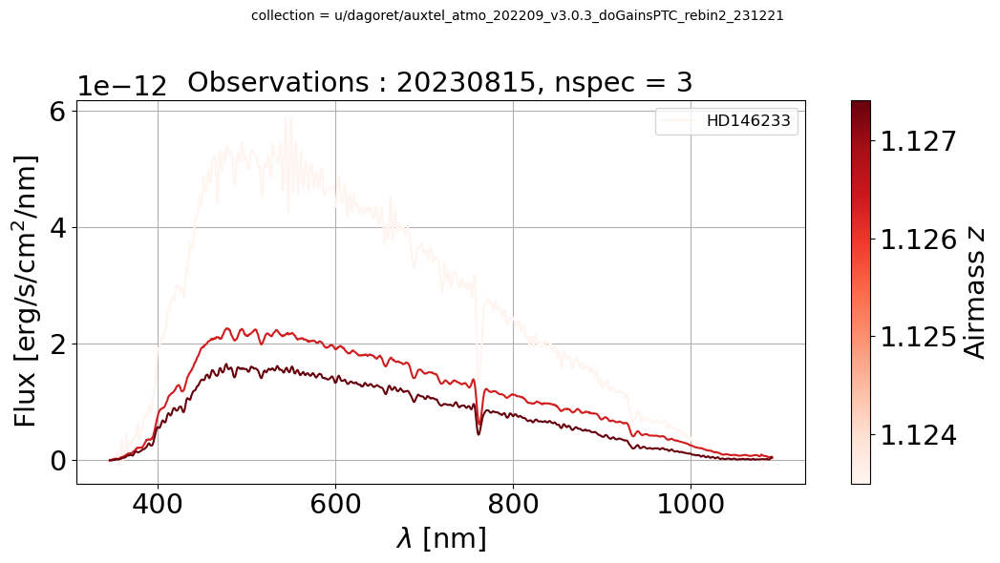

14 20230817 25 354
>>> List of targets  ['HD146233' 'HD185975']
>>> ID.     :  20230817 [2023081700147, 2023081700148, 2023081700171, 2023081700180, 2023081700194, 2023081700198, 2023081700199, 2023081700210, 2023081700214, 2023081700223, 2023081700224, 2023081700227, 2023081700228, 2023081700238, 2023081700241, 2023081700255, 2023081700265, 2023081700269, 2023081700283, 2023081700399, 2023081700402, 2023081700403, 2023081700427, 2023081700428, 2023081700431]
>>> AIRMASS :  20230817 [1.90213246518016, 1.90174688300204, 1.09892798820923, 1.10408986658847, 1.11365731525183, 1.11678963599777, 1.11772244687571, 1.88026234977412, 1.87890657432482, 1.14570652991062, 1.14696595934408, 1.15015276237363, 1.15145223820965, 1.16263166106059, 1.16616655507634, 1.18406135111356, 1.1978571027524, 1.2040191755487, 1.85498715253697, 1.81586688204159, 1.83414570682073, 1.84168055940217, 2.05657481190569, 2.06651799012285, 2.09169731224271]


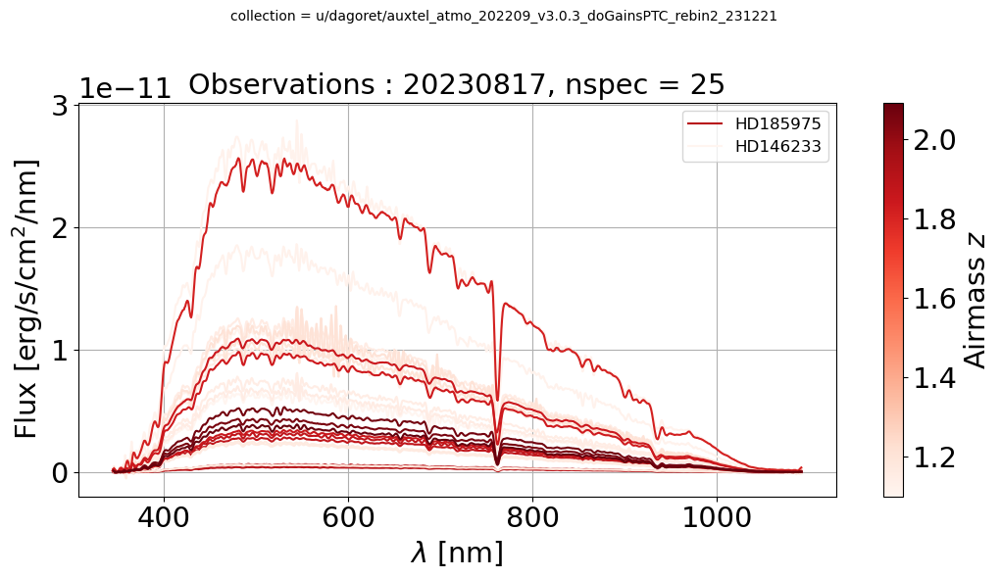

15 20230829 24 378
>>> List of targets  ['HD146233' 'HD14943' 'HD185975']
>>> ID.     :  20230829 [2023082900178, 2023082900179, 2023082900196, 2023082900207, 2023082900208, 2023082900211, 2023082900225, 2023082900235, 2023082900267, 2023082900268, 2023082900282, 2023082900300, 2023082900314, 2023082900328, 2023082900332, 2023082900513, 2023082900514, 2023082900527, 2023082900528, 2023082900547, 2023082900561, 2023082900564, 2023082900565, 2023082900575]
>>> AIRMASS :  20230829 [1.88470825467038, 1.88436876963307, 1.18479783112553, 1.86467850120137, 1.86441033085145, 1.86353151208722, 1.24183490488347, 1.26063888012561, 1.33218196119298, 1.33509755490152, 1.37270632653219, 1.44832742214086, 1.49873873853439, 1.55397957883045, 1.57143065954184, 1.37604368470279, 1.37350960588095, 1.34627024131621, 1.34391811324843, 1.29543788517038, 1.27146949756964, 1.2665278647307, 1.26467754802181, 1.87597089622311]


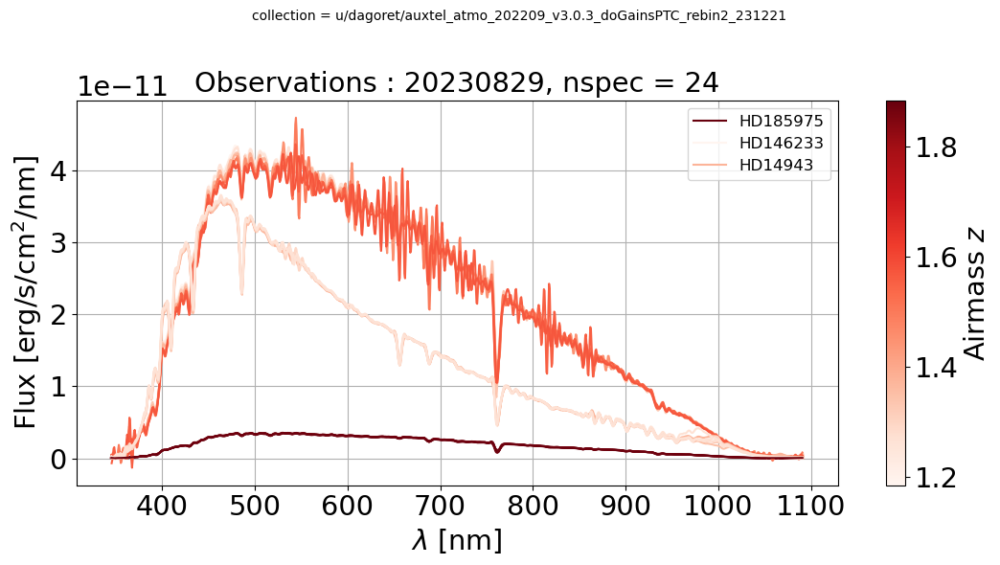

16 20230912 9 387
>>> List of targets  ['HD009051' 'HD14943' 'HD205905' 'HD2811']
>>> ID.     :  20230912 [2023091200279, 2023091200280, 2023091200310, 2023091200339, 2023091200355, 2023091200369, 2023091200385, 2023091200399, 2023091200400]
>>> AIRMASS :  20230912 [1.49749038873525, 1.49302430183466, 1.00944042010164, 1.2660818973897, 1.03948475708906, 1.08063564053323, 1.32193233161797, 1.08020809551917, 1.08140773154475]


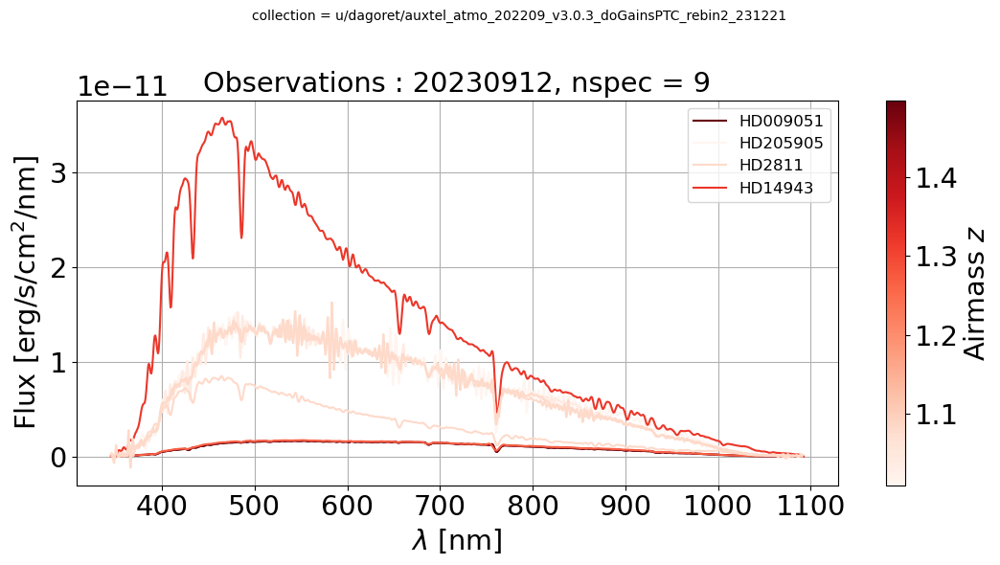

17 20230913 11 398
>>> List of targets  ['HD009051' 'HD14943' 'HD160617' 'HD200654' 'HD205905' 'HD2811']
>>> ID.     :  20230913 [2023091300241, 2023091300242, 2023091300294, 2023091300317, 2023091300329, 2023091300341, 2023091300342, 2023091300353, 2023091300365, 2023091300377, 2023091300378]
>>> AIRMASS :  20230913 [1.28440326281454, 1.28688145334467, 1.10452874278131, 1.40337786586141, 1.08825621201515, 1.14563701920897, 1.14673877217034, 1.06888295393804, 1.13845491980004, 1.26679959930738, 1.26493058152807]


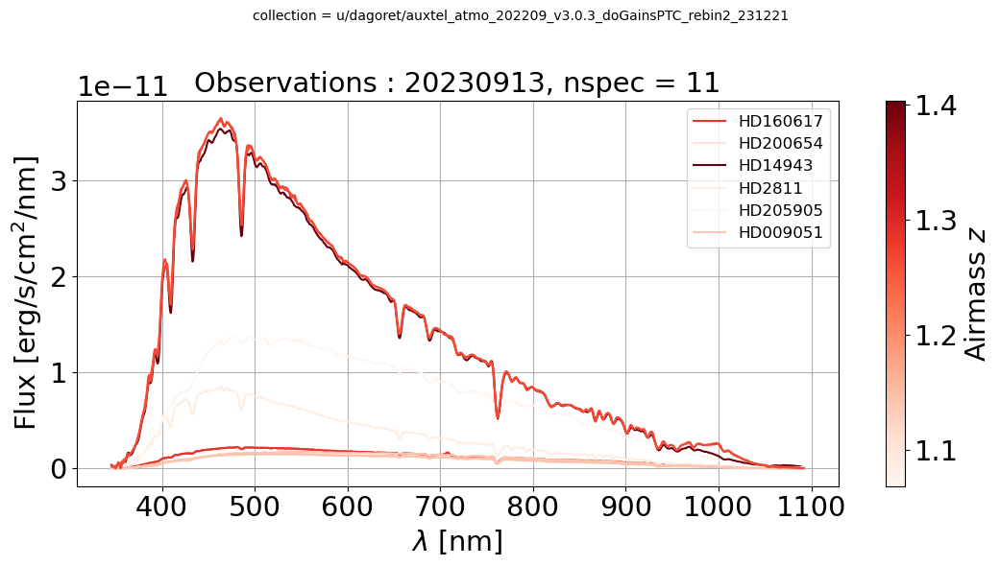

18 20230914 10 408
>>> List of targets  ['HD009051' 'HD160617' 'HD167060' 'HD185975' 'HD2811']
>>> ID.     :  20230914 [2023091400118, 2023091400119, 2023091400131, 2023091400144, 2023091400167, 2023091400168, 2023091400181, 2023091400214, 2023091400250, 2023091400251]
>>> AIRMASS :  20230914 [1.84439625044174, 1.84452779219763, 1.66708323227302, 1.55214571359915, 1.26123304107552, 1.25862026246905, 1.85840534410981, 1.06157334450309, 1.87916645710655, 1.87947396682595]


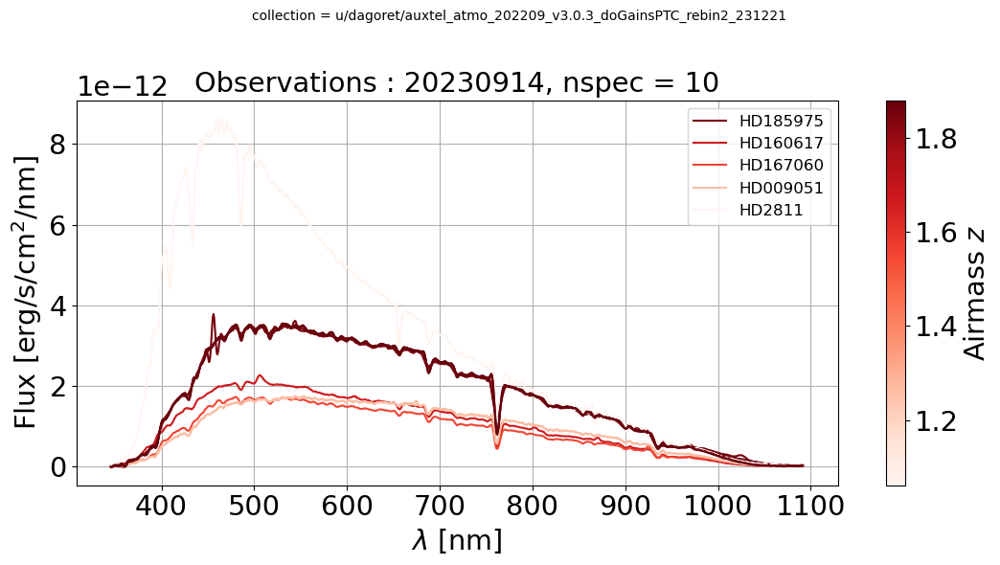

In [54]:
count = 0
all_lists_of_targets = []
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]
    N = len(filtered_spectra)
    count += N
    print(idx,DATEOBS,len(filtered_spectra),count) 
    list_of_targets = np.unique([spec.target.label for spec in filtered_spectra])
    print(">>> List of targets ",list_of_targets)
    all_lists_of_targets.append(list_of_targets)
   
    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    #print(df_sel)
    
    if N>1:
        fig = plot_spectra(filtered_spectra, [spec.airmass for spec in filtered_spectra],collection=my_collection,dateobs=DATEOBS)
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")

## Make SED dictionnary

In [55]:
list_of_all_targets = np.unique(np.concatenate(all_lists_of_targets))

In [56]:
import getCalspec.getCalspec as gcal
all_calspecs = {}
for target_name in list_of_all_targets:
    c =  gcal.Calspec(target_name) 
    all_calspecs[target_name] = c.get_spectrum_numpy() 

(0.0, 5e-11)

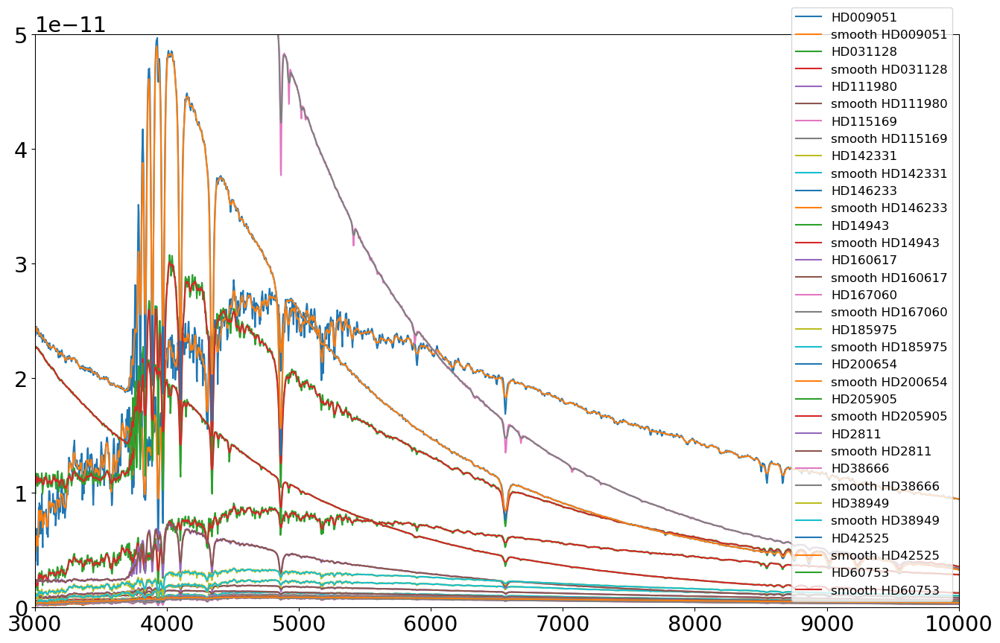

In [57]:
all_calspecs_sm = {}
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot()
span = 3
for target_name in list_of_all_targets:
    c_dict = all_calspecs[target_name]
    wls = c_dict["WAVELENGTH"].value
    sed = c_dict["FLUX"].value
    ax.plot(wls,sed,label=target_name)
    
    sedm = smooth_data_np_convolve(sed,span)
    c_dict_sm = {"WAVELENGTH":wls,"FLUX":sedm}
    all_calspecs_sm[target_name] = c_dict_sm
    ax.plot(wls,sedm,label="smooth " +target_name)
ax.legend()
ax.set_xlim(3000.,10000.)   
ax.set_ylim(0.,0.5e-10)

In [58]:
all_calspecs_sm

{'HD009051': {'WAVELENGTH': array([  1710.263306,   1711.634155,   1713.005005, ..., 318273.59375 ,
         318548.53125 , 318822.46875 ]),
  'FLUX': array([1.95106566e-15, 2.95379422e-15, 3.95090852e-15, ...,
         2.25098137e-18, 1.87257694e-18, 1.49546937e-18])},
 'HD031128': {'WAVELENGTH': array([  1710.57312 ,   1711.94397 ,   1713.314941, ..., 318194.75    ,
         318468.875   , 318743.96875 ]),
  'FLUX': array([4.73125293e-15, 7.36368152e-15, 1.03781101e-14, ...,
         8.52008867e-19, 7.08785631e-19, 5.66053031e-19])},
 'HD111980': {'WAVELENGTH': array([  1710.767212,   1712.138184,   1713.509277, ..., 318240.34375 ,
         318514.46875 , 318789.625   ]),
  'FLUX': array([1.25598571e-14, 1.59168570e-14, 1.82457141e-14, ...,
         1.96709062e-18, 1.63642248e-18, 1.30688723e-18])},
 'HD115169': {'WAVELENGTH': array([  1711.085815,   1712.456787,   1713.827759, ..., 318372.5     ,
         318647.53125 , 318921.53125 ]),
  'FLUX': array([-4.71867132e-16, -9.80795685e

## Plot atmospheric transmissions

>>> ID.     :  20230301 [2023030100202, 2023030100203, 2023030100226, 2023030100234, 2023030100245, 2023030100334, 2023030100372, 2023030100387, 2023030100395, 2023030100396, 2023030100411, 2023030100419, 2023030100420, 2023030100428, 2023030100436, 2023030100459, 2023030100480, 2023030100481, 2023030100510, 2023030100511, 2023030100518, 2023030100519, 2023030100526, 2023030100527, 2023030100534, 2023030100535, 2023030100542, 2023030100543, 2023030100558, 2023030100590, 2023030100591]
>>> AIRMASS :  20230301 [2.11606233070534, 2.11634868218645, 1.23756367766552, 2.12304135551742, 2.12598769849146, 2.14056338640106, 2.14398106650482, 1.89511058706701, 1.78175002163602, 1.77469915464334, 1.69716482526135, 1.6598482147741, 1.65396389386553, 1.65235742647028, 1.58317026749421, 1.14706213174787, 1.64542046882683, 1.65118043303605, 2.12947709215028, 2.1292459537962, 1.27868362831032, 1.27598570720332, 1.23115574017684, 1.22881081074598, 1.23596580004635, 1.23357878783009, 1.20220602613382, 1

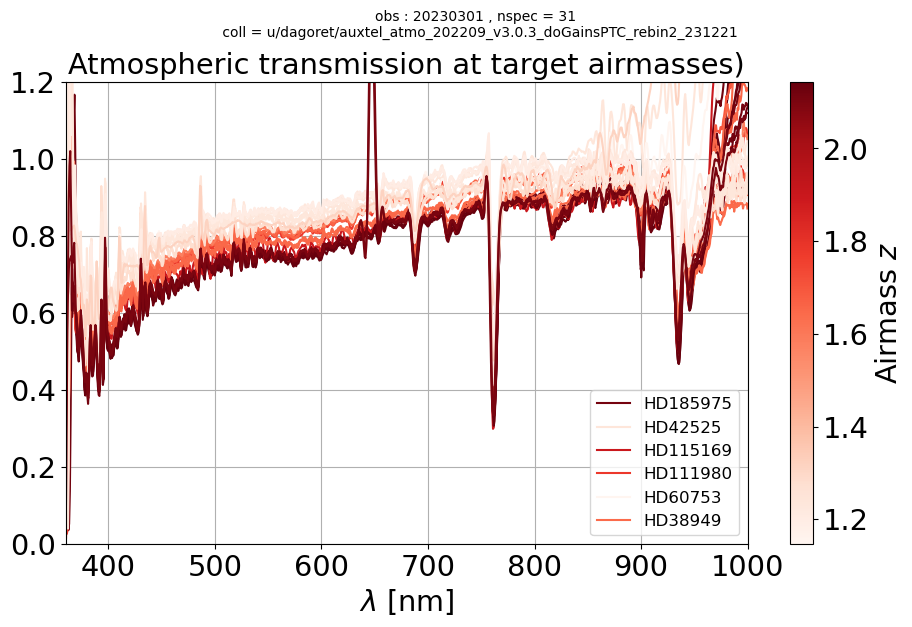

>>> ID.     :  20230302 [2023030200035, 2023030200036, 2023030200074, 2023030200075, 2023030200112, 2023030200113, 2023030200155, 2023030200156, 2023030200194, 2023030200195, 2023030200232, 2023030200268, 2023030200304, 2023030200305, 2023030200329, 2023030200336, 2023030200337]
>>> AIRMASS :  20230302 [2.12001744298021, 2.12028670433759, 1.14864480902725, 1.15040646659113, 1.10351905789798, 1.10490937908041, 2.14363602554733, 2.14367859479511, 2.14386085621785, 2.1438293913104, 2.14212145750023, 2.13478914922226, 2.12580612251266, 2.12555022519417, 1.18156996496099, 1.15580623940899, 1.15406702740023]


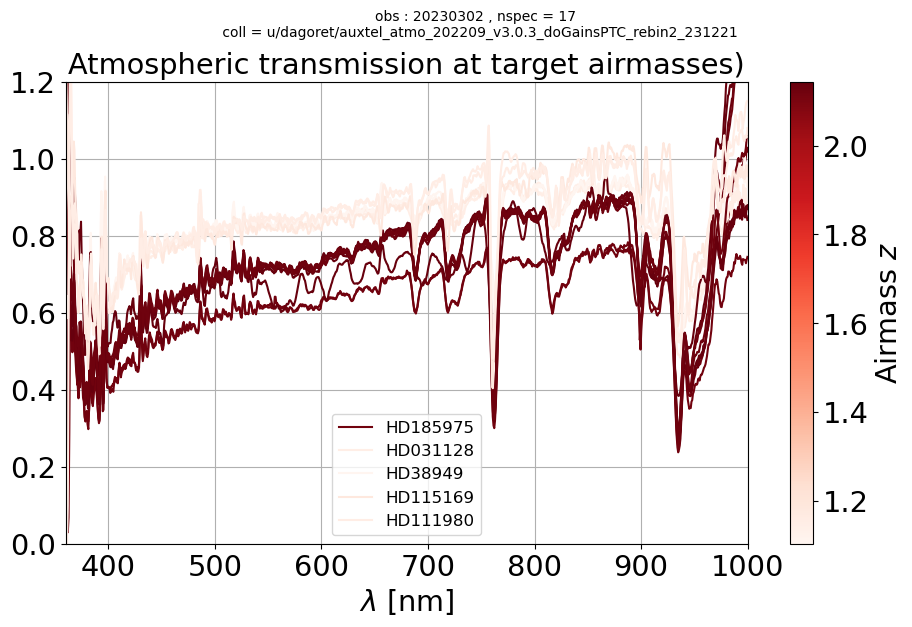

>>> ID.     :  20230314 [2023031400420, 2023031400434, 2023031400435, 2023031400442, 2023031400443, 2023031400484, 2023031400495, 2023031400502, 2023031400503, 2023031400518, 2023031400519, 2023031400543, 2023031400550, 2023031400558, 2023031400559, 2023031400567, 2023031400585, 2023031400586, 2023031400625, 2023031400626, 2023031400702, 2023031400721, 2023031400745, 2023031400756, 2023031400757, 2023031400773]
>>> AIRMASS :  20230314 [2.12994374205826, 1.06081704454551, 1.06181540286087, 1.06674059958947, 1.06779366917243, 1.12759324843365, 2.14254589971645, 1.31196111915822, 1.31293494616134, 1.07889135680549, 1.07928674691495, 2.14444996602254, 1.36318909397648, 1.27365632298425, 1.2762883395051, 1.62143487338154, 2.14257278084106, 2.14248204084494, 1.39305163441858, 1.38942249260787, 2.11271330771437, 1.41172657524325, 2.09920808341142, 1.07395502859235, 1.07283071692411, 2.02950673277995]


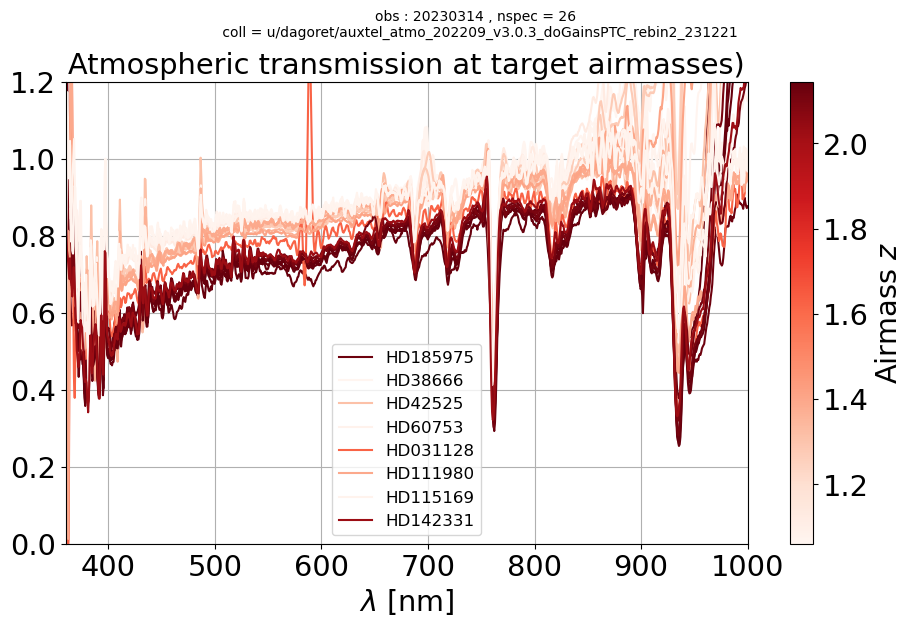

>>> ID.     :  20230315 [2023031500617, 2023031500618, 2023031500625, 2023031500648, 2023031500649, 2023031500671, 2023031500679, 2023031500686, 2023031500687, 2023031500710, 2023031500711, 2023031500734, 2023031500750, 2023031500757, 2023031500773, 2023031500780, 2023031500788, 2023031500789, 2023031500804, 2023031500805, 2023031500816, 2023031500826, 2023031500827, 2023031500851, 2023031500852, 2023031500868, 2023031500869, 2023031500876, 2023031500877, 2023031500909, 2023031500916, 2023031500917, 2023031500936, 2023031500944, 2023031500945, 2023031500952, 2023031500960, 2023031500961]
>>> AIRMASS :  20230315 [2.08009019139918, 2.07966874677314, 1.81745365148966, 1.02682669371887, 1.02650555788769, 2.05129160288991, 1.96523775078416, 1.44488807722145, 1.44104094121499, 2.03552070431424, 2.03504070921181, 1.0334490972539, 1.68458172279762, 2.01192466599686, 1.01480578545481, 1.06541244815566, 1.02217215740821, 1.02276260478355, 1.98824343496557, 1.9877521726463, 1.13756892674686, 1.43

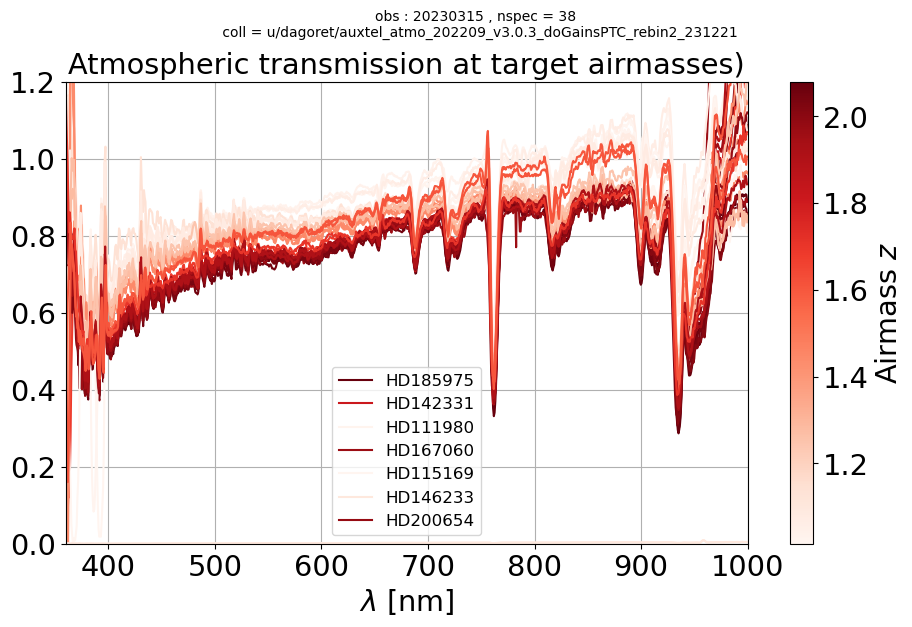

>>> ID.     :  20230316 [2023031600465, 2023031600466, 2023031600505, 2023031600528, 2023031600536, 2023031600537, 2023031600544, 2023031600577, 2023031600578, 2023031600597, 2023031600598, 2023031600609, 2023031600645, 2023031600646, 2023031600653, 2023031600654, 2023031600670, 2023031600697, 2023031600698, 2023031600705, 2023031600706, 2023031600713, 2023031600722, 2023031600723, 2023031600730, 2023031600731]
>>> AIRMASS :  20230316 [2.03400592655944, 2.03352279493008, 2.01302511013865, 1.0636647283467, 1.1736308517053, 1.17209952540389, 1.98942826697258, 1.05507541933052, 1.05603872496483, 1.4094662483749, 1.40752856329125, 1.09316481719458, 1.93932012218486, 1.93886521316258, 1.30886321980073, 1.30749286208415, 1.07486676590063, 1.30723598944496, 1.31016456934463, 1.32526147746481, 1.32832421967727, 1.56932590843368, 1.9049146038722, 1.90452262217935, 1.2213769529501, 1.22060381157914]


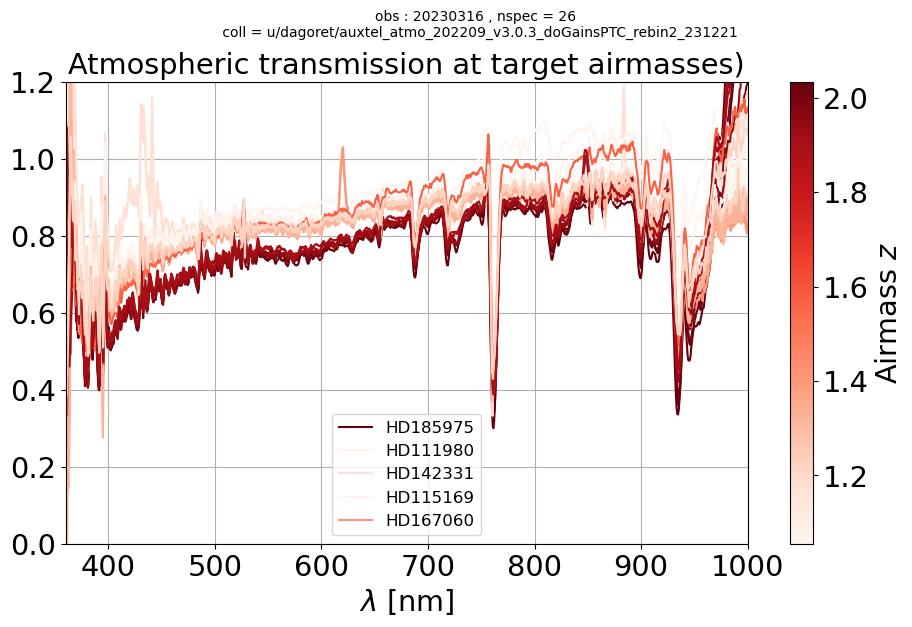

>>> ID.     :  20230509 [2023050900219, 2023050900246, 2023050900261, 2023050900266, 2023050900273, 2023050900277, 2023050900282, 2023050900303, 2023050900307, 2023050900318, 2023050900322, 2023050900333, 2023050900348, 2023050900357, 2023050900370, 2023050900375, 2023050900396, 2023050900401, 2023050900404, 2023050900433, 2023050900455, 2023050900463, 2023050900487, 2023050900495, 2023050900533, 2023050900536, 2023050900563, 2023050900568, 2023050900571]
>>> AIRMASS :  20230509 [2.11343157433828, 2.10765475120457, 2.10424037978258, 2.1029866811808, 2.10200453061821, 2.10044075779482, 2.09916078948801, 2.09020929190358, 2.08716113746942, 2.0827746701475, 2.07959946261938, 2.07502804714499, 1.89690144916061, 1.82885188941274, 2.05507716148904, 2.05206106246471, 2.03642870266502, 2.03321102539422, 2.02995061947697, 2.00659211747942, 1.98882459151926, 1.98225593169243, 1.95921032049555, 1.95292369339313, 1.92876128667423, 1.92583068623957, 1.91016880771014, 1.90749497471013, 1.90479237753

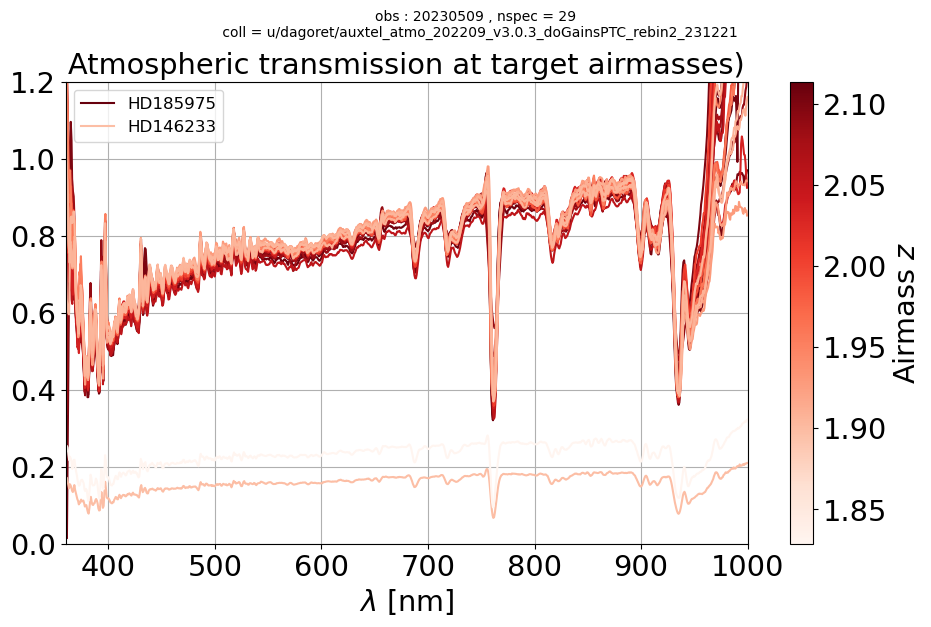

>>> ID.     :  20230510 [2023051000074, 2023051000092, 2023051000217, 2023051000246, 2023051000258, 2023051000273, 2023051000278, 2023051000283, 2023051000286, 2023051000298, 2023051000307, 2023051000310, 2023051000314, 2023051000319, 2023051000322, 2023051000340, 2023051000349, 2023051000352, 2023051000391, 2023051000448, 2023051000514, 2023051000539, 2023051000544]
>>> AIRMASS :  20230510 [1.5785475769034, 1.92247323875567, 1.92928081518651, 1.71473192381336, 1.65343998894951, 1.58439629555213, 1.55059677363194, 1.53023956585983, 1.51844628346825, 1.47423910015565, 2.0293637021588, 2.02738759783776, 1.40494085881122, 1.39000943638941, 1.38151199788185, 1.33321379055218, 2.00973410170732, 2.00776364371274, 1.98494206127801, 1.95738486570833, 1.07841342461423, 1.91400894095347, 1.91228294181441]


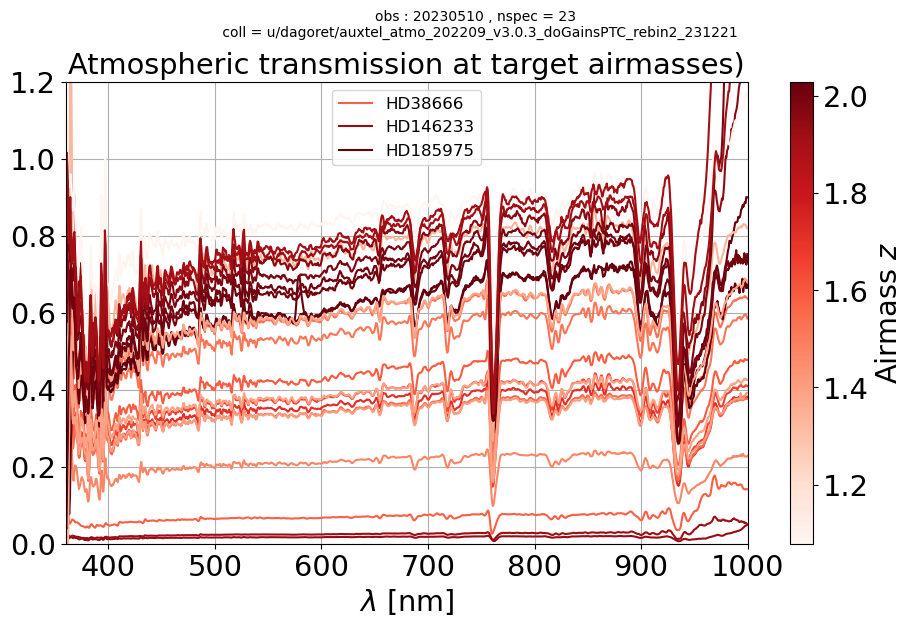

>>> ID.     :  20230511 [2023051100155, 2023051100203, 2023051100208, 2023051100233, 2023051100236, 2023051100252, 2023051100260]
>>> AIRMASS :  20230511 [2.12609636466074, 2.11347828604249, 2.11238762221875, 2.10333154555355, 2.10150949040569, 2.09519440372642, 2.09174818838066]


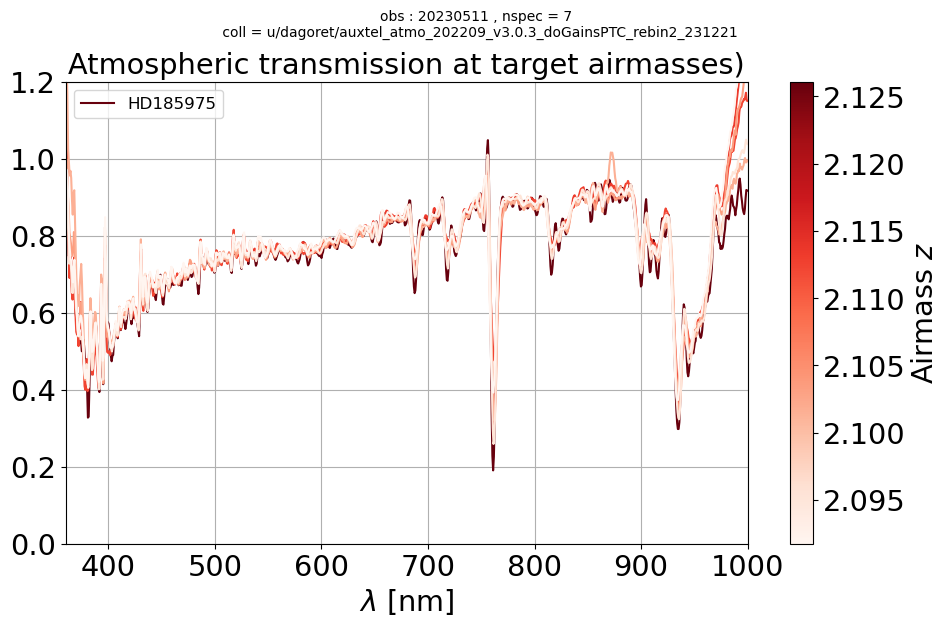

>>> ID.     :  20230523 [2023052300136, 2023052300163, 2023052300173, 2023052300178, 2023052300187, 2023052300192, 2023052300201, 2023052300243, 2023052300244, 2023052300261, 2023052300271, 2023052300285, 2023052300286, 2023052300290, 2023052300308, 2023052300309, 2023052300312, 2023052300327, 2023052300336, 2023052300337, 2023052300340, 2023052300364, 2023052300365, 2023052300368, 2023052300369, 2023052300378, 2023052300379, 2023052300382, 2023052300397, 2023052300406, 2023052300407, 2023052300410, 2023052300421, 2023052300424, 2023052300425, 2023052300435, 2023052300449, 2023052300463, 2023052300476, 2023052300525, 2023052300526, 2023052300536, 2023052300539, 2023052300540, 2023052300568, 2023052300605, 2023052300606]
>>> AIRMASS :  20230523 [2.34209652295272, 1.42485004666331, 2.10253732456904, 2.10040995721411, 1.4986015533225, 1.51391805003652, 1.53993210880586, 2.07730423077466, 2.07687694367977, 1.93291551732892, 1.86542899722453, 1.91126852098939, 1.91735728911085, 1.9392436300

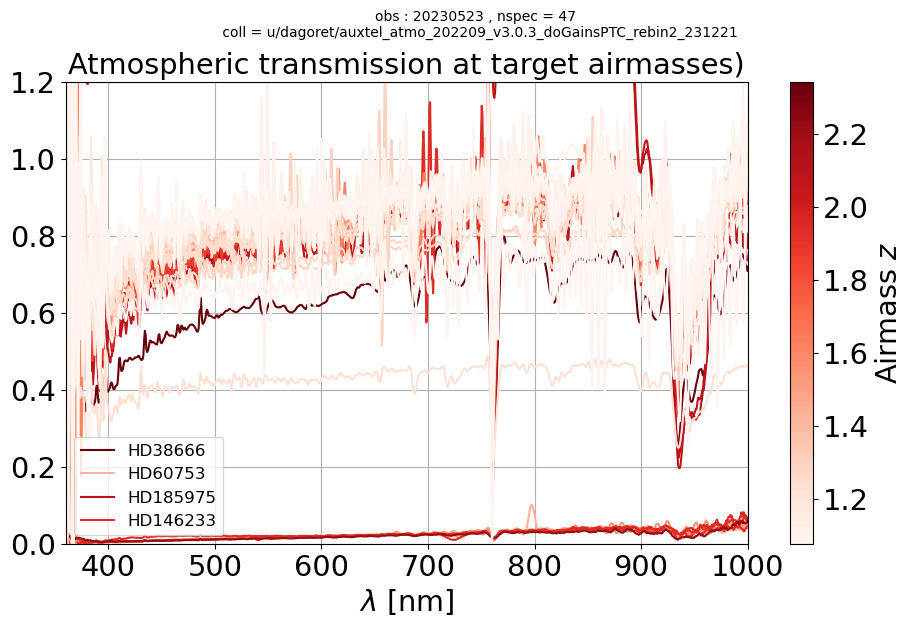

>>> ID.     :  20230524 [2023052400108, 2023052400122, 2023052400126, 2023052400140, 2023052400164, 2023052400165, 2023052400183, 2023052400220, 2023052400262, 2023052400313, 2023052400323, 2023052400324, 2023052400327, 2023052400328, 2023052400356, 2023052400366, 2023052400379, 2023052400384, 2023052400393, 2023052400397, 2023052400398, 2023052400411, 2023052400422, 2023052400425, 2023052400435, 2023052400439, 2023052400440, 2023052400449, 2023052400450, 2023052400453, 2023052400454, 2023052400463, 2023052400464, 2023052400467, 2023052400482, 2023052400483, 2023052400516, 2023052400529, 2023052400539, 2023052400544, 2023052400553, 2023052400554, 2023052400558, 2023052400568, 2023052400592, 2023052400614, 2023052400615, 2023052400632]
>>> AIRMASS :  20230524 [2.12465212286755, 2.0618336637087, 2.09396226073964, 2.21095463938341, 2.11000128927129, 2.10966898658168, 1.43985789481421, 1.53862194787178, 2.07847317785142, 1.72898184809466, 1.67961864517054, 1.67367463999926, 1.6595577477847

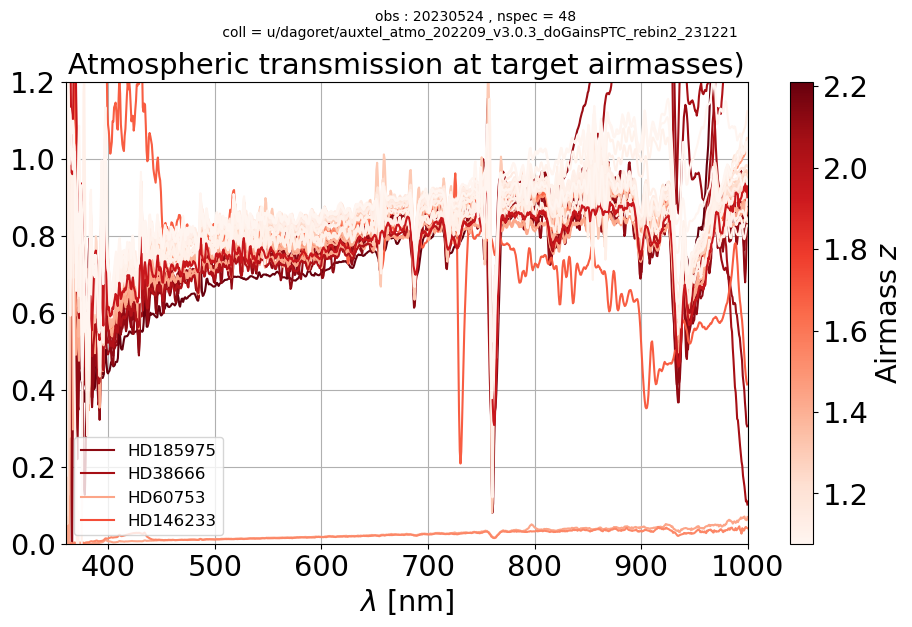

>>> ID.     :  20230718 [2023071800373, 2023071800374]
>>> AIRMASS :  20230718 [1.23317103363995, 1.23523476918121]


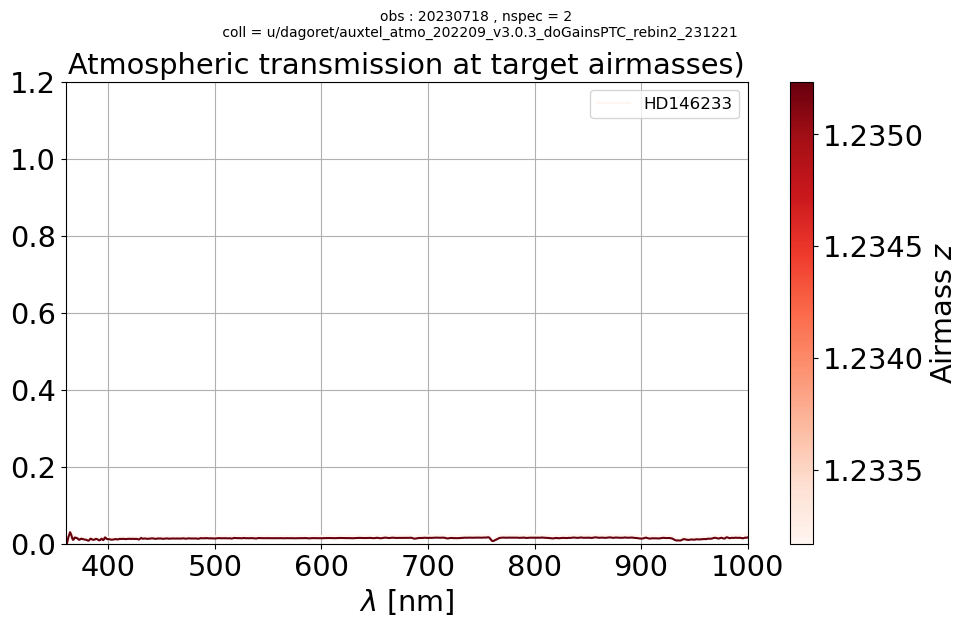

>>> ID.     :  20230720 [2023072000270, 2023072000271, 2023072000273, 2023072000284, 2023072000311, 2023072000312]
>>> AIRMASS :  20230720 [1.2895608249951, 1.29211629254986, 1.29701282292402, 1.32212190501342, 1.49794308598069, 1.50228082956296]


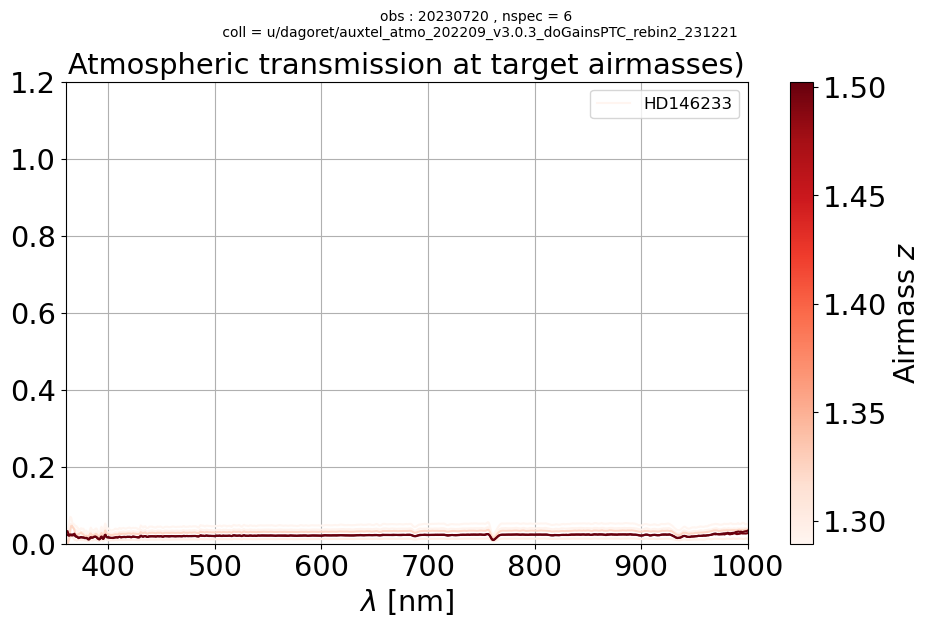

>>> ID.     :  20230802 [2023080200279, 2023080200283, 2023080200322, 2023080200326, 2023080200327, 2023080200347, 2023080200357, 2023080200374, 2023080200383, 2023080200397, 2023080200427, 2023080200441, 2023080200445, 2023080200468, 2023080200482, 2023080200483, 2023080200487, 2023080200500, 2023080200511, 2023080200515, 2023080200533, 2023080200538, 2023080200548, 2023080200552, 2023080200590, 2023080200595]
>>> AIRMASS :  20230802 [1.11214942813158, 1.10918319071681, 1.90072922202072, 1.89915281810168, 1.89877380391195, 1.10211845656388, 1.10899530703049, 1.87438284186746, 1.16677803581331, 1.1870446645985, 1.86003414523185, 1.28044016605367, 1.29050495250995, 1.34822772955582, 1.38881459808005, 1.39221233659104, 1.40556413571959, 1.44978824272949, 1.49142862157904, 1.50867609502175, 1.6649307990592, 1.69444687071782, 1.83902950675908, 1.83853737276687, 2.11392506836435, 2.16788380568966]


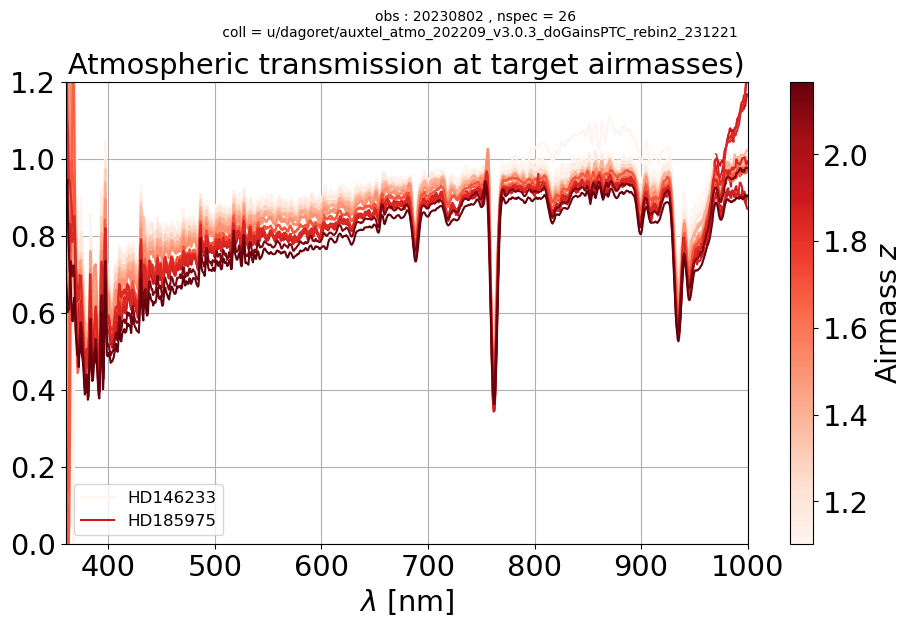

>>> ID.     :  20230815 [2023081500089, 2023081500092, 2023081500093]
>>> AIRMASS :  20230815 [1.12349113356613, 1.12636534097281, 1.12741358372055]


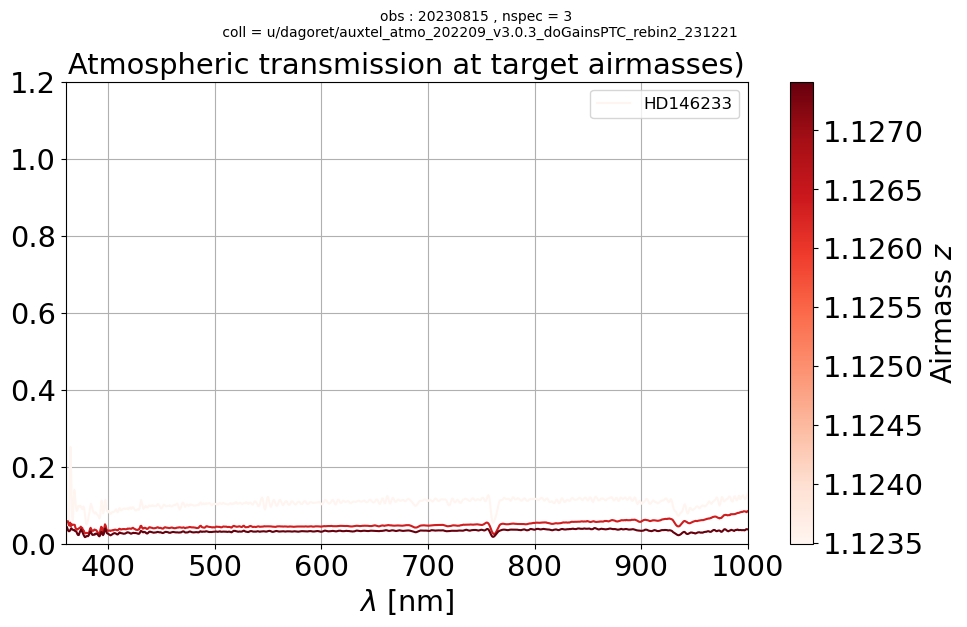

>>> ID.     :  20230817 [2023081700147, 2023081700148, 2023081700171, 2023081700180, 2023081700194, 2023081700198, 2023081700199, 2023081700210, 2023081700214, 2023081700223, 2023081700224, 2023081700227, 2023081700228, 2023081700238, 2023081700241, 2023081700255, 2023081700265, 2023081700269, 2023081700283, 2023081700399, 2023081700402, 2023081700403, 2023081700427, 2023081700428, 2023081700431]
>>> AIRMASS :  20230817 [1.90213246518016, 1.90174688300204, 1.09892798820923, 1.10408986658847, 1.11365731525183, 1.11678963599777, 1.11772244687571, 1.88026234977412, 1.87890657432482, 1.14570652991062, 1.14696595934408, 1.15015276237363, 1.15145223820965, 1.16263166106059, 1.16616655507634, 1.18406135111356, 1.1978571027524, 1.2040191755487, 1.85498715253697, 1.81586688204159, 1.83414570682073, 1.84168055940217, 2.05657481190569, 2.06651799012285, 2.09169731224271]


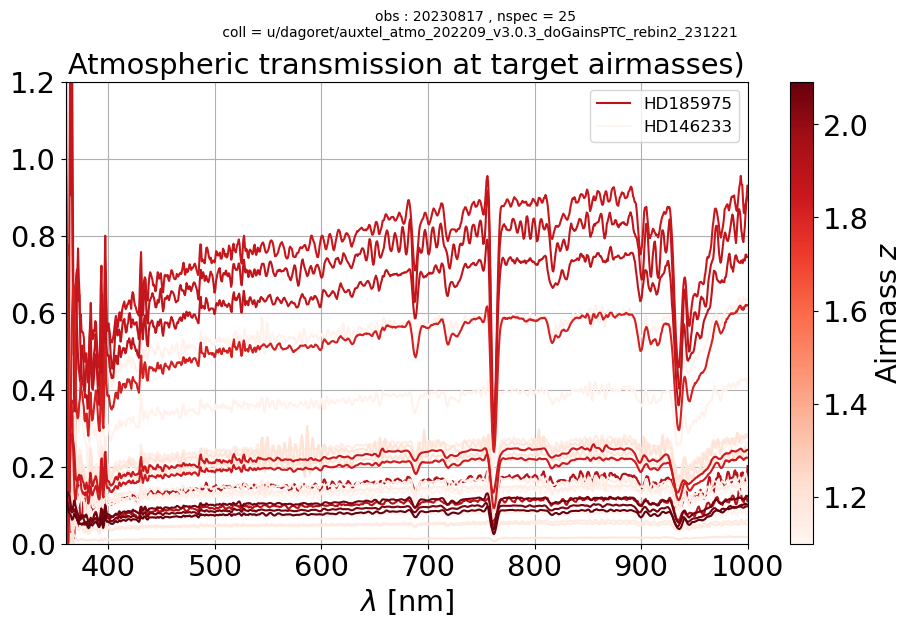

>>> ID.     :  20230829 [2023082900178, 2023082900179, 2023082900196, 2023082900207, 2023082900208, 2023082900211, 2023082900225, 2023082900235, 2023082900267, 2023082900268, 2023082900282, 2023082900300, 2023082900314, 2023082900328, 2023082900332, 2023082900513, 2023082900514, 2023082900527, 2023082900528, 2023082900547, 2023082900561, 2023082900564, 2023082900565, 2023082900575]
>>> AIRMASS :  20230829 [1.88470825467038, 1.88436876963307, 1.18479783112553, 1.86467850120137, 1.86441033085145, 1.86353151208722, 1.24183490488347, 1.26063888012561, 1.33218196119298, 1.33509755490152, 1.37270632653219, 1.44832742214086, 1.49873873853439, 1.55397957883045, 1.57143065954184, 1.37604368470279, 1.37350960588095, 1.34627024131621, 1.34391811324843, 1.29543788517038, 1.27146949756964, 1.2665278647307, 1.26467754802181, 1.87597089622311]


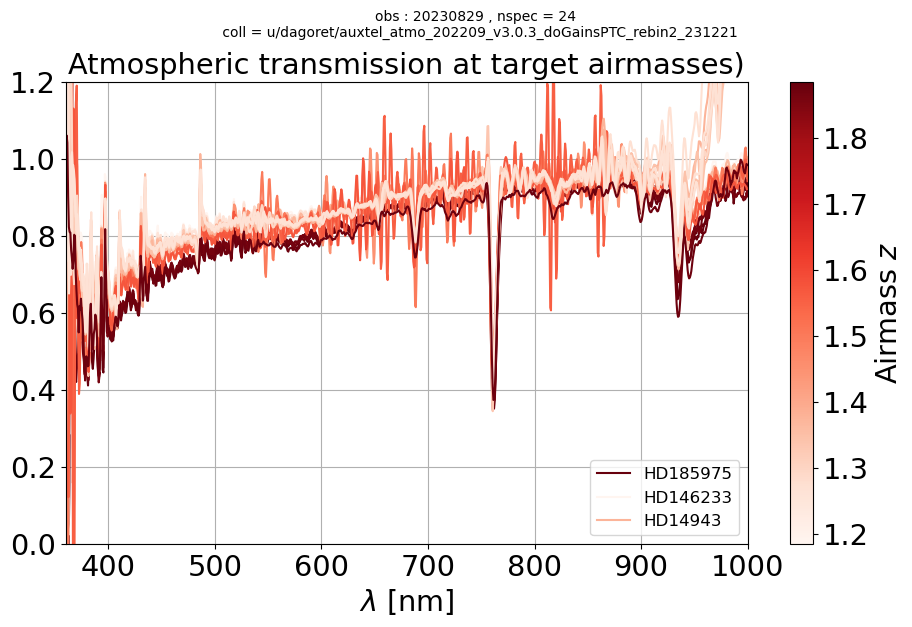

>>> ID.     :  20230912 [2023091200279, 2023091200280, 2023091200310, 2023091200339, 2023091200355, 2023091200369, 2023091200385, 2023091200399, 2023091200400]
>>> AIRMASS :  20230912 [1.49749038873525, 1.49302430183466, 1.00944042010164, 1.2660818973897, 1.03948475708906, 1.08063564053323, 1.32193233161797, 1.08020809551917, 1.08140773154475]


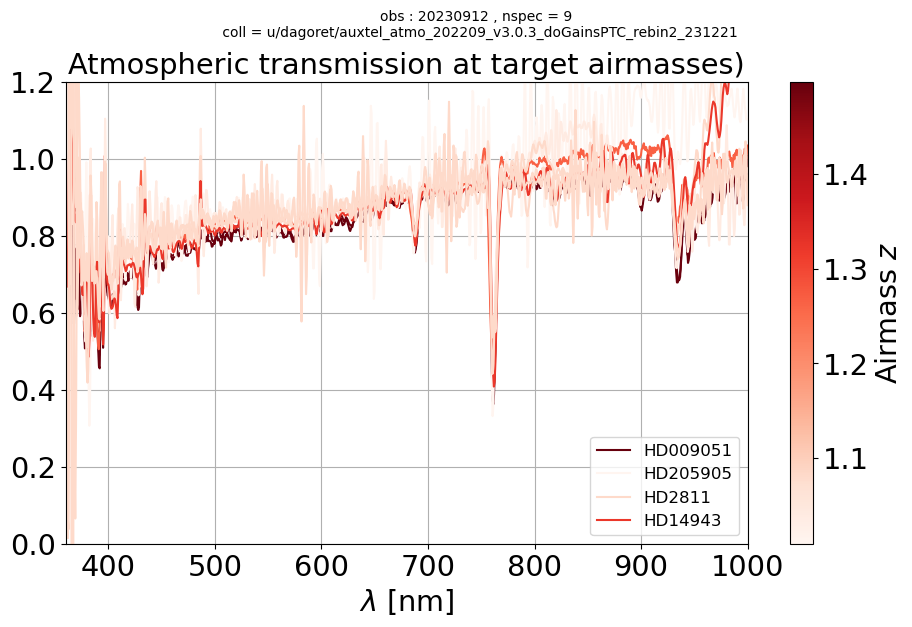

>>> ID.     :  20230913 [2023091300241, 2023091300242, 2023091300294, 2023091300317, 2023091300329, 2023091300341, 2023091300342, 2023091300353, 2023091300365, 2023091300377, 2023091300378]
>>> AIRMASS :  20230913 [1.28440326281454, 1.28688145334467, 1.10452874278131, 1.40337786586141, 1.08825621201515, 1.14563701920897, 1.14673877217034, 1.06888295393804, 1.13845491980004, 1.26679959930738, 1.26493058152807]


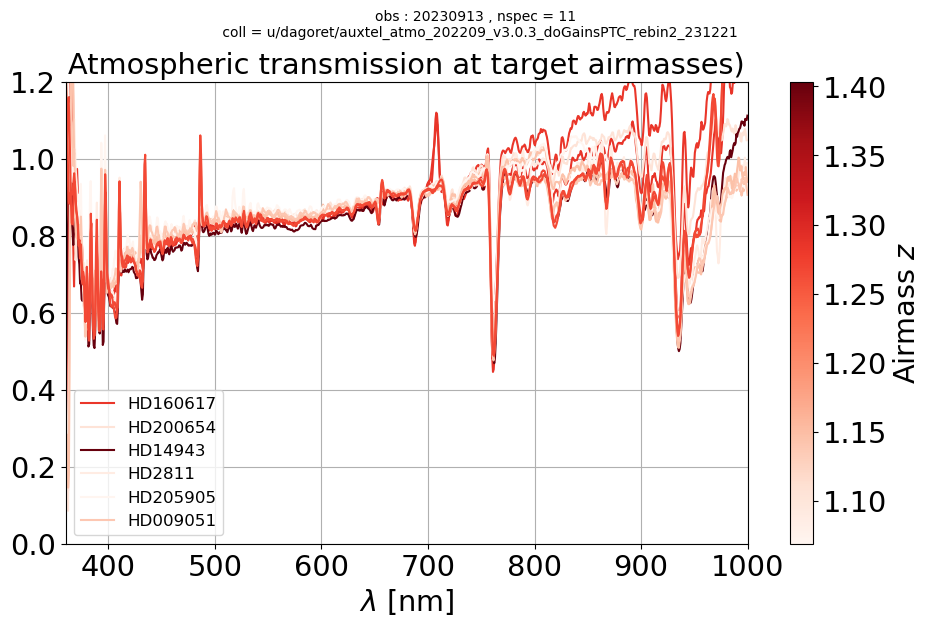

>>> ID.     :  20230914 [2023091400118, 2023091400119, 2023091400131, 2023091400144, 2023091400167, 2023091400168, 2023091400181, 2023091400214, 2023091400250, 2023091400251]
>>> AIRMASS :  20230914 [1.84439625044174, 1.84452779219763, 1.66708323227302, 1.55214571359915, 1.26123304107552, 1.25862026246905, 1.85840534410981, 1.06157334450309, 1.87916645710655, 1.87947396682595]


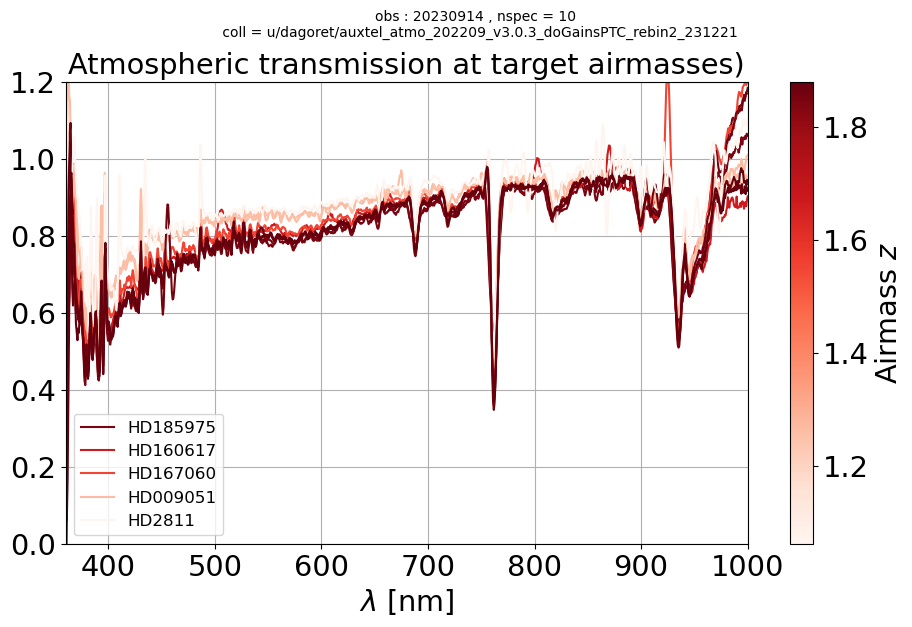

In [59]:
count = 0
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]

    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    #print(df_sel)
    
    if N > 1:
        plot_atmtransmission(filtered_spectra, [spec.airmass for spec in filtered_spectra],all_calspecs_sm,tel,disp,collection=my_collection,dateobs=DATEOBS)
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")


## Plot atmospheric transmissions for airmass = 1

$$
T(z_{pred}) = \frac{ \left( T(z_{meas}) \right)^\left( \frac{z_{pred}}{z_{meas}}\right)}{(T^{grey}_{z_{meas}})^{z_{pred}}}
$$

>>> ID.     :  20230301 [2023030100202, 2023030100203, 2023030100226, 2023030100234, 2023030100245, 2023030100334, 2023030100372, 2023030100387, 2023030100395, 2023030100396, 2023030100411, 2023030100419, 2023030100420, 2023030100428, 2023030100436, 2023030100459, 2023030100480, 2023030100481, 2023030100510, 2023030100511, 2023030100518, 2023030100519, 2023030100526, 2023030100527, 2023030100534, 2023030100535, 2023030100542, 2023030100543, 2023030100558, 2023030100590, 2023030100591]
>>> AIRMASS :  20230301 [2.11606233070534, 2.11634868218645, 1.23756367766552, 2.12304135551742, 2.12598769849146, 2.14056338640106, 2.14398106650482, 1.89511058706701, 1.78175002163602, 1.77469915464334, 1.69716482526135, 1.6598482147741, 1.65396389386553, 1.65235742647028, 1.58317026749421, 1.14706213174787, 1.64542046882683, 1.65118043303605, 2.12947709215028, 2.1292459537962, 1.27868362831032, 1.27598570720332, 1.23115574017684, 1.22881081074598, 1.23596580004635, 1.23357878783009, 1.20220602613382, 1

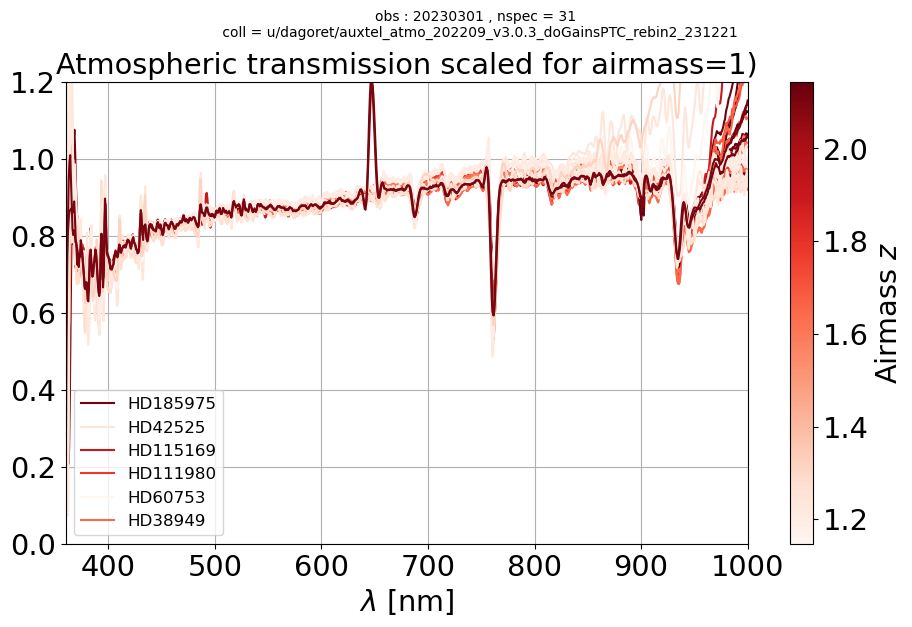

>>> ID.     :  20230302 [2023030200035, 2023030200036, 2023030200074, 2023030200075, 2023030200112, 2023030200113, 2023030200155, 2023030200156, 2023030200194, 2023030200195, 2023030200232, 2023030200268, 2023030200304, 2023030200305, 2023030200329, 2023030200336, 2023030200337]
>>> AIRMASS :  20230302 [2.12001744298021, 2.12028670433759, 1.14864480902725, 1.15040646659113, 1.10351905789798, 1.10490937908041, 2.14363602554733, 2.14367859479511, 2.14386085621785, 2.1438293913104, 2.14212145750023, 2.13478914922226, 2.12580612251266, 2.12555022519417, 1.18156996496099, 1.15580623940899, 1.15406702740023]


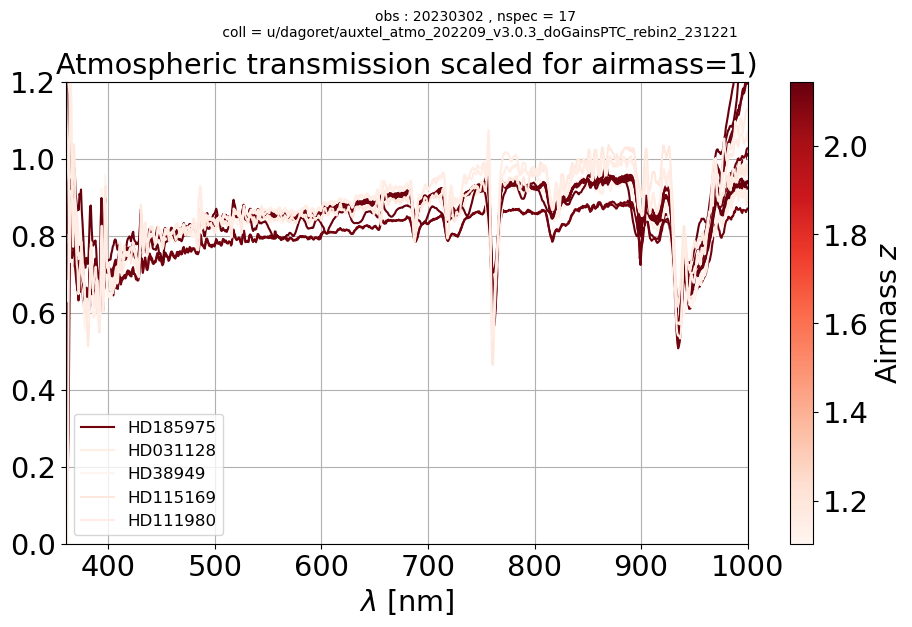

>>> ID.     :  20230314 [2023031400420, 2023031400434, 2023031400435, 2023031400442, 2023031400443, 2023031400484, 2023031400495, 2023031400502, 2023031400503, 2023031400518, 2023031400519, 2023031400543, 2023031400550, 2023031400558, 2023031400559, 2023031400567, 2023031400585, 2023031400586, 2023031400625, 2023031400626, 2023031400702, 2023031400721, 2023031400745, 2023031400756, 2023031400757, 2023031400773]
>>> AIRMASS :  20230314 [2.12994374205826, 1.06081704454551, 1.06181540286087, 1.06674059958947, 1.06779366917243, 1.12759324843365, 2.14254589971645, 1.31196111915822, 1.31293494616134, 1.07889135680549, 1.07928674691495, 2.14444996602254, 1.36318909397648, 1.27365632298425, 1.2762883395051, 1.62143487338154, 2.14257278084106, 2.14248204084494, 1.39305163441858, 1.38942249260787, 2.11271330771437, 1.41172657524325, 2.09920808341142, 1.07395502859235, 1.07283071692411, 2.02950673277995]


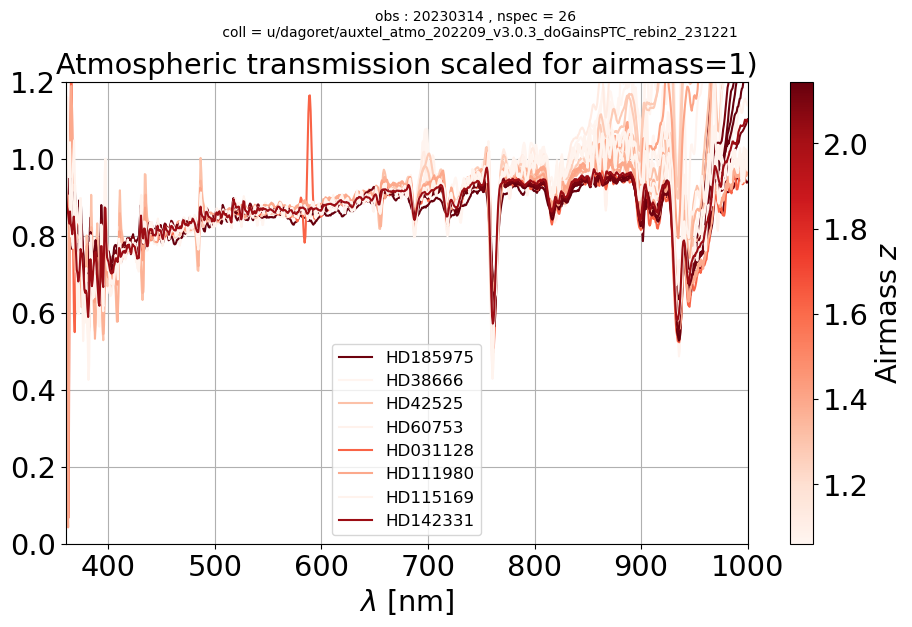

>>> ID.     :  20230315 [2023031500617, 2023031500618, 2023031500625, 2023031500648, 2023031500649, 2023031500671, 2023031500679, 2023031500686, 2023031500687, 2023031500710, 2023031500711, 2023031500734, 2023031500750, 2023031500757, 2023031500773, 2023031500780, 2023031500788, 2023031500789, 2023031500804, 2023031500805, 2023031500816, 2023031500826, 2023031500827, 2023031500851, 2023031500852, 2023031500868, 2023031500869, 2023031500876, 2023031500877, 2023031500909, 2023031500916, 2023031500917, 2023031500936, 2023031500944, 2023031500945, 2023031500952, 2023031500960, 2023031500961]
>>> AIRMASS :  20230315 [2.08009019139918, 2.07966874677314, 1.81745365148966, 1.02682669371887, 1.02650555788769, 2.05129160288991, 1.96523775078416, 1.44488807722145, 1.44104094121499, 2.03552070431424, 2.03504070921181, 1.0334490972539, 1.68458172279762, 2.01192466599686, 1.01480578545481, 1.06541244815566, 1.02217215740821, 1.02276260478355, 1.98824343496557, 1.9877521726463, 1.13756892674686, 1.43

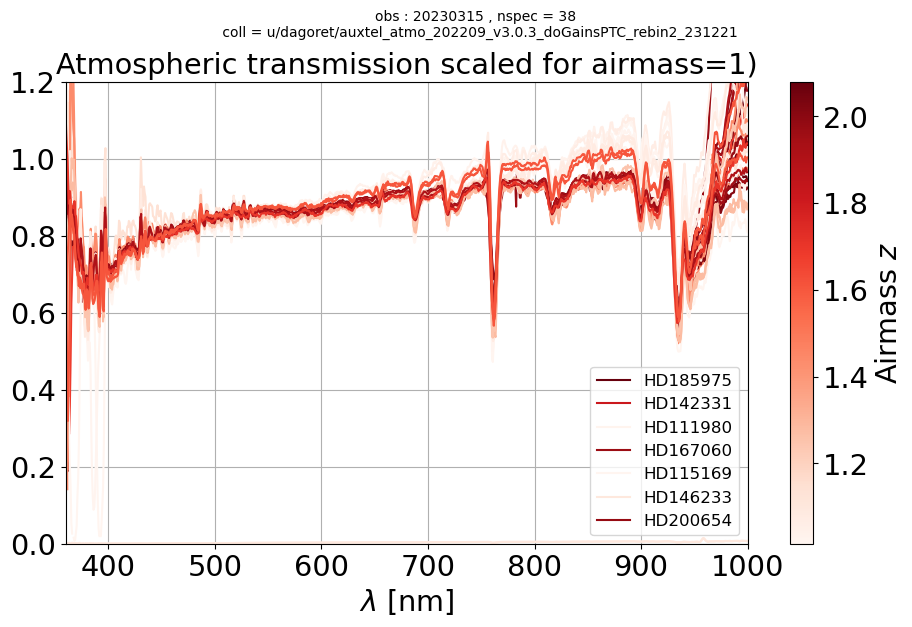

>>> ID.     :  20230316 [2023031600465, 2023031600466, 2023031600505, 2023031600528, 2023031600536, 2023031600537, 2023031600544, 2023031600577, 2023031600578, 2023031600597, 2023031600598, 2023031600609, 2023031600645, 2023031600646, 2023031600653, 2023031600654, 2023031600670, 2023031600697, 2023031600698, 2023031600705, 2023031600706, 2023031600713, 2023031600722, 2023031600723, 2023031600730, 2023031600731]
>>> AIRMASS :  20230316 [2.03400592655944, 2.03352279493008, 2.01302511013865, 1.0636647283467, 1.1736308517053, 1.17209952540389, 1.98942826697258, 1.05507541933052, 1.05603872496483, 1.4094662483749, 1.40752856329125, 1.09316481719458, 1.93932012218486, 1.93886521316258, 1.30886321980073, 1.30749286208415, 1.07486676590063, 1.30723598944496, 1.31016456934463, 1.32526147746481, 1.32832421967727, 1.56932590843368, 1.9049146038722, 1.90452262217935, 1.2213769529501, 1.22060381157914]


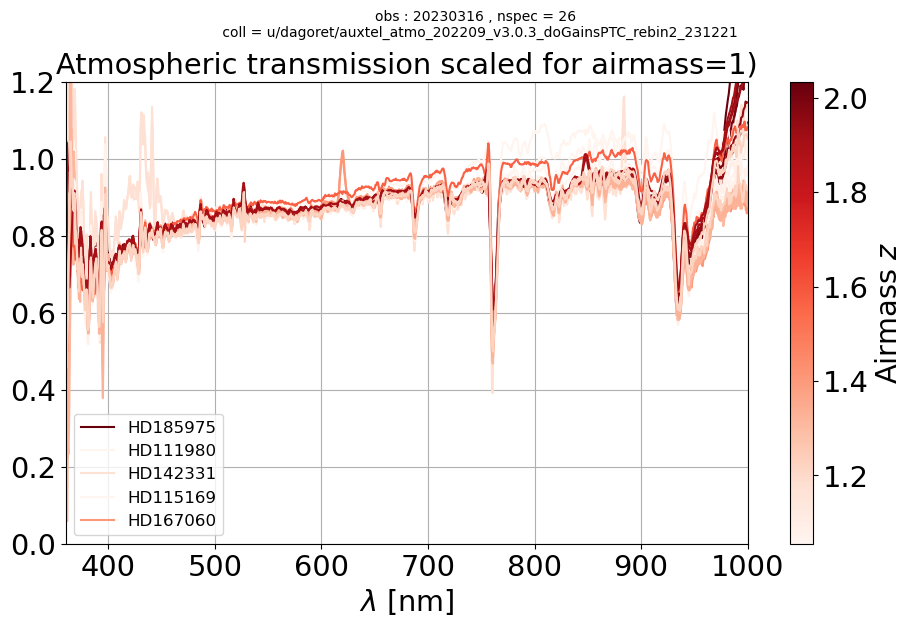

>>> ID.     :  20230509 [2023050900219, 2023050900246, 2023050900261, 2023050900266, 2023050900273, 2023050900277, 2023050900282, 2023050900303, 2023050900307, 2023050900318, 2023050900322, 2023050900333, 2023050900348, 2023050900357, 2023050900370, 2023050900375, 2023050900396, 2023050900401, 2023050900404, 2023050900433, 2023050900455, 2023050900463, 2023050900487, 2023050900495, 2023050900533, 2023050900536, 2023050900563, 2023050900568, 2023050900571]
>>> AIRMASS :  20230509 [2.11343157433828, 2.10765475120457, 2.10424037978258, 2.1029866811808, 2.10200453061821, 2.10044075779482, 2.09916078948801, 2.09020929190358, 2.08716113746942, 2.0827746701475, 2.07959946261938, 2.07502804714499, 1.89690144916061, 1.82885188941274, 2.05507716148904, 2.05206106246471, 2.03642870266502, 2.03321102539422, 2.02995061947697, 2.00659211747942, 1.98882459151926, 1.98225593169243, 1.95921032049555, 1.95292369339313, 1.92876128667423, 1.92583068623957, 1.91016880771014, 1.90749497471013, 1.90479237753

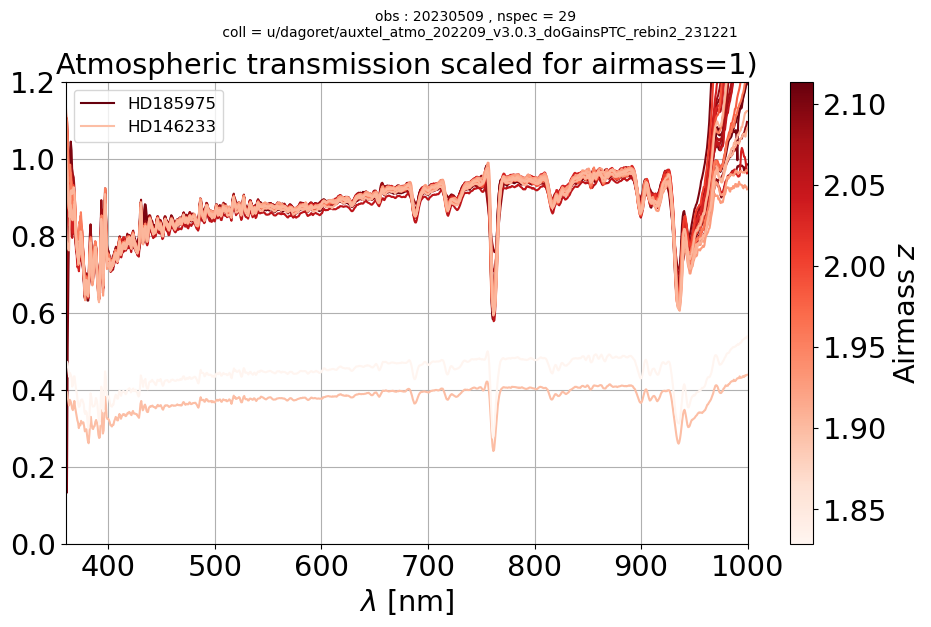

>>> ID.     :  20230510 [2023051000074, 2023051000092, 2023051000217, 2023051000246, 2023051000258, 2023051000273, 2023051000278, 2023051000283, 2023051000286, 2023051000298, 2023051000307, 2023051000310, 2023051000314, 2023051000319, 2023051000322, 2023051000340, 2023051000349, 2023051000352, 2023051000391, 2023051000448, 2023051000514, 2023051000539, 2023051000544]
>>> AIRMASS :  20230510 [1.5785475769034, 1.92247323875567, 1.92928081518651, 1.71473192381336, 1.65343998894951, 1.58439629555213, 1.55059677363194, 1.53023956585983, 1.51844628346825, 1.47423910015565, 2.0293637021588, 2.02738759783776, 1.40494085881122, 1.39000943638941, 1.38151199788185, 1.33321379055218, 2.00973410170732, 2.00776364371274, 1.98494206127801, 1.95738486570833, 1.07841342461423, 1.91400894095347, 1.91228294181441]


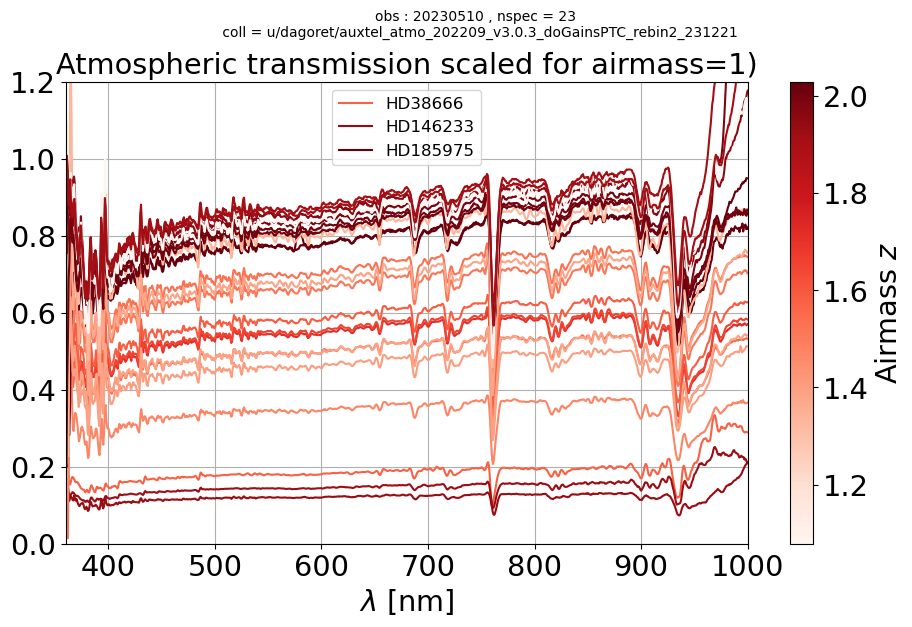

>>> ID.     :  20230511 [2023051100155, 2023051100203, 2023051100208, 2023051100233, 2023051100236, 2023051100252, 2023051100260]
>>> AIRMASS :  20230511 [2.12609636466074, 2.11347828604249, 2.11238762221875, 2.10333154555355, 2.10150949040569, 2.09519440372642, 2.09174818838066]


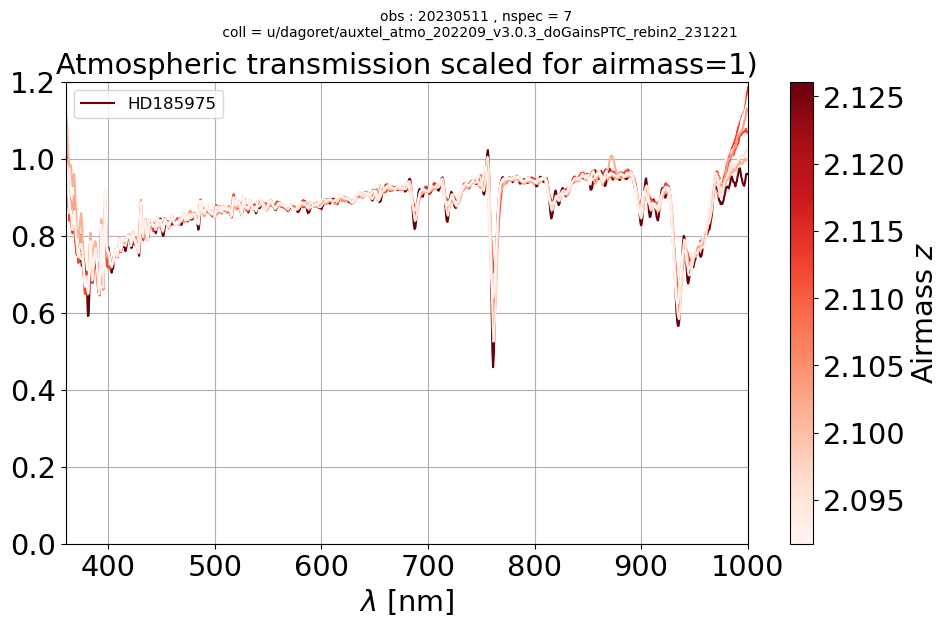

>>> ID.     :  20230523 [2023052300136, 2023052300163, 2023052300173, 2023052300178, 2023052300187, 2023052300192, 2023052300201, 2023052300243, 2023052300244, 2023052300261, 2023052300271, 2023052300285, 2023052300286, 2023052300290, 2023052300308, 2023052300309, 2023052300312, 2023052300327, 2023052300336, 2023052300337, 2023052300340, 2023052300364, 2023052300365, 2023052300368, 2023052300369, 2023052300378, 2023052300379, 2023052300382, 2023052300397, 2023052300406, 2023052300407, 2023052300410, 2023052300421, 2023052300424, 2023052300425, 2023052300435, 2023052300449, 2023052300463, 2023052300476, 2023052300525, 2023052300526, 2023052300536, 2023052300539, 2023052300540, 2023052300568, 2023052300605, 2023052300606]
>>> AIRMASS :  20230523 [2.34209652295272, 1.42485004666331, 2.10253732456904, 2.10040995721411, 1.4986015533225, 1.51391805003652, 1.53993210880586, 2.07730423077466, 2.07687694367977, 1.93291551732892, 1.86542899722453, 1.91126852098939, 1.91735728911085, 1.9392436300

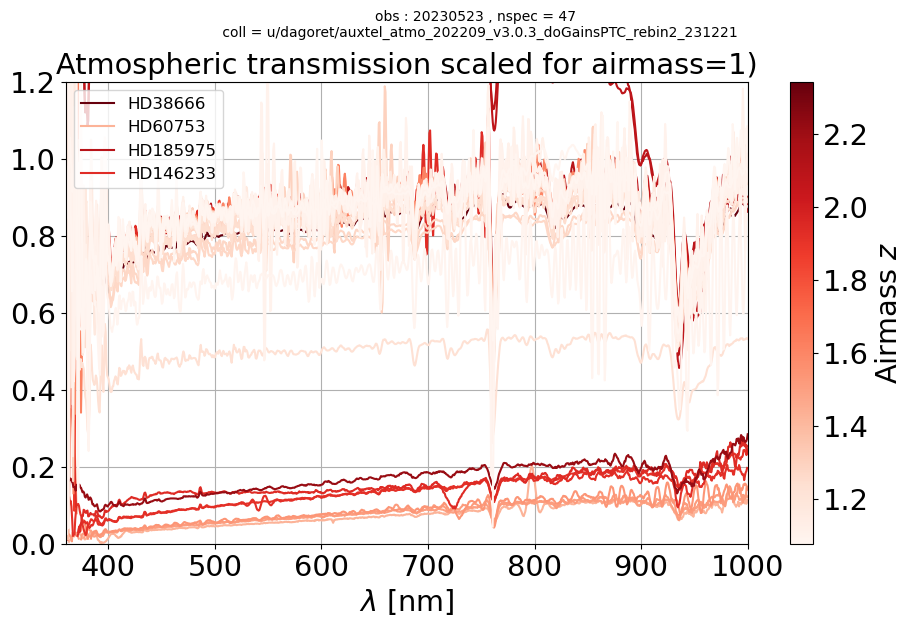

>>> ID.     :  20230524 [2023052400108, 2023052400122, 2023052400126, 2023052400140, 2023052400164, 2023052400165, 2023052400183, 2023052400220, 2023052400262, 2023052400313, 2023052400323, 2023052400324, 2023052400327, 2023052400328, 2023052400356, 2023052400366, 2023052400379, 2023052400384, 2023052400393, 2023052400397, 2023052400398, 2023052400411, 2023052400422, 2023052400425, 2023052400435, 2023052400439, 2023052400440, 2023052400449, 2023052400450, 2023052400453, 2023052400454, 2023052400463, 2023052400464, 2023052400467, 2023052400482, 2023052400483, 2023052400516, 2023052400529, 2023052400539, 2023052400544, 2023052400553, 2023052400554, 2023052400558, 2023052400568, 2023052400592, 2023052400614, 2023052400615, 2023052400632]
>>> AIRMASS :  20230524 [2.12465212286755, 2.0618336637087, 2.09396226073964, 2.21095463938341, 2.11000128927129, 2.10966898658168, 1.43985789481421, 1.53862194787178, 2.07847317785142, 1.72898184809466, 1.67961864517054, 1.67367463999926, 1.6595577477847

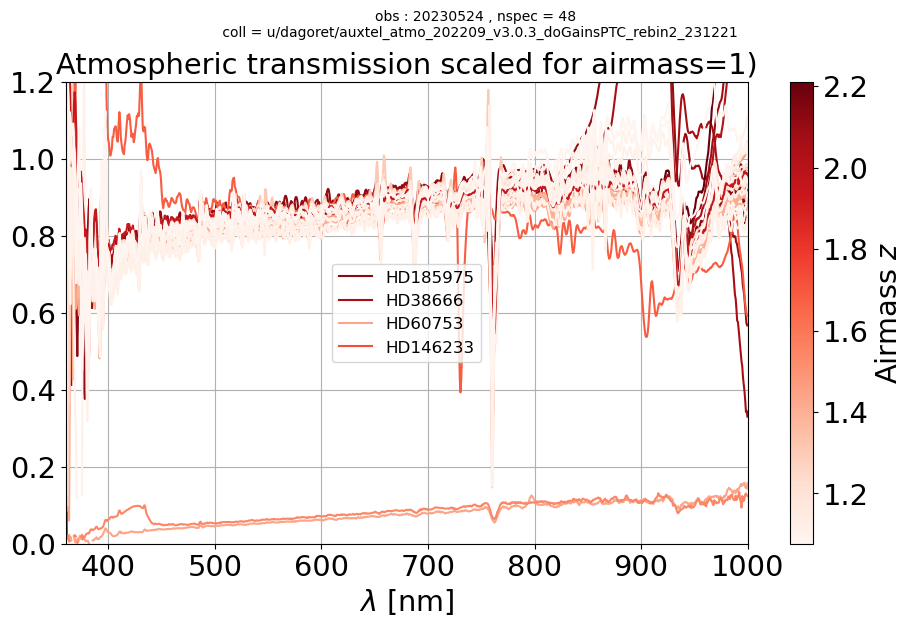

>>> ID.     :  20230718 [2023071800373, 2023071800374]
>>> AIRMASS :  20230718 [1.23317103363995, 1.23523476918121]


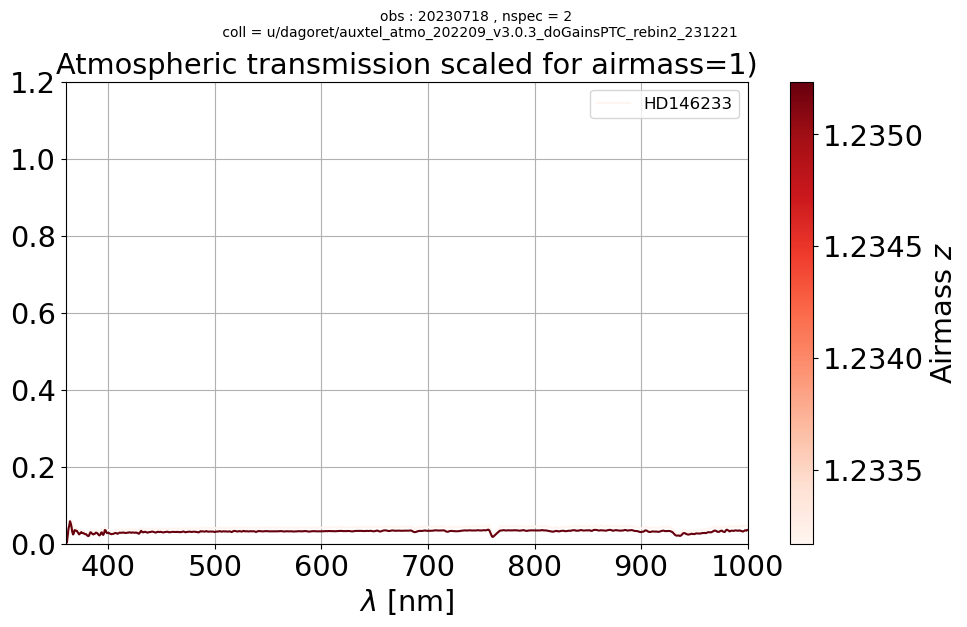

>>> ID.     :  20230720 [2023072000270, 2023072000271, 2023072000273, 2023072000284, 2023072000311, 2023072000312]
>>> AIRMASS :  20230720 [1.2895608249951, 1.29211629254986, 1.29701282292402, 1.32212190501342, 1.49794308598069, 1.50228082956296]


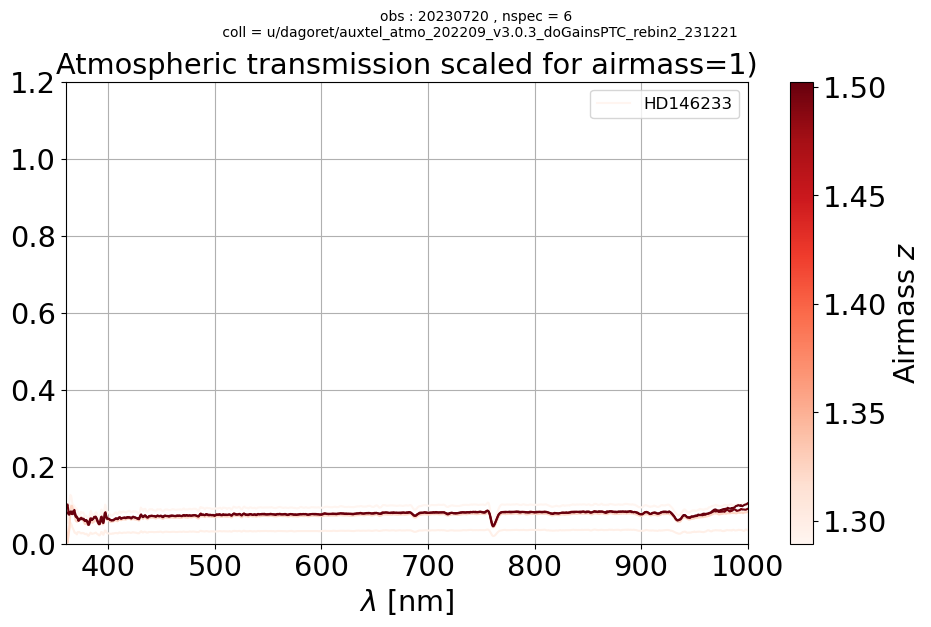

>>> ID.     :  20230802 [2023080200279, 2023080200283, 2023080200322, 2023080200326, 2023080200327, 2023080200347, 2023080200357, 2023080200374, 2023080200383, 2023080200397, 2023080200427, 2023080200441, 2023080200445, 2023080200468, 2023080200482, 2023080200483, 2023080200487, 2023080200500, 2023080200511, 2023080200515, 2023080200533, 2023080200538, 2023080200548, 2023080200552, 2023080200590, 2023080200595]
>>> AIRMASS :  20230802 [1.11214942813158, 1.10918319071681, 1.90072922202072, 1.89915281810168, 1.89877380391195, 1.10211845656388, 1.10899530703049, 1.87438284186746, 1.16677803581331, 1.1870446645985, 1.86003414523185, 1.28044016605367, 1.29050495250995, 1.34822772955582, 1.38881459808005, 1.39221233659104, 1.40556413571959, 1.44978824272949, 1.49142862157904, 1.50867609502175, 1.6649307990592, 1.69444687071782, 1.83902950675908, 1.83853737276687, 2.11392506836435, 2.16788380568966]


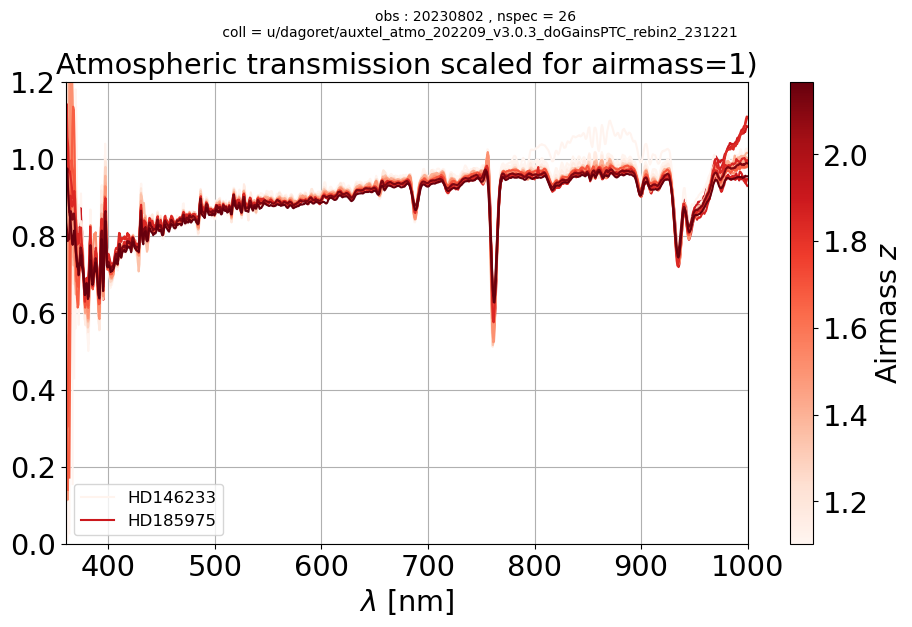

>>> ID.     :  20230815 [2023081500089, 2023081500092, 2023081500093]
>>> AIRMASS :  20230815 [1.12349113356613, 1.12636534097281, 1.12741358372055]


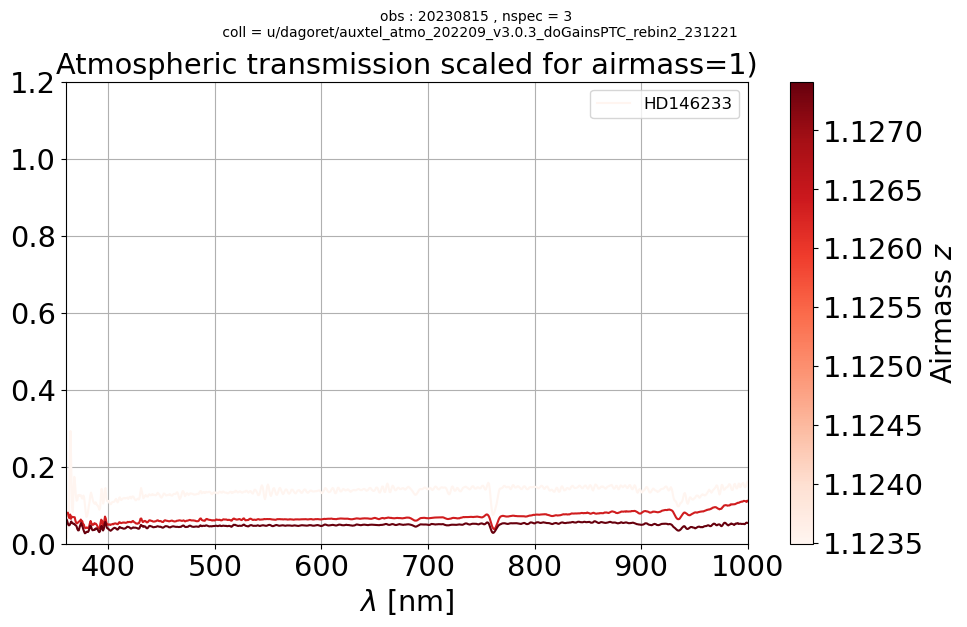

>>> ID.     :  20230817 [2023081700147, 2023081700148, 2023081700171, 2023081700180, 2023081700194, 2023081700198, 2023081700199, 2023081700210, 2023081700214, 2023081700223, 2023081700224, 2023081700227, 2023081700228, 2023081700238, 2023081700241, 2023081700255, 2023081700265, 2023081700269, 2023081700283, 2023081700399, 2023081700402, 2023081700403, 2023081700427, 2023081700428, 2023081700431]
>>> AIRMASS :  20230817 [1.90213246518016, 1.90174688300204, 1.09892798820923, 1.10408986658847, 1.11365731525183, 1.11678963599777, 1.11772244687571, 1.88026234977412, 1.87890657432482, 1.14570652991062, 1.14696595934408, 1.15015276237363, 1.15145223820965, 1.16263166106059, 1.16616655507634, 1.18406135111356, 1.1978571027524, 1.2040191755487, 1.85498715253697, 1.81586688204159, 1.83414570682073, 1.84168055940217, 2.05657481190569, 2.06651799012285, 2.09169731224271]


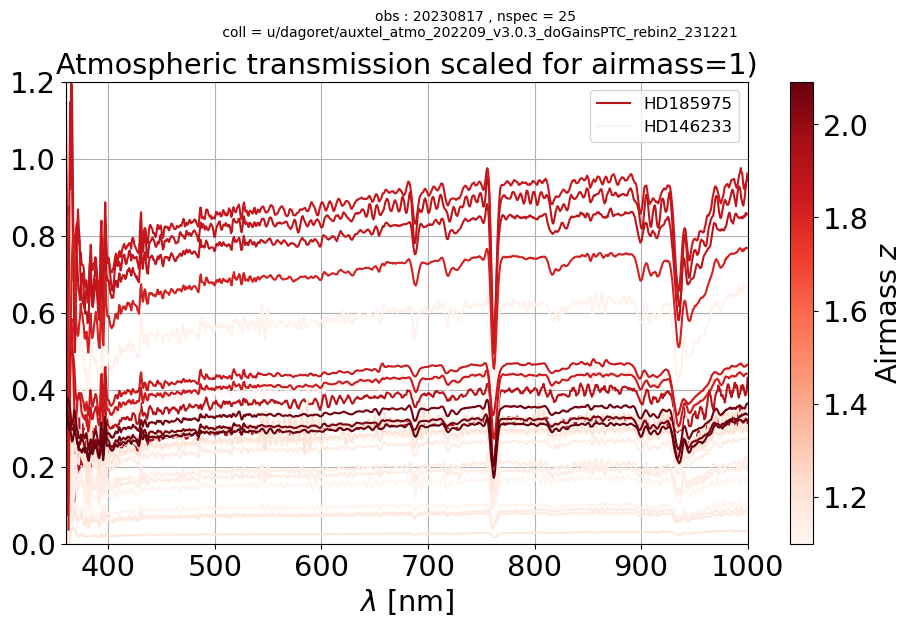

>>> ID.     :  20230829 [2023082900178, 2023082900179, 2023082900196, 2023082900207, 2023082900208, 2023082900211, 2023082900225, 2023082900235, 2023082900267, 2023082900268, 2023082900282, 2023082900300, 2023082900314, 2023082900328, 2023082900332, 2023082900513, 2023082900514, 2023082900527, 2023082900528, 2023082900547, 2023082900561, 2023082900564, 2023082900565, 2023082900575]
>>> AIRMASS :  20230829 [1.88470825467038, 1.88436876963307, 1.18479783112553, 1.86467850120137, 1.86441033085145, 1.86353151208722, 1.24183490488347, 1.26063888012561, 1.33218196119298, 1.33509755490152, 1.37270632653219, 1.44832742214086, 1.49873873853439, 1.55397957883045, 1.57143065954184, 1.37604368470279, 1.37350960588095, 1.34627024131621, 1.34391811324843, 1.29543788517038, 1.27146949756964, 1.2665278647307, 1.26467754802181, 1.87597089622311]


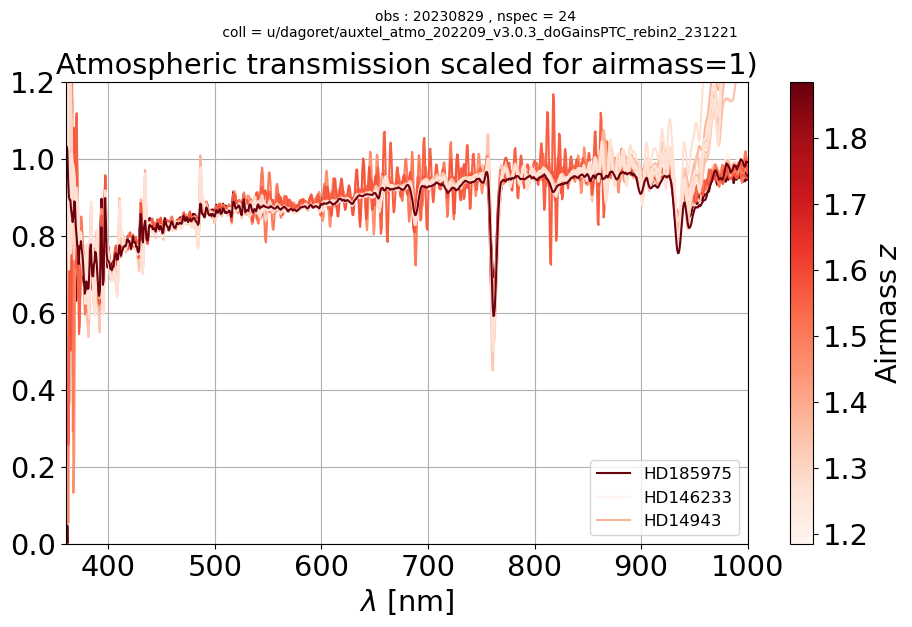

>>> ID.     :  20230912 [2023091200279, 2023091200280, 2023091200310, 2023091200339, 2023091200355, 2023091200369, 2023091200385, 2023091200399, 2023091200400]
>>> AIRMASS :  20230912 [1.49749038873525, 1.49302430183466, 1.00944042010164, 1.2660818973897, 1.03948475708906, 1.08063564053323, 1.32193233161797, 1.08020809551917, 1.08140773154475]


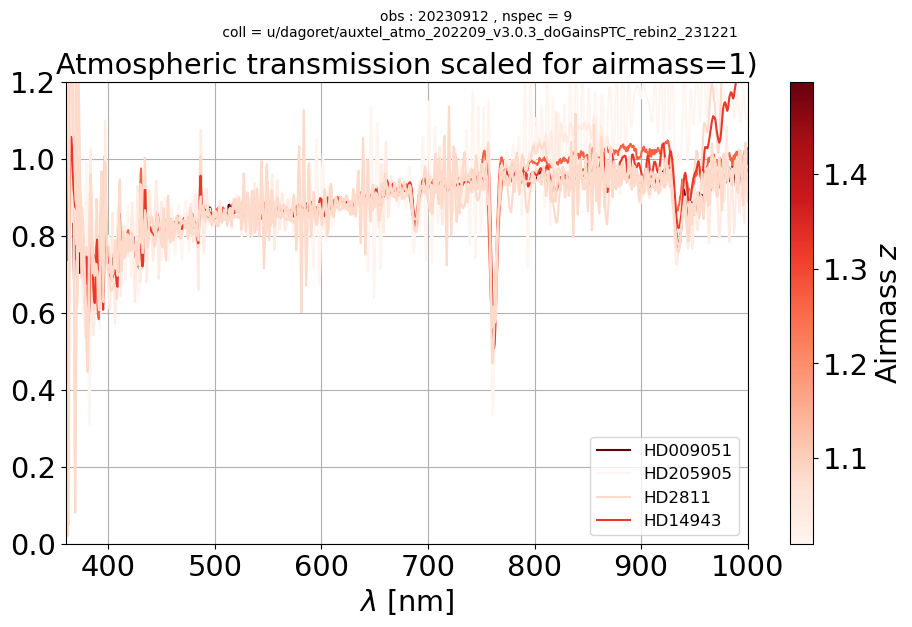

>>> ID.     :  20230913 [2023091300241, 2023091300242, 2023091300294, 2023091300317, 2023091300329, 2023091300341, 2023091300342, 2023091300353, 2023091300365, 2023091300377, 2023091300378]
>>> AIRMASS :  20230913 [1.28440326281454, 1.28688145334467, 1.10452874278131, 1.40337786586141, 1.08825621201515, 1.14563701920897, 1.14673877217034, 1.06888295393804, 1.13845491980004, 1.26679959930738, 1.26493058152807]


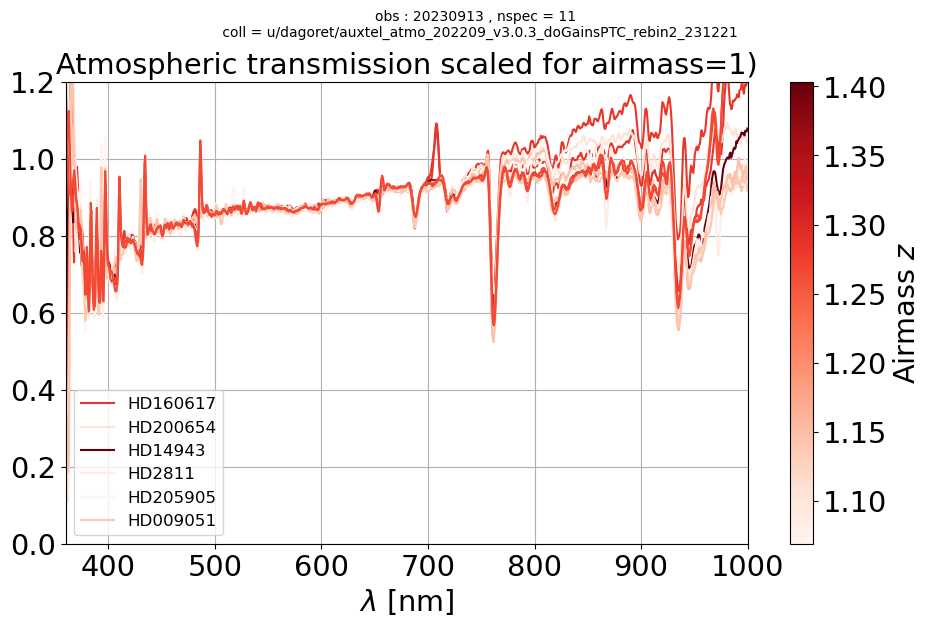

>>> ID.     :  20230914 [2023091400118, 2023091400119, 2023091400131, 2023091400144, 2023091400167, 2023091400168, 2023091400181, 2023091400214, 2023091400250, 2023091400251]
>>> AIRMASS :  20230914 [1.84439625044174, 1.84452779219763, 1.66708323227302, 1.55214571359915, 1.26123304107552, 1.25862026246905, 1.85840534410981, 1.06157334450309, 1.87916645710655, 1.87947396682595]


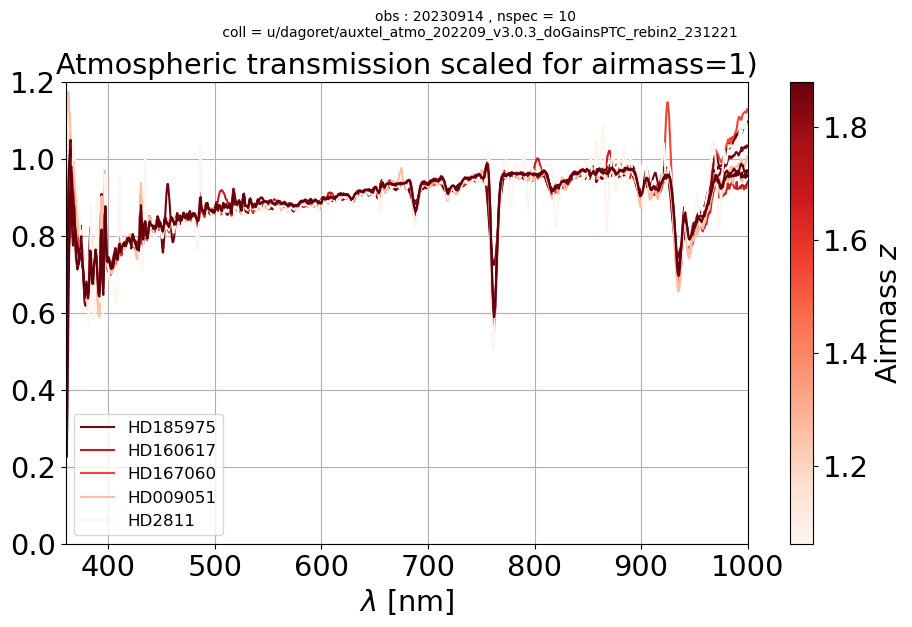

In [60]:
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]

    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    #print(df_sel)
    

    if N > 1:
        plot_atmtransmission_zcorr(filtered_spectra, [ spec.airmass for spec in filtered_spectra ],all_calspecs_sm,tel,disp,collection=my_collection,dateobs=DATEOBS )
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")    

## Show with simulation

In [61]:
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]
    
    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])

    break
    

>>> ID.     :  20230301 [2023030100202, 2023030100203, 2023030100226, 2023030100234, 2023030100245, 2023030100334, 2023030100372, 2023030100387, 2023030100395, 2023030100396, 2023030100411, 2023030100419, 2023030100420, 2023030100428, 2023030100436, 2023030100459, 2023030100480, 2023030100481, 2023030100510, 2023030100511, 2023030100518, 2023030100519, 2023030100526, 2023030100527, 2023030100534, 2023030100535, 2023030100542, 2023030100543, 2023030100558, 2023030100590, 2023030100591]
>>> AIRMASS :  20230301 [2.11606233070534, 2.11634868218645, 1.23756367766552, 2.12304135551742, 2.12598769849146, 2.14056338640106, 2.14398106650482, 1.89511058706701, 1.78175002163602, 1.77469915464334, 1.69716482526135, 1.6598482147741, 1.65396389386553, 1.65235742647028, 1.58317026749421, 1.14706213174787, 1.64542046882683, 1.65118043303605, 2.12947709215028, 2.1292459537962, 1.27868362831032, 1.27598570720332, 1.23115574017684, 1.22881081074598, 1.23596580004635, 1.23357878783009, 1.20220602613382, 1

In [62]:
df_good = df_sel[df_sel.filtered].drop(["id","filtered"],axis=1)
m_A1 , m_ozone, m_PWV, m_VAOD = df_good.mean().values
print(m_A1 , m_ozone, m_PWV, m_VAOD)

1.0270247528144285 323.75599746588324 2.5706140589050928 0.04721721878953475


In [63]:
for spec in filtered_spectra:
    row = df_sel[df_sel.id == spec.dataId]
    (s_id, s_target, s_A1, s_ozone, s_PWV, s_VAOD, s_flag) = row.values[0]
    if s_flag:
        pwv=s_PWV
        oz=s_ozone
        vaod=s_VAOD
        grey=s_A1
    else:
        pwv=m_PWV
        oz=m_ozone
        vaod=m_VAOD
        grey=m_A1

>>> ID.     :  20230301 [2023030100202, 2023030100203, 2023030100226, 2023030100234, 2023030100245, 2023030100334, 2023030100372, 2023030100387, 2023030100395, 2023030100396, 2023030100411, 2023030100419, 2023030100420, 2023030100428, 2023030100436, 2023030100459, 2023030100480, 2023030100481, 2023030100510, 2023030100511, 2023030100518, 2023030100519, 2023030100526, 2023030100527, 2023030100534, 2023030100535, 2023030100542, 2023030100543, 2023030100558, 2023030100590, 2023030100591]
>>> AIRMASS :  20230301 [2.11606233070534, 2.11634868218645, 1.23756367766552, 2.12304135551742, 2.12598769849146, 2.14056338640106, 2.14398106650482, 1.89511058706701, 1.78175002163602, 1.77469915464334, 1.69716482526135, 1.6598482147741, 1.65396389386553, 1.65235742647028, 1.58317026749421, 1.14706213174787, 1.64542046882683, 1.65118043303605, 2.12947709215028, 2.1292459537962, 1.27868362831032, 1.27598570720332, 1.23115574017684, 1.22881081074598, 1.23596580004635, 1.23357878783009, 1.20220602613382, 1

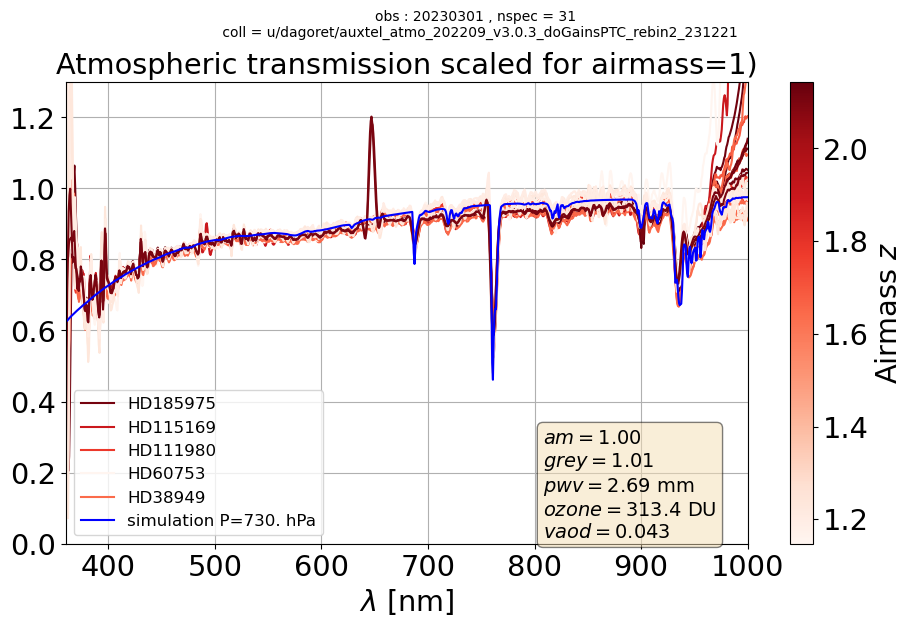

>>> ID.     :  20230302 [2023030200035, 2023030200036, 2023030200074, 2023030200075, 2023030200112, 2023030200113, 2023030200155, 2023030200156, 2023030200194, 2023030200195, 2023030200232, 2023030200268, 2023030200304, 2023030200305, 2023030200329, 2023030200336, 2023030200337]
>>> AIRMASS :  20230302 [2.12001744298021, 2.12028670433759, 1.14864480902725, 1.15040646659113, 1.10351905789798, 1.10490937908041, 2.14363602554733, 2.14367859479511, 2.14386085621785, 2.1438293913104, 2.14212145750023, 2.13478914922226, 2.12580612251266, 2.12555022519417, 1.18156996496099, 1.15580623940899, 1.15406702740023]
 mean atm parameters 0.9959784972182981 294.1284523271554 8.36071373996651 0.08600670788849513
AUXTEL site name validated as LSST observatory
AUXTEL site name validated as LSST observatory


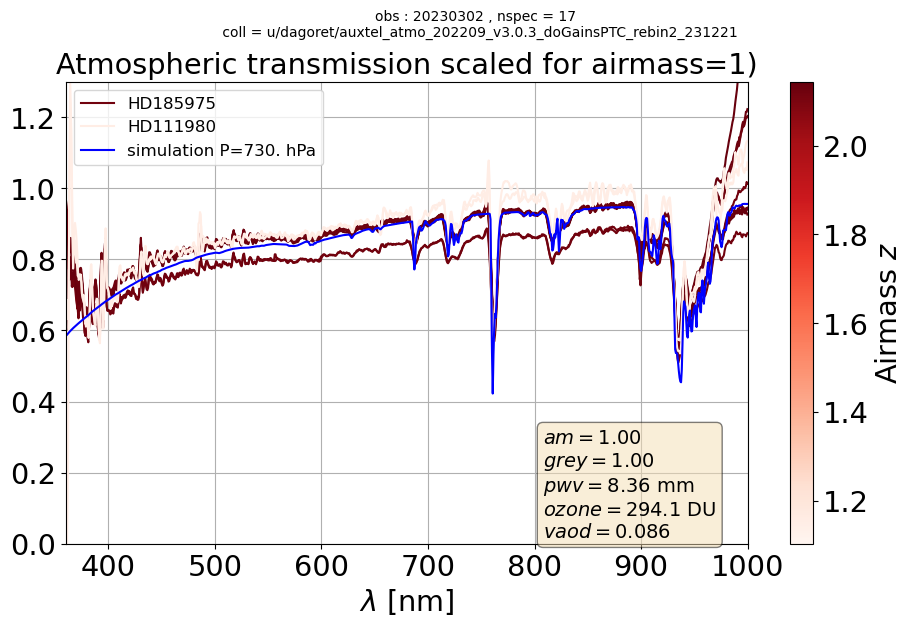

>>> ID.     :  20230314 [2023031400420, 2023031400434, 2023031400435, 2023031400442, 2023031400443, 2023031400484, 2023031400495, 2023031400502, 2023031400503, 2023031400518, 2023031400519, 2023031400543, 2023031400550, 2023031400558, 2023031400559, 2023031400567, 2023031400585, 2023031400586, 2023031400625, 2023031400626, 2023031400702, 2023031400721, 2023031400745, 2023031400756, 2023031400757, 2023031400773]
>>> AIRMASS :  20230314 [2.12994374205826, 1.06081704454551, 1.06181540286087, 1.06674059958947, 1.06779366917243, 1.12759324843365, 2.14254589971645, 1.31196111915822, 1.31293494616134, 1.07889135680549, 1.07928674691495, 2.14444996602254, 1.36318909397648, 1.27365632298425, 1.2762883395051, 1.62143487338154, 2.14257278084106, 2.14248204084494, 1.39305163441858, 1.38942249260787, 2.11271330771437, 1.41172657524325, 2.09920808341142, 1.07395502859235, 1.07283071692411, 2.02950673277995]
 mean atm parameters 1.0015332330368456 319.2110019413802 7.730148982585944 0.040371873129313

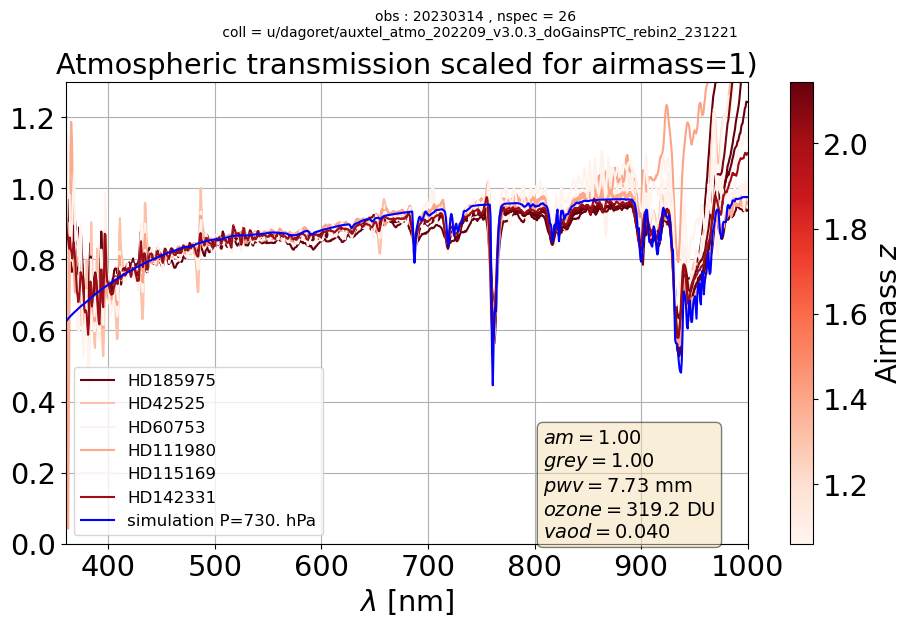

>>> ID.     :  20230315 [2023031500617, 2023031500618, 2023031500625, 2023031500648, 2023031500649, 2023031500671, 2023031500679, 2023031500686, 2023031500687, 2023031500710, 2023031500711, 2023031500734, 2023031500750, 2023031500757, 2023031500773, 2023031500780, 2023031500788, 2023031500789, 2023031500804, 2023031500805, 2023031500816, 2023031500826, 2023031500827, 2023031500851, 2023031500852, 2023031500868, 2023031500869, 2023031500876, 2023031500877, 2023031500909, 2023031500916, 2023031500917, 2023031500936, 2023031500944, 2023031500945, 2023031500952, 2023031500960, 2023031500961]
>>> AIRMASS :  20230315 [2.08009019139918, 2.07966874677314, 1.81745365148966, 1.02682669371887, 1.02650555788769, 2.05129160288991, 1.96523775078416, 1.44488807722145, 1.44104094121499, 2.03552070431424, 2.03504070921181, 1.0334490972539, 1.68458172279762, 2.01192466599686, 1.01480578545481, 1.06541244815566, 1.02217215740821, 1.02276260478355, 1.98824343496557, 1.9877521726463, 1.13756892674686, 1.43

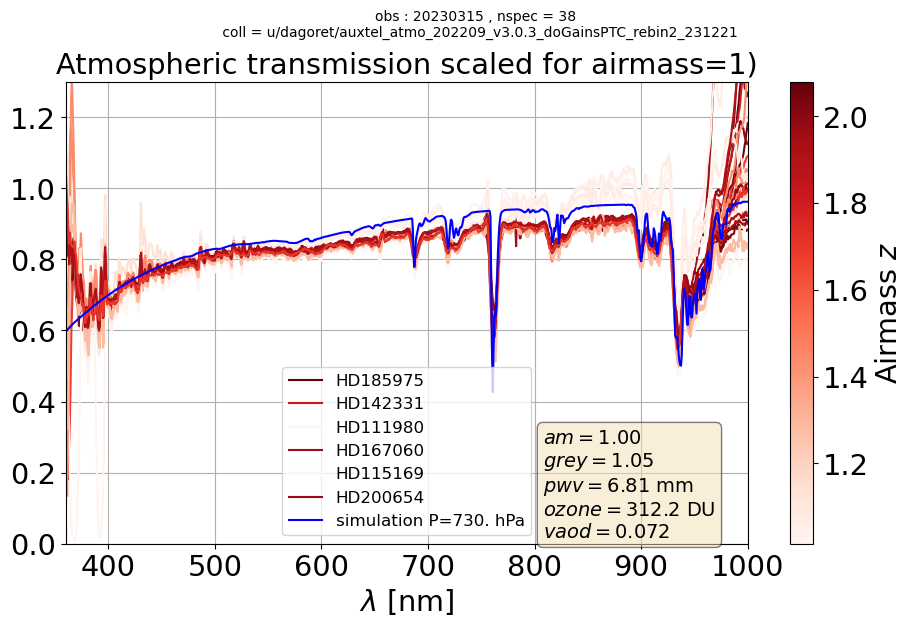

>>> ID.     :  20230316 [2023031600465, 2023031600466, 2023031600505, 2023031600528, 2023031600536, 2023031600537, 2023031600544, 2023031600577, 2023031600578, 2023031600597, 2023031600598, 2023031600609, 2023031600645, 2023031600646, 2023031600653, 2023031600654, 2023031600670, 2023031600697, 2023031600698, 2023031600705, 2023031600706, 2023031600713, 2023031600722, 2023031600723, 2023031600730, 2023031600731]
>>> AIRMASS :  20230316 [2.03400592655944, 2.03352279493008, 2.01302511013865, 1.0636647283467, 1.1736308517053, 1.17209952540389, 1.98942826697258, 1.05507541933052, 1.05603872496483, 1.4094662483749, 1.40752856329125, 1.09316481719458, 1.93932012218486, 1.93886521316258, 1.30886321980073, 1.30749286208415, 1.07486676590063, 1.30723598944496, 1.31016456934463, 1.32526147746481, 1.32832421967727, 1.56932590843368, 1.9049146038722, 1.90452262217935, 1.2213769529501, 1.22060381157914]
 mean atm parameters 0.9599184551932244 319.3766357690542 5.137144142897078 0.012443886444974473


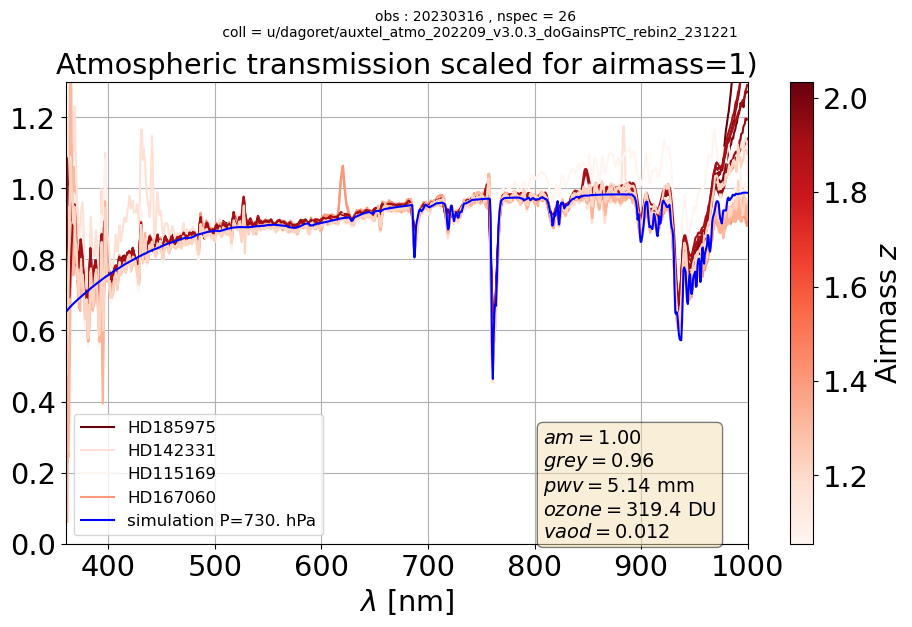

>>> ID.     :  20230509 [2023050900219, 2023050900246, 2023050900261, 2023050900266, 2023050900273, 2023050900277, 2023050900282, 2023050900303, 2023050900307, 2023050900318, 2023050900322, 2023050900333, 2023050900348, 2023050900357, 2023050900370, 2023050900375, 2023050900396, 2023050900401, 2023050900404, 2023050900433, 2023050900455, 2023050900463, 2023050900487, 2023050900495, 2023050900533, 2023050900536, 2023050900563, 2023050900568, 2023050900571]
>>> AIRMASS :  20230509 [2.11343157433828, 2.10765475120457, 2.10424037978258, 2.1029866811808, 2.10200453061821, 2.10044075779482, 2.09916078948801, 2.09020929190358, 2.08716113746942, 2.0827746701475, 2.07959946261938, 2.07502804714499, 1.89690144916061, 1.82885188941274, 2.05507716148904, 2.05206106246471, 2.03642870266502, 2.03321102539422, 2.02995061947697, 2.00659211747942, 1.98882459151926, 1.98225593169243, 1.95921032049555, 1.95292369339313, 1.92876128667423, 1.92583068623957, 1.91016880771014, 1.90749497471013, 1.90479237753

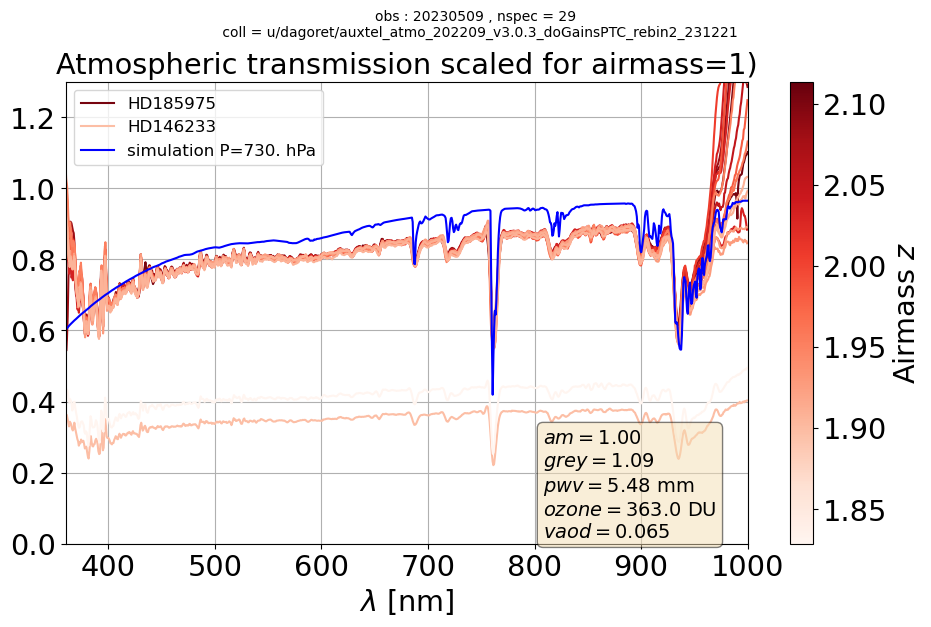

>>> ID.     :  20230510 [2023051000074, 2023051000092, 2023051000217, 2023051000246, 2023051000258, 2023051000273, 2023051000278, 2023051000283, 2023051000286, 2023051000298, 2023051000307, 2023051000310, 2023051000314, 2023051000319, 2023051000322, 2023051000340, 2023051000349, 2023051000352, 2023051000391, 2023051000448, 2023051000514, 2023051000539, 2023051000544]
>>> AIRMASS :  20230510 [1.5785475769034, 1.92247323875567, 1.92928081518651, 1.71473192381336, 1.65343998894951, 1.58439629555213, 1.55059677363194, 1.53023956585983, 1.51844628346825, 1.47423910015565, 2.0293637021588, 2.02738759783776, 1.40494085881122, 1.39000943638941, 1.38151199788185, 1.33321379055218, 2.00973410170732, 2.00776364371274, 1.98494206127801, 1.95738486570833, 1.07841342461423, 1.91400894095347, 1.91228294181441]
 mean atm parameters 0.6207179223845583 304.89536107220744 7.204510411441657 0.0
AUXTEL site name validated as LSST observatory
AUXTEL site name validated as LSST observatory


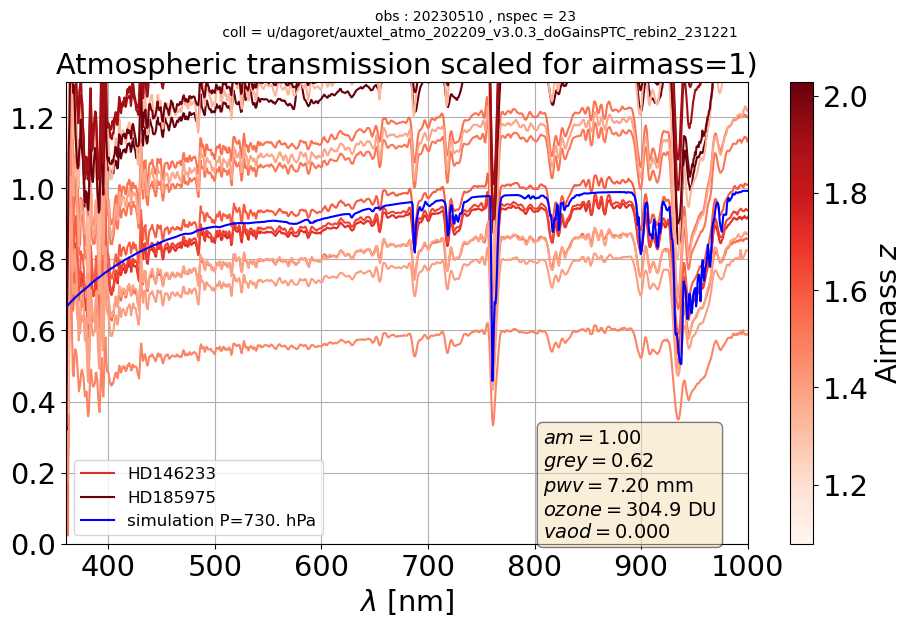

>>> ID.     :  20230511 [2023051100155, 2023051100203, 2023051100208, 2023051100233, 2023051100236, 2023051100252, 2023051100260]
>>> AIRMASS :  20230511 [2.12609636466074, 2.11347828604249, 2.11238762221875, 2.10333154555355, 2.10150949040569, 2.09519440372642, 2.09174818838066]
 mean atm parameters 1.0815239101018777 334.37537048273043 6.24553223837989 0.05689535107689777
AUXTEL site name validated as LSST observatory
AUXTEL site name validated as LSST observatory


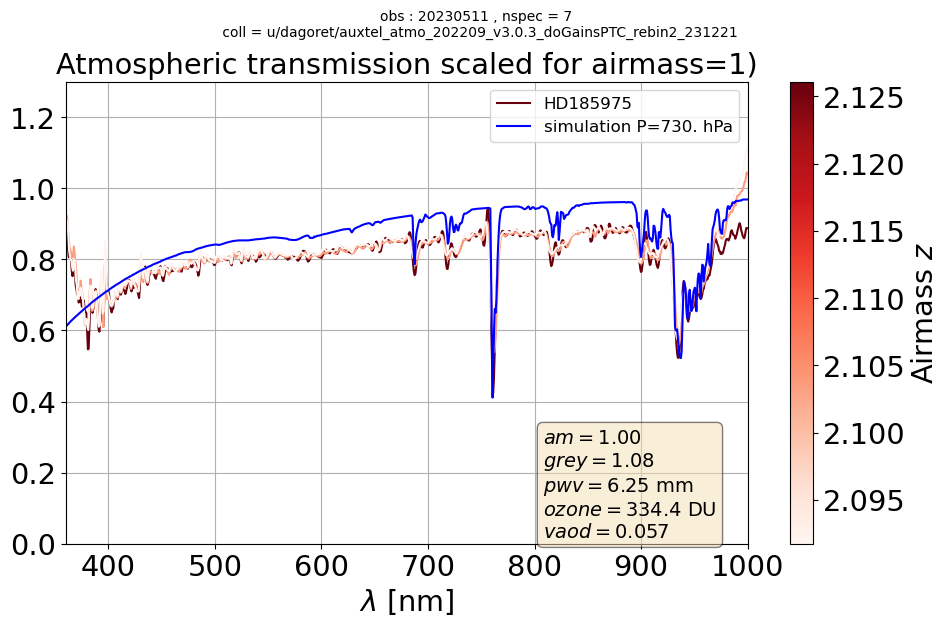

>>> ID.     :  20230523 [2023052300136, 2023052300163, 2023052300173, 2023052300178, 2023052300187, 2023052300192, 2023052300201, 2023052300243, 2023052300244, 2023052300261, 2023052300271, 2023052300285, 2023052300286, 2023052300290, 2023052300308, 2023052300309, 2023052300312, 2023052300327, 2023052300336, 2023052300337, 2023052300340, 2023052300364, 2023052300365, 2023052300368, 2023052300369, 2023052300378, 2023052300379, 2023052300382, 2023052300397, 2023052300406, 2023052300407, 2023052300410, 2023052300421, 2023052300424, 2023052300425, 2023052300435, 2023052300449, 2023052300463, 2023052300476, 2023052300525, 2023052300526, 2023052300536, 2023052300539, 2023052300540, 2023052300568, 2023052300605, 2023052300606]
>>> AIRMASS :  20230523 [2.34209652295272, 1.42485004666331, 2.10253732456904, 2.10040995721411, 1.4986015533225, 1.51391805003652, 1.53993210880586, 2.07730423077466, 2.07687694367977, 1.93291551732892, 1.86542899722453, 1.91126852098939, 1.91735728911085, 1.9392436300

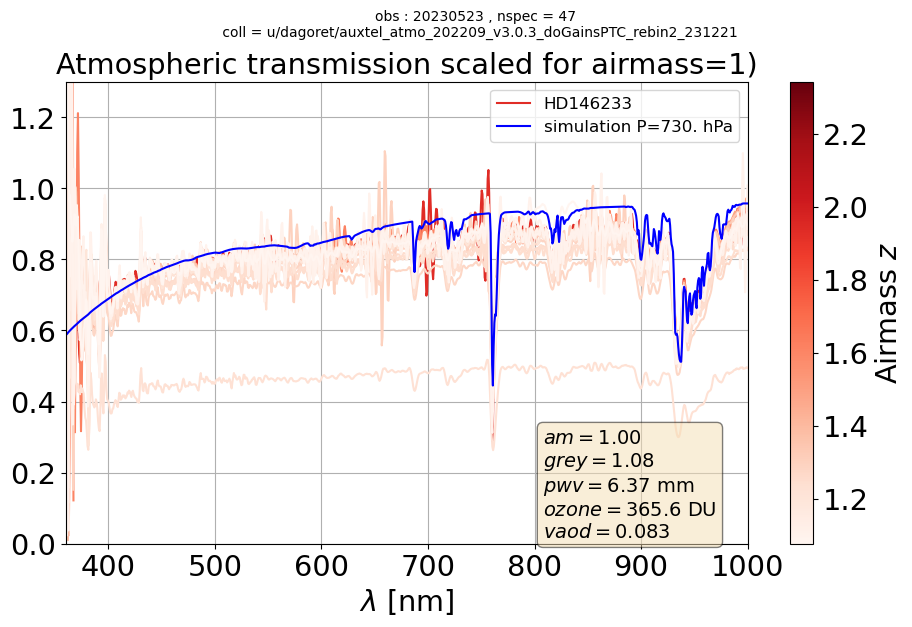

>>> ID.     :  20230524 [2023052400108, 2023052400122, 2023052400126, 2023052400140, 2023052400164, 2023052400165, 2023052400183, 2023052400220, 2023052400262, 2023052400313, 2023052400323, 2023052400324, 2023052400327, 2023052400328, 2023052400356, 2023052400366, 2023052400379, 2023052400384, 2023052400393, 2023052400397, 2023052400398, 2023052400411, 2023052400422, 2023052400425, 2023052400435, 2023052400439, 2023052400440, 2023052400449, 2023052400450, 2023052400453, 2023052400454, 2023052400463, 2023052400464, 2023052400467, 2023052400482, 2023052400483, 2023052400516, 2023052400529, 2023052400539, 2023052400544, 2023052400553, 2023052400554, 2023052400558, 2023052400568, 2023052400592, 2023052400614, 2023052400615, 2023052400632]
>>> AIRMASS :  20230524 [2.12465212286755, 2.0618336637087, 2.09396226073964, 2.21095463938341, 2.11000128927129, 2.10966898658168, 1.43985789481421, 1.53862194787178, 2.07847317785142, 1.72898184809466, 1.67961864517054, 1.67367463999926, 1.6595577477847

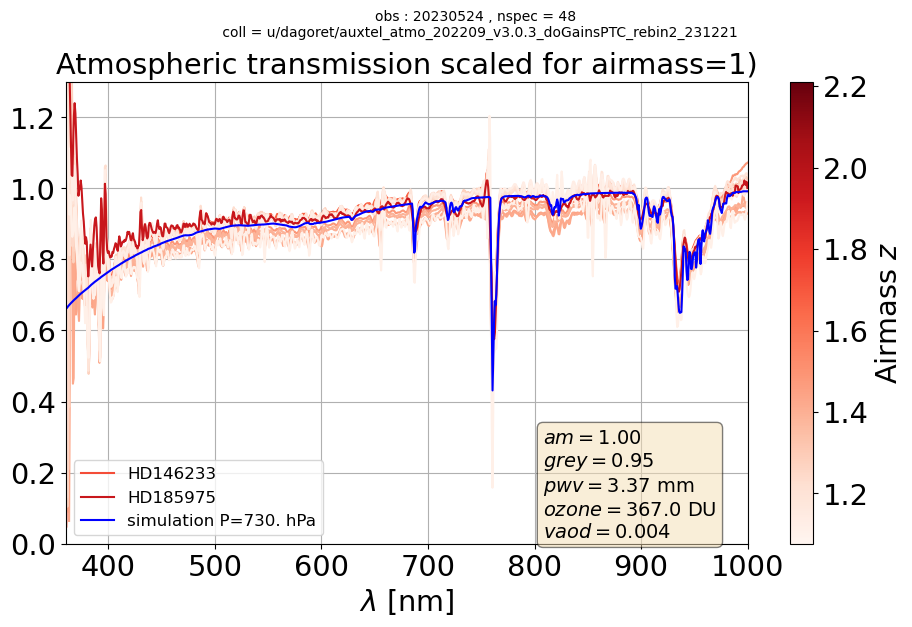

>>> ID.     :  20230718 [2023071800373, 2023071800374]
>>> AIRMASS :  20230718 [1.23317103363995, 1.23523476918121]


ValueError: too many values to unpack (expected 4)

In [64]:
allall_meas_atmtransmissions_z1 = []
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]
    
    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    #print(df_sel)
    
    if N> 1:
    #                              plot_atmtransmission_zcorr(filtered_spectra, [ spec.airmass for spec in spectra_filtered ],all_calspecs_sm,tel,disp,collection=my_collection,dateobs=DATEOBS )
        all_meas_atmtransmissions_z1 = plot_atmtransmission_zcorr_antatmsim(filtered_spectra, [ spec.airmass for spec in filtered_spectra ],all_calspecs_sm,tel,disp,collection=my_collection,dateobs=DATEOBS,df_atm = df_sel)
        allall_meas_atmtransmissions_z1.append(all_meas_atmtransmissions_z1)
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")
        allall_meas_atmtransmissions_z1.append([])
    

In [ ]:
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]

    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    #print(df_sel)
    

    if N> 1:   
        plot_atmtransmission_zcorr_antatmsim_ratio(filtered_spectra, [spec.airmass for spec in filtered_spectra],
                                                    all_calspecs_sm,tel,disp,collection = my_collection,dateobs=DATEOBS, df_atm = df_sel )
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")            

## Save in HDF5

In [ ]:
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]

    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    #print(df_sel)
    

    if N> 1:   
        savehdf5_atmtransmission_zcorr_antatmsim_ratio(filtered_spectra, [spec.airmass for spec in filtered_spectra],
                                                    all_calspecs_sm,tel,disp,collection = my_collection,dateobs=DATEOBS, df_atm = df_sel)
        #plot_atmtransmission_zcorr_antatmsim_ratio(filtered_spectra, [spec.airmass for spec in filtered_spectra],
        #                                            all_calspecs_sm,tel,disp,collection = my_collection,dateobs=DATEOBS, df_atm = df_sel )
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")    

# Total transmission and zero points

In [ ]:
def compute_total_transm(filter,meas_atmtransm):
    """
    """
    N = len(meas_atmtransm)
    bd = bandpass_inst[filter]
    func = interpolate.interp1d(x=bd.wavelen, y=bd.sb ,fill_value="extrapolate")
    all_total_transm = []
    for idx in range(N):
        the_wl = meas_atmtransm[idx][0]
        the_atm = meas_atmtransm[idx][1]
        the_totaltrans = the_atm * func(the_wl)
        all_total_transm.append((the_wl,the_totaltrans))
    return all_total_transm

In [ ]:
all_all_total_transm = []
all_selectednights = []

# loop on all transmission of a given night
for idx,  all_meas_atmtransmissions_z1 in enumerate(allall_meas_atmtransmissions_z1): 
    DATEOBS = ALL_DATEOBS[idx]

    if len(all_meas_atmtransmissions_z1)>1:
        all_selectednights.append(True) 
        all_total_transm = {} 
        # loop on filters
        for index,f in enumerate(filter_tagnames):
            all_total_transm[f] = compute_total_transm(f,all_meas_atmtransmissions_z1)
        
        all_all_total_transm.append(all_total_transm )
    else:
        all_all_total_transm.append({})
        all_selectednights.append(False) 
        

In [ ]:
for idx0,all_total_transm in enumerate(all_all_total_transm):
    
    DATEOBS = ALL_DATEOBS[idx0]
    if all_selectednights[idx0]:
    

        fig, axs = plt.subplots(1,1,figsize=(10,4))
        for index,f in enumerate(filter_tagnames):
    
            N = len(all_total_transm[f])
            for idx in range(N):
                the_wl = all_total_transm[f][idx][0] 
                the_tottransm = all_total_transm[f][idx][1] 
                if index==0 or index==5:
                    axs.plot(the_wl,the_tottransm ,color=filter_color[index],alpha=0.1) 
                else:
                    axs.plot(the_wl,the_tottransm ,color=filter_color[index]) 
            axs.axvline(FILTERWL[index,2],color=filter_color[index],linestyle="-.")
    
        axs.set_xlabel("$\\lambda$ (nm)")
        axs.set_title("Measured total Rubin-LSST filter throughput",fontsize=14)
        axs.set_ylim(0,0.6)
        suptitle = f"obs : {DATEOBS} , nspec = {N}\n coll = {my_collection}"
        plt.suptitle(suptitle,fontsize=10,y=1.0)
        plt.tight_layout()
        plt.show()    

### Compute integrals

In [ ]:
all_all_total_II0 = []
#all_all_total_II0_mjd = []


for idx0,all_total_transm in enumerate(all_all_total_transm):
    
    DATEOBS = ALL_DATEOBS[idx0]
    if all_selectednights[idx0]:
        
        all_total_II0 = {} 
        #all_total_II0_mjd = {}

        for index,f in enumerate(filter_tagnames):
    
            N = len(all_total_transm[f])
            all_II0 = np.zeros(N)
            #all_II0_mjd = np.zeros(N)
    
            for idx in range(N):
                the_wl = all_total_transm[f][idx][0] 
                the_tottransm = all_total_transm[f][idx][1] 
                all_II0[idx] = fII0(the_wl,the_tottransm)
                #all_II0_mjd[idx] = all_date_mjd[idx]

            all_total_II0[f] = all_II0
            #all_total_II0_mjd[f] = all_II0_mjd
        all_all_total_II0.append(all_total_II0)
        #all_all_total_II0_mjd.append({all_total_II0_mjd}) 
    else:
        all_all_total_II0.append({})
        #all_all_total_II0_mjd.append({}) 
        
        

In [ ]:
all_zp = []

for idx0, all_total_II0 in enumerate(all_all_total_II0):
    
    DATEOBS = ALL_DATEOBS[idx0]
    if all_selectednights[idx0]:
        zp = {}
        for index,f in enumerate(filter_tagnames):
            zp[f] = 2.5*np.log10(all_total_II0[f]) 
        
        all_zp.append(zp)
    else:
        all_zp.append({})

In [ ]:
for idx0, zp in enumerate(all_zp):
    DATEOBS = ALL_DATEOBS[idx0]
    if all_selectednights[idx0]:

        fig, axs = plt.subplots(1,4,figsize=(18,4))
        for index,f in enumerate(filter_tagnames):
            if index==0 or index==5:
                continue
            X = (zp[f] - np.median(zp[f]))*1000.
            N = len(X)
            X = X[np.where(np.abs(X)<50)]
            std = np.std(X)
            label = f"$\sigma$({f})={std:.1f} mmag"
            axs[index-1].hist(X,bins=30,range=(-50,50),color=filter_color[index],alpha=0.5,label=label)
            axs[index-1].grid()
            #axs.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            axs[index-1].legend(loc='upper left')
            axs[index-1].set_xlabel("ZP resolution (mmag)",fontsize=12)
        suptitle = f"obs : {DATEOBS} , nspec = {N}\n coll = {my_collection}"
        plt.suptitle(suptitle,fontsize=10,y=1.0)
        plt.tight_layout()
        plt.show()

### Summary for zero point repeatability 

In [ ]:
df_zp = pd.DataFrame(columns= ["dateobs","dZp_u","dZp_g","dZp_r","dZp_i","dZp_z","dZp_y"]) 
icount = 0
for idx0, zp in enumerate(all_zp):
    DATEOBS = ALL_DATEOBS[idx0]
    data = []
    
    if all_selectednights[idx0]:
        data.append(int(DATEOBS))
        for index,f in enumerate(filter_tagnames): 
            X = (zp[f] - np.median(zp[f]))*1000.
            N = len(X)
            X = X[np.where(np.abs(X)<50)]
            std = np.std(X)
            data.append(std)

        df_zp.loc[icount] = data
        icount +=1
            
           

In [ ]:
df_zp

In [ ]:
df_zp.to_csv("zp_fall2023.csv")

In [ ]:
def convertNumToDatestr(num):
    num = int(num)
    year = num//10_000
    month= (num-year*10_000)//100
    day = (num-year*10_000-month*100)

    year_str = str(year).zfill(4)
    month_str = str(month).zfill(2)
    day_str = str(day).zfill(2)
    
    datestr = f"{year_str}-{month_str}-{day_str}"
    return pd.to_datetime(datestr)

In [ ]:
df_zp["dateobsstr"] = df_zp["dateobs"].apply(convertNumToDatestr)

In [ ]:
df_zp["datetime"] = pd.to_datetime(df_zp["dateobsstr"])

In [ ]:
import matplotlib.dates as mdates
month_locator = mdates.MonthLocator(interval=1)
day_locator = mdates.DayLocator(interval=4)
hour_locator = mdates.HourLocator(interval=6)

fmt = '%D %H:%M:'
#year_month_formatter = mdates.DateFormatter(fmt) 
year_month_formatter = mdates.DateFormatter("%Y-%m-%d") 

fig, ax = plt.subplots(1,1,figsize=(18, 6))

ax.plot(df_zp["datetime"],df_zp["dZp_g"],marker="o",ms=15,color="g",lw=0.5,label="g filter")
ax.plot(df_zp["datetime"],df_zp["dZp_r"],marker="o",ms=15,color="r",lw=0.5,label="r filter")
ax.plot(df_zp["datetime"],df_zp["dZp_i"],marker="o",ms=15,color="orange",lw=0.5,label="i filter")
ax.plot(df_zp["datetime"],df_zp["dZp_z"],marker="o",ms=15,color="grey",lw=0.5,label="z filter")
ax.legend()
#ax.xaxis.set_major_locator(month_locator) # Locator for major axis only.
ax.xaxis.set_major_locator(day_locator)
ax.xaxis.set_minor_locator(hour_locator)
ax.xaxis.set_major_formatter(year_month_formatter)
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=30, ha='right')
ax.grid()
ax.set_ylim(0.,20.)
ax.axhline(5,color="k")
ax.set_xlabel("date observation")
ax.set_ylabel("$\Delta Z_p$ (mmag)")
ax.set_title("Repeatability of Zero point predicted by Auxtel Spectroscopy")